In [ ]:
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [ ]:
def show(tensor, ch=1, size=(28,28), num=16):
  # tensor: 128 x 784
  data=tensor.detach().cpu().view(-1,ch,*size) # 128 x 1 x 28 x 28
  grid = make_grid(data[:num], nrow=4).permute(1,2,0)   # 1 x 28 x 28  = 28 x 28 x 1
  plt.imshow(grid)
  plt.show()

In [ ]:
# setup of the main parameters and hyperparameters
epochs = 500
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),shuffle=True, batch_size=bs)

# number of steps = 60000 / 128 = 468.75

100%|██████████| 9912422/9912422 [00:00<00:00, 140584820.29it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 19124675.37it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 46680738.13it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 6466574.60it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
# declare our models

# Generator
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim), # 64, 128
        genBlock(h_dim, h_dim*2), # 128, 256
        genBlock(h_dim*2, h_dim*4), # 256 x 512
        genBlock(h_dim*4, h_dim*8), # 512, 1024
        nn.Linear(h_dim*8, i_dim), # 1024, 784 (28x28)
        nn.Sigmoid(),
    )

  def forward(self, noise):
       return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

## Discriminator
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc=nn.Sequential(
        discBlock(i_dim, h_dim*4), # 784, 1024
        discBlock(h_dim*4, h_dim*2), # 1024, 512
        discBlock(h_dim*2, h_dim), # 512, 256
        nn.Linear(h_dim, 1) # 256, 1
    )

  def forward(self, image):
      return self.disc(image)

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([0, 2, 5, 3, 3, 7, 9, 9, 4, 0])


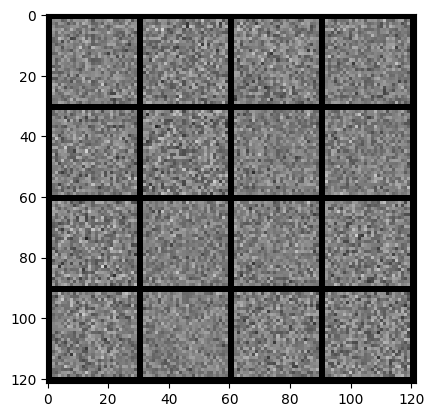

In [ ]:
x,y=next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [ ]:
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   pred = disc(fake)
   targets=torch.ones_like(pred)
   gen_loss=loss_func(pred,targets)

   return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   disc_fake = disc(fake.detach())
   disc_fake_targets=torch.zeros_like(disc_fake)
   disc_fake_loss=loss_func(disc_fake, disc_fake_targets)

   disc_real = disc(real)
   disc_real_targets=torch.ones_like(disc_real)
   disc_real_loss=loss_func(disc_real, disc_real_targets)

   disc_loss=(disc_fake_loss+disc_real_loss)/2

   return disc_loss

  0%|          | 0/469 [00:00<?, ?it/s]

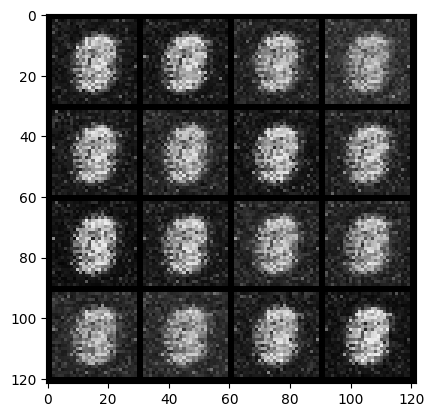

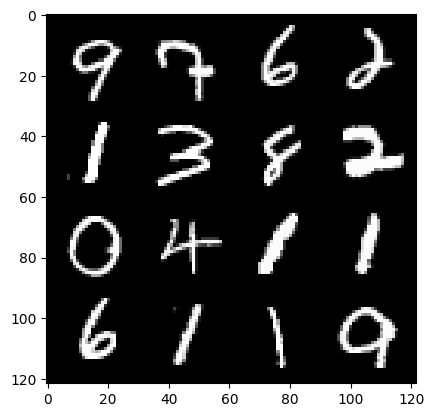

0: step 300 / Gen loss: 1.9488147479295725 / disc_loss: 0.33874141231179267


  0%|          | 0/469 [00:00<?, ?it/s]

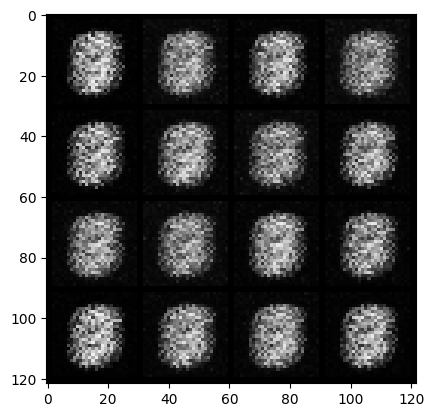

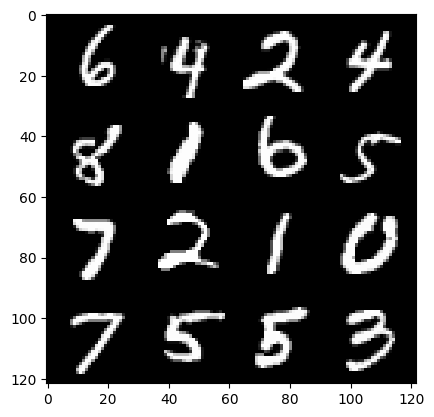

1: step 600 / Gen loss: 3.5164088296890266 / disc_loss: 0.11228239292899768


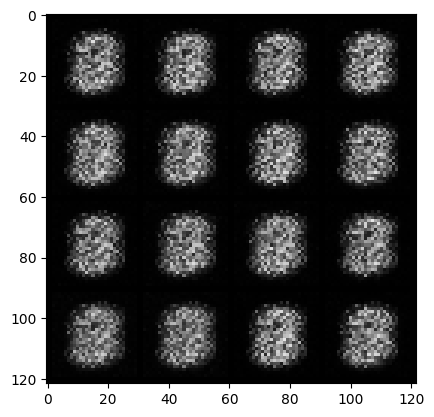

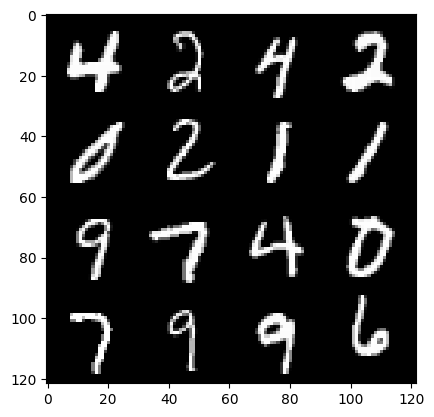

1: step 900 / Gen loss: 3.522794866561889 / disc_loss: 0.05163914242138464


  0%|          | 0/469 [00:00<?, ?it/s]

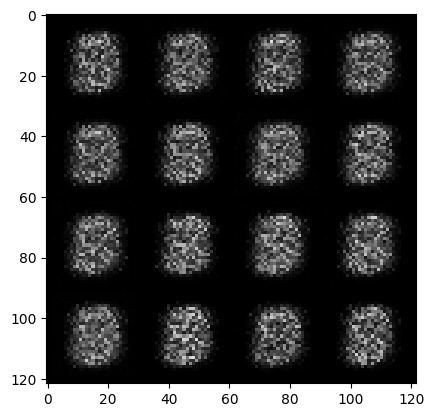

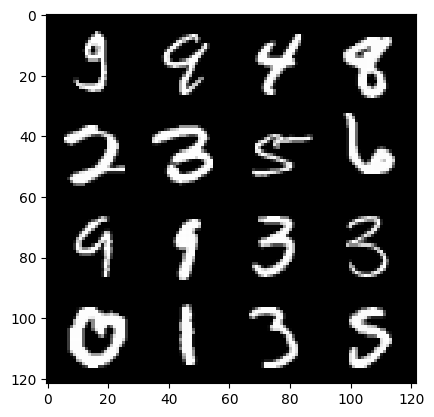

2: step 1200 / Gen loss: 3.5643432029088333 / disc_loss: 0.03604416335001589


  0%|          | 0/469 [00:00<?, ?it/s]

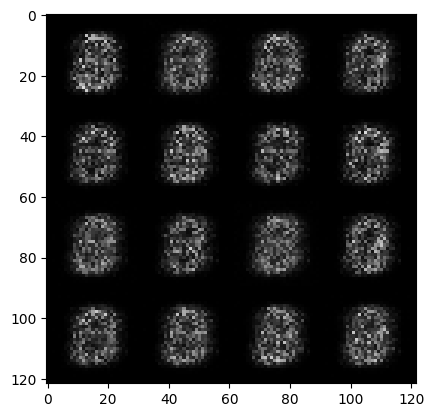

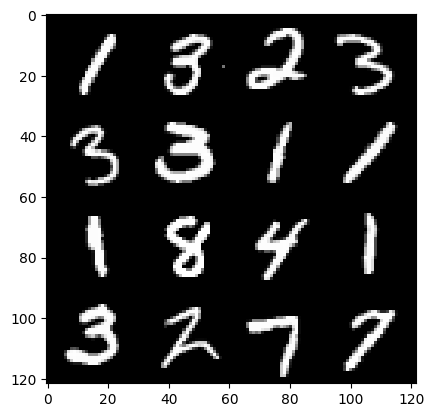

3: step 1500 / Gen loss: 3.421157952944438 / disc_loss: 0.04005221787840127


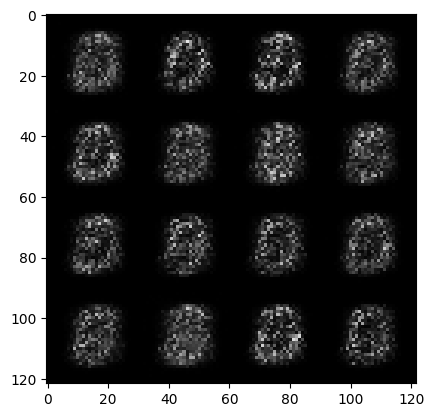

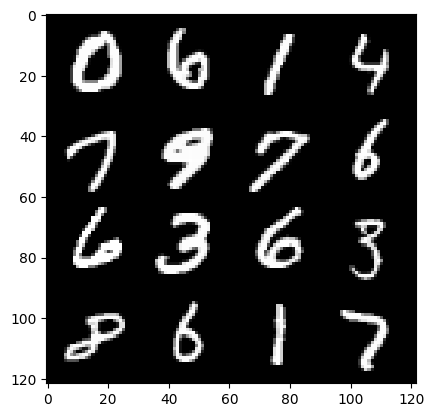

3: step 1800 / Gen loss: 3.33052076180776 / disc_loss: 0.051426957050959274


  0%|          | 0/469 [00:00<?, ?it/s]

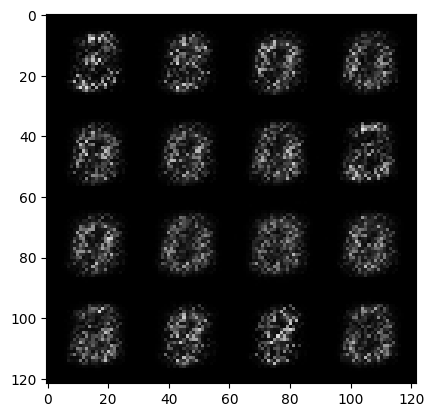

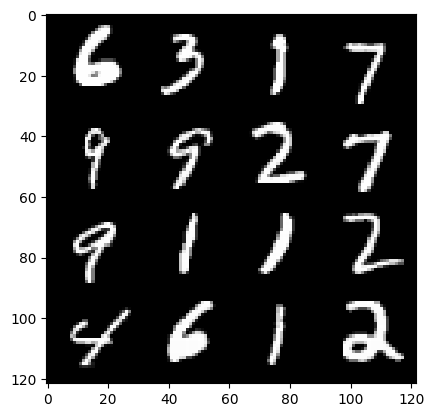

4: step 2100 / Gen loss: 3.4346181583404545 / disc_loss: 0.05348311008264618


  0%|          | 0/469 [00:00<?, ?it/s]

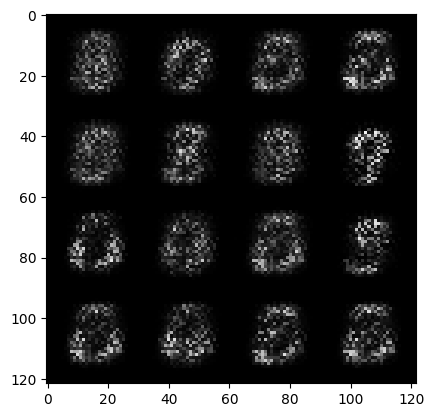

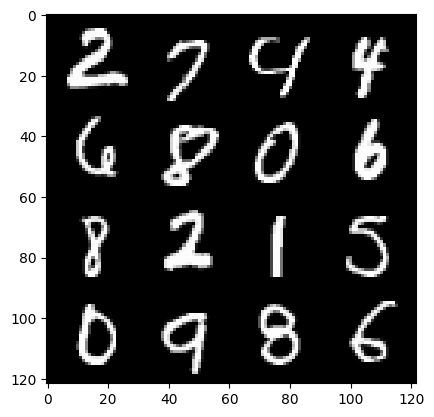

5: step 2400 / Gen loss: 3.864952688217167 / disc_loss: 0.045866840134064356


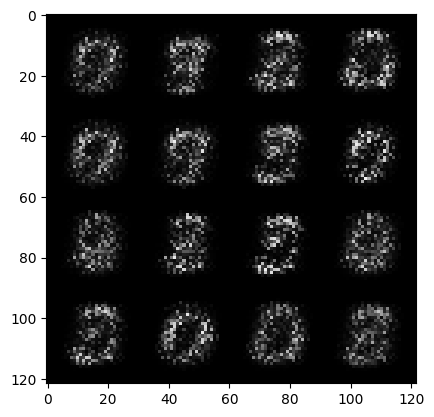

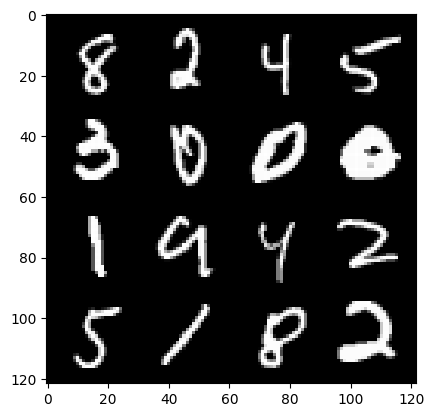

5: step 2700 / Gen loss: 4.007940708001453 / disc_loss: 0.037755285501480086


  0%|          | 0/469 [00:00<?, ?it/s]

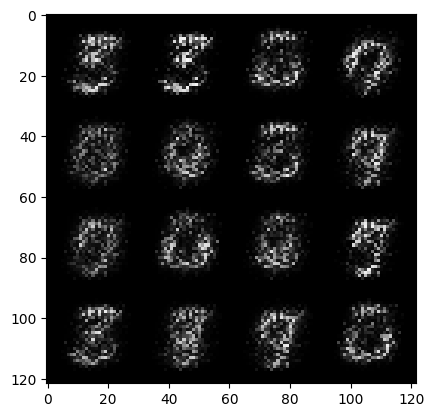

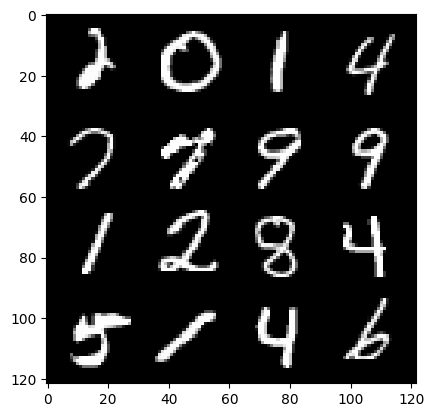

6: step 3000 / Gen loss: 4.800155571301775 / disc_loss: 0.028210791119684782


  0%|          | 0/469 [00:00<?, ?it/s]

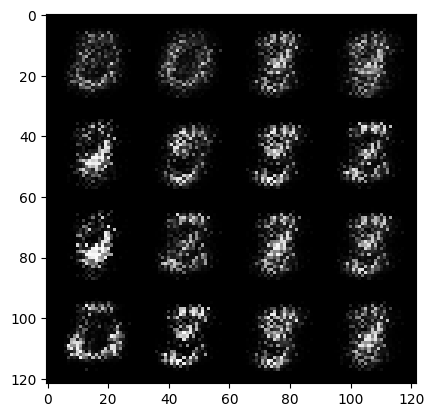

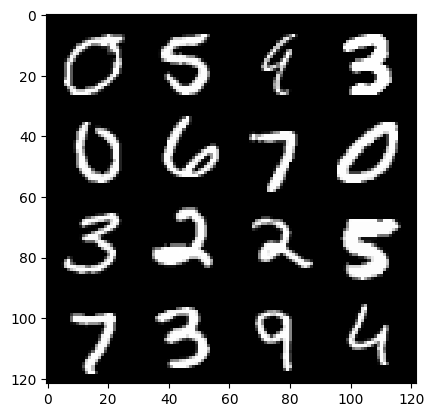

7: step 3300 / Gen loss: 5.052415720621747 / disc_loss: 0.025590935188035166


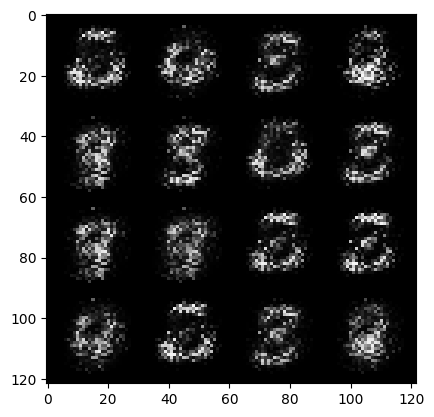

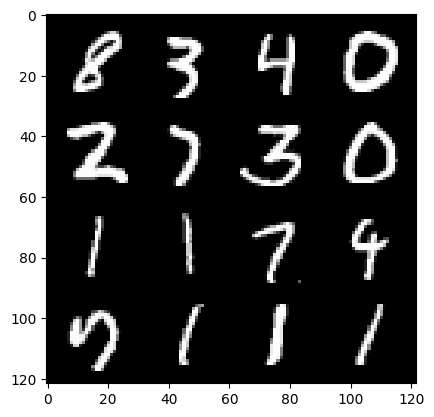

7: step 3600 / Gen loss: 5.300175671577461 / disc_loss: 0.020879322520146758


  0%|          | 0/469 [00:00<?, ?it/s]

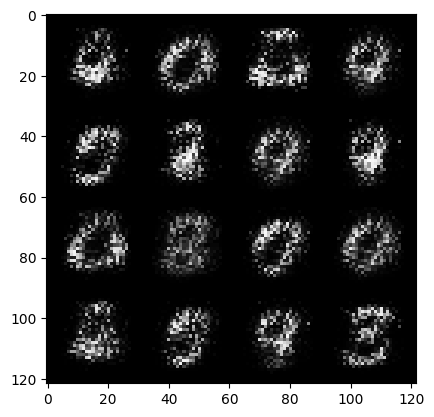

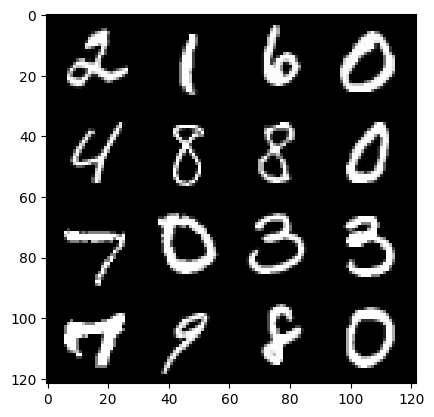

8: step 3900 / Gen loss: 5.199739944140122 / disc_loss: 0.016347902572403344


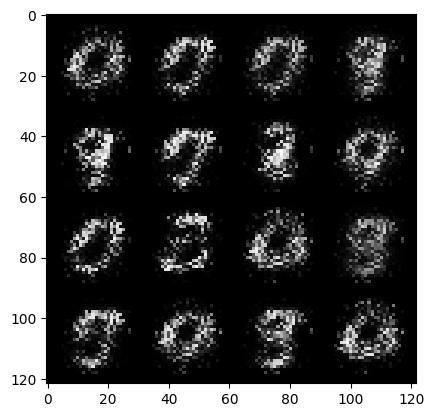

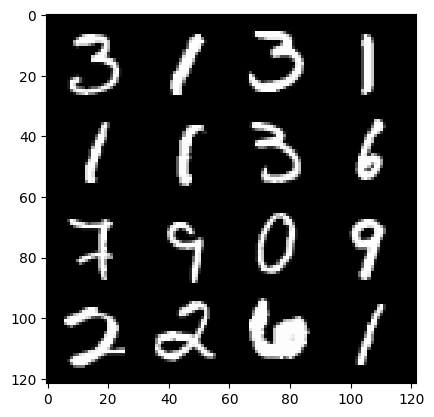

8: step 4200 / Gen loss: 5.563863525390626 / disc_loss: 0.014313888385271046


  0%|          | 0/469 [00:00<?, ?it/s]

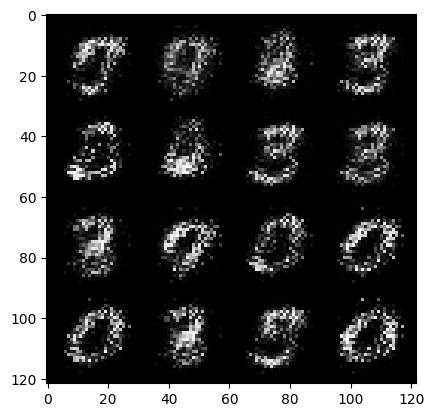

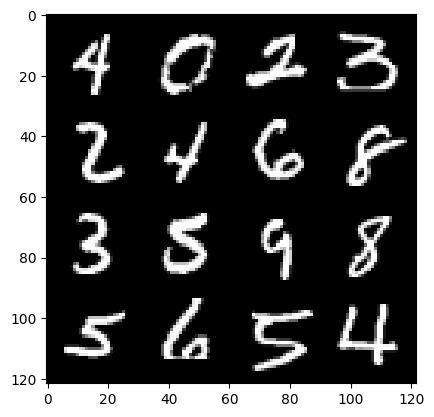

9: step 4500 / Gen loss: 5.897543209393819 / disc_loss: 0.012270389441400761


  0%|          | 0/469 [00:00<?, ?it/s]

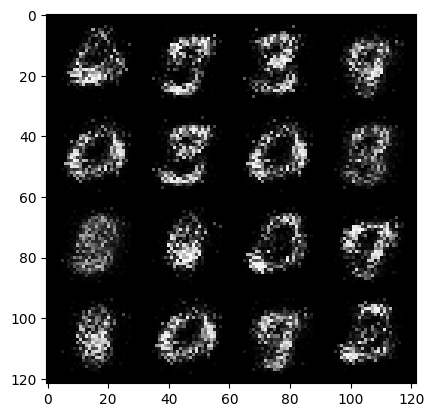

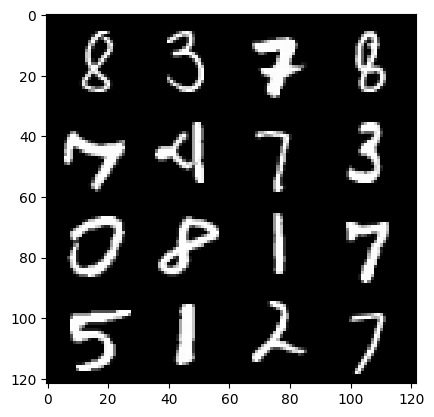

10: step 4800 / Gen loss: 6.325407749811806 / disc_loss: 0.012881993427872667


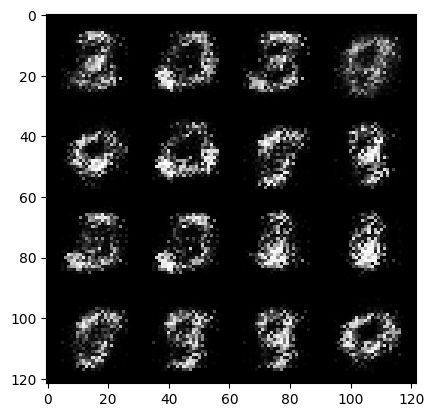

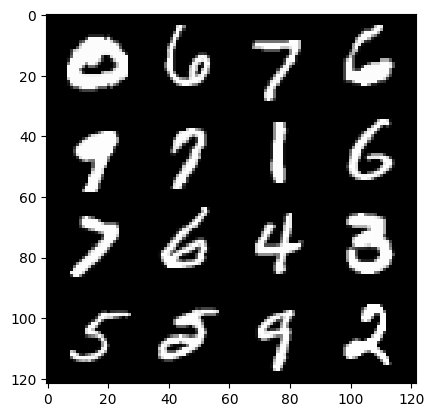

10: step 5100 / Gen loss: 6.25405791759491 / disc_loss: 0.013822183723871896


  0%|          | 0/469 [00:00<?, ?it/s]

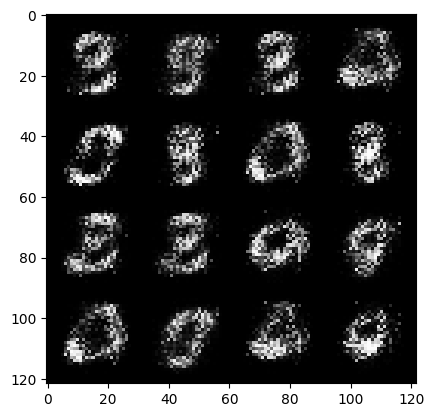

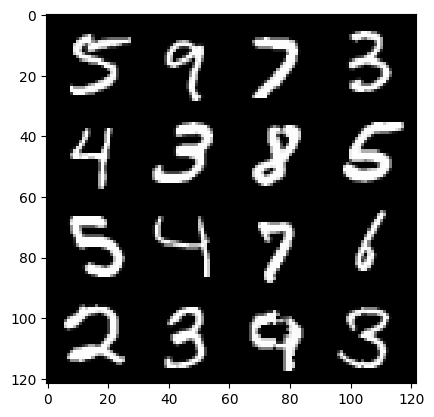

11: step 5400 / Gen loss: 6.1867812442779515 / disc_loss: 0.0169304100346441


  0%|          | 0/469 [00:00<?, ?it/s]

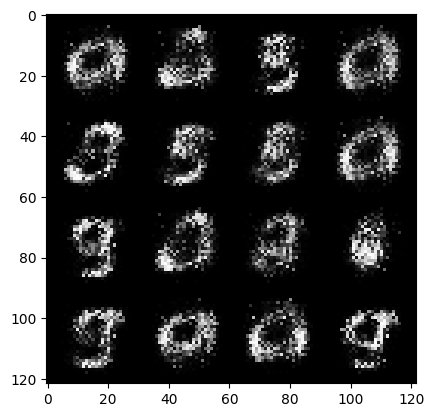

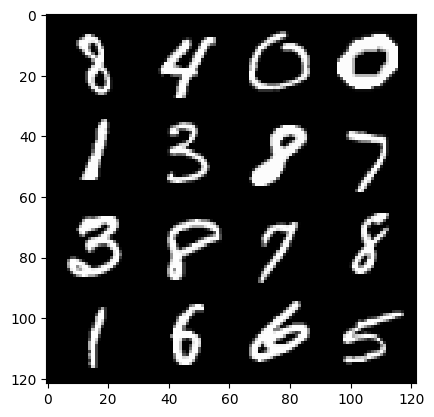

12: step 5700 / Gen loss: 6.493228500684097 / disc_loss: 0.01516627331419537


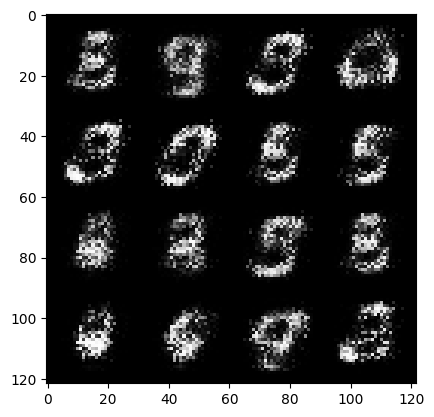

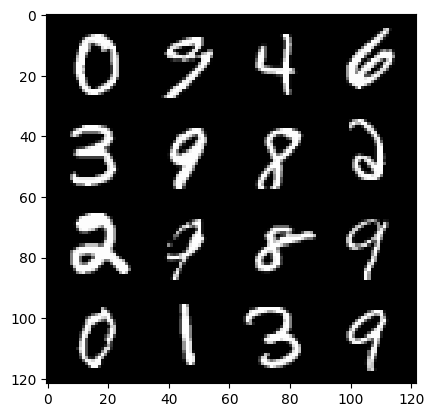

12: step 6000 / Gen loss: 6.458102639516191 / disc_loss: 0.014888871770041688


  0%|          | 0/469 [00:00<?, ?it/s]

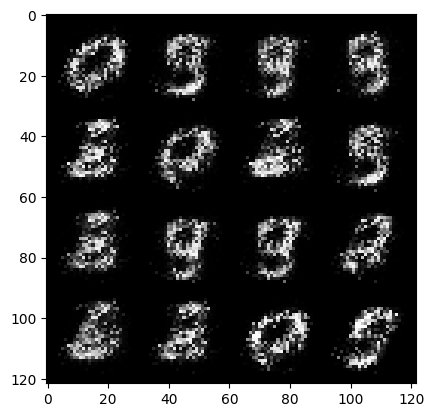

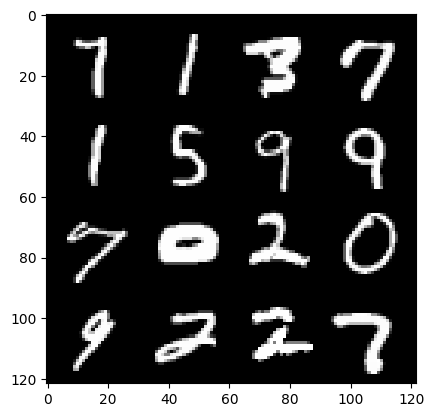

13: step 6300 / Gen loss: 6.42135135650635 / disc_loss: 0.013121960970262683


  0%|          | 0/469 [00:00<?, ?it/s]

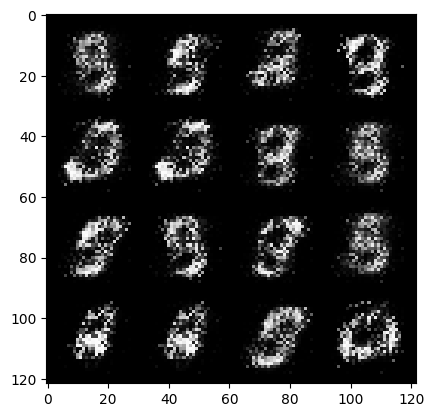

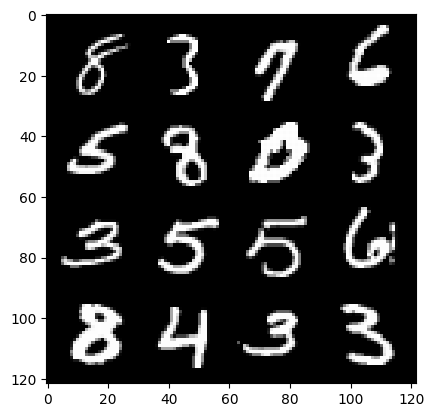

14: step 6600 / Gen loss: 6.758335924148561 / disc_loss: 0.010895714269330094


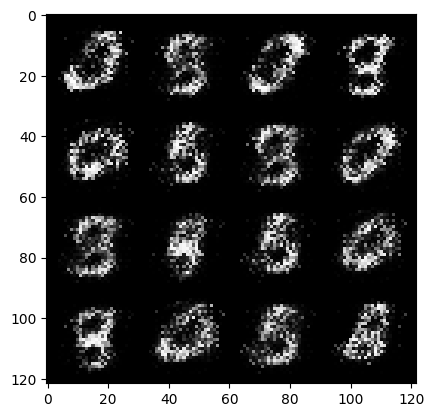

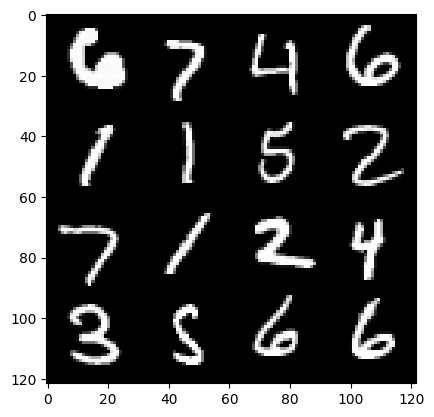

14: step 6900 / Gen loss: 7.0335094658533714 / disc_loss: 0.009708957084609816


  0%|          | 0/469 [00:00<?, ?it/s]

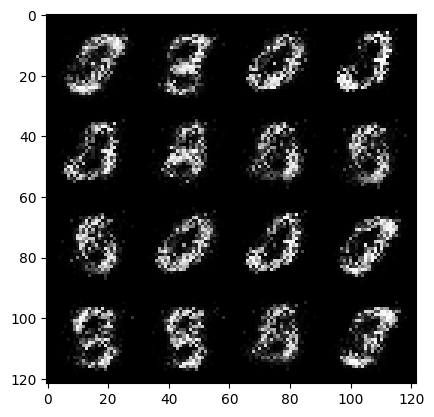

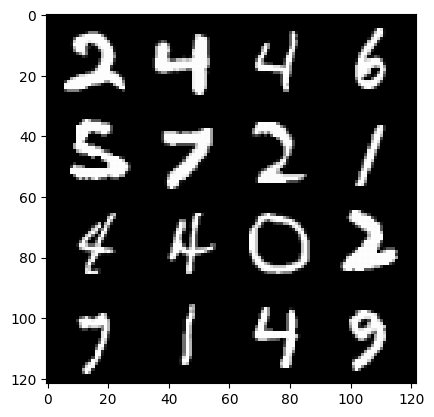

15: step 7200 / Gen loss: 6.873367552757266 / disc_loss: 0.009635649515160681


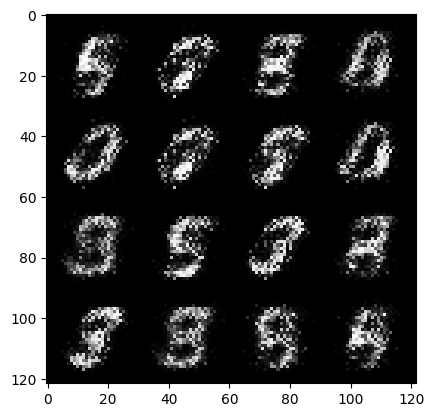

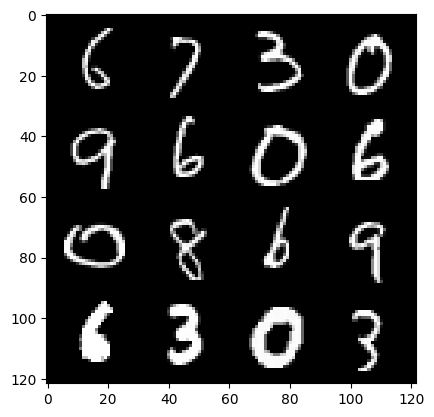

15: step 7500 / Gen loss: 6.914025438626608 / disc_loss: 0.009749224280628067


  0%|          | 0/469 [00:00<?, ?it/s]

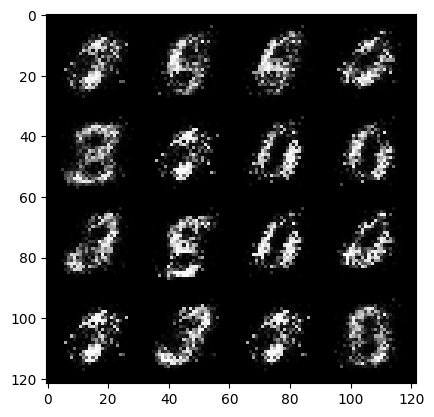

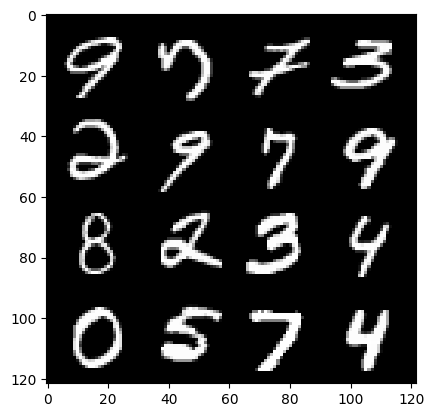

16: step 7800 / Gen loss: 6.566472824414568 / disc_loss: 0.011292753436136992


  0%|          | 0/469 [00:00<?, ?it/s]

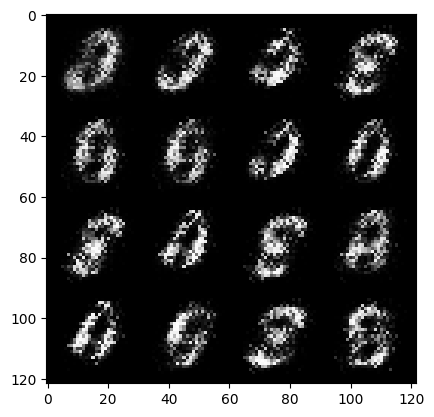

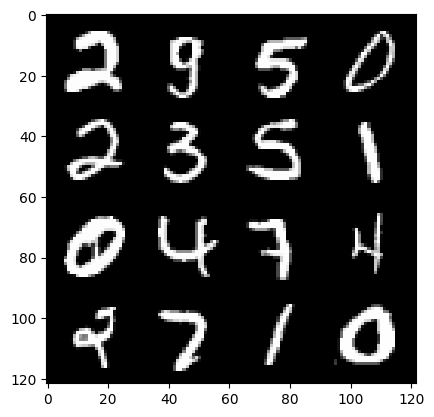

17: step 8100 / Gen loss: 6.544925031661986 / disc_loss: 0.012157226135799044


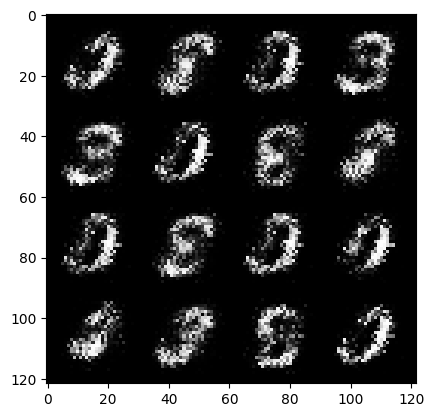

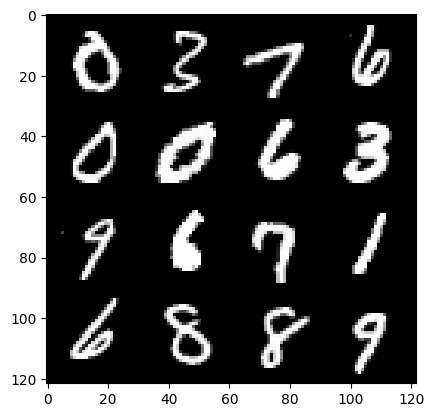

17: step 8400 / Gen loss: 7.063685312271118 / disc_loss: 0.009809639549348501


  0%|          | 0/469 [00:00<?, ?it/s]

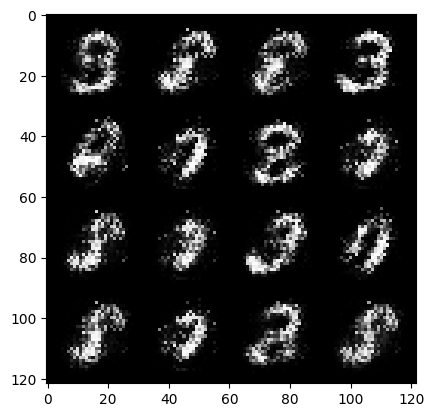

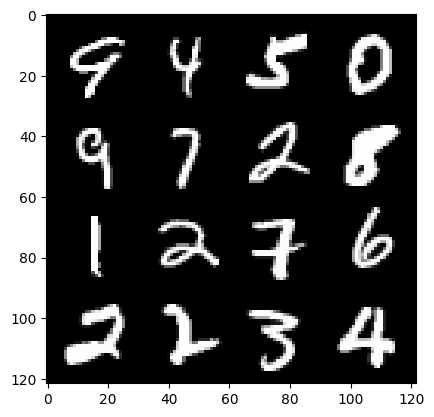

18: step 8700 / Gen loss: 6.6945286862055475 / disc_loss: 0.009858504158134263


  0%|          | 0/469 [00:00<?, ?it/s]

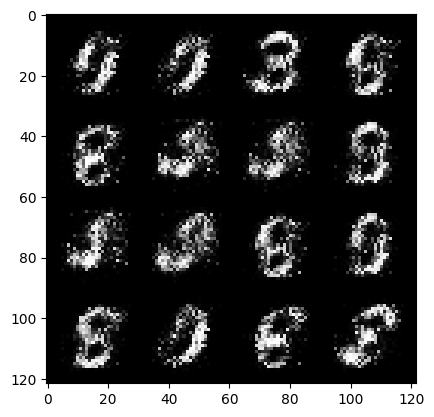

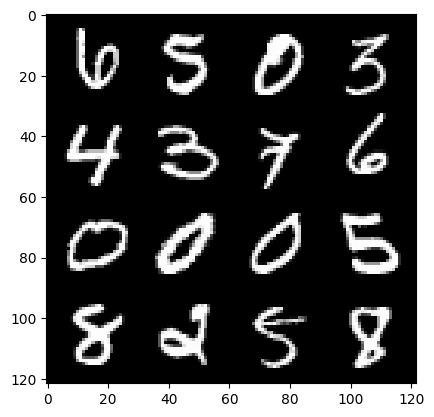

19: step 9000 / Gen loss: 6.952769757906595 / disc_loss: 0.009931599497795105


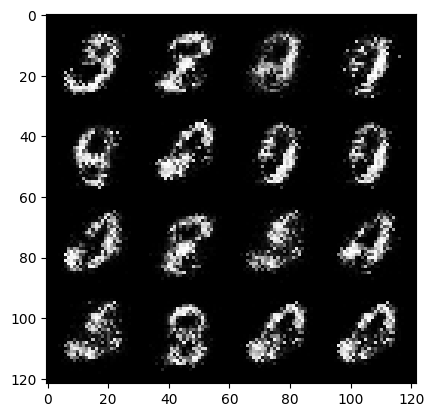

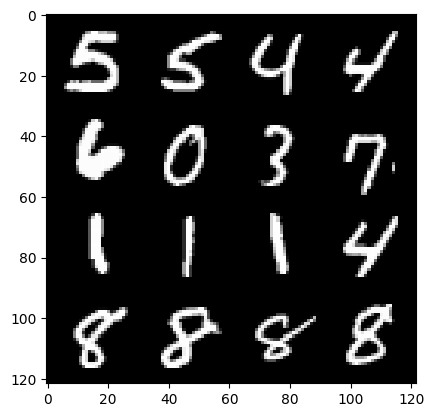

19: step 9300 / Gen loss: 7.166103628476462 / disc_loss: 0.010991861497362448


  0%|          | 0/469 [00:00<?, ?it/s]

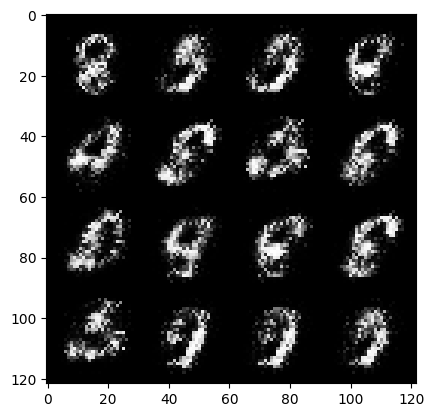

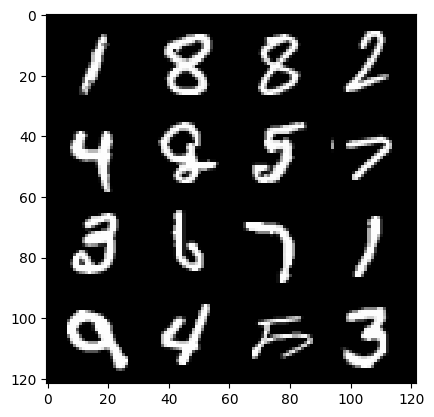

20: step 9600 / Gen loss: 7.1151531187693235 / disc_loss: 0.010360306188619384


  0%|          | 0/469 [00:00<?, ?it/s]

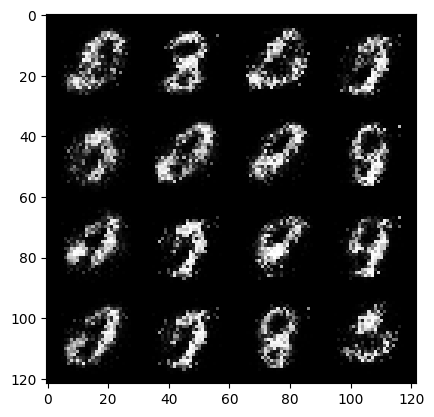

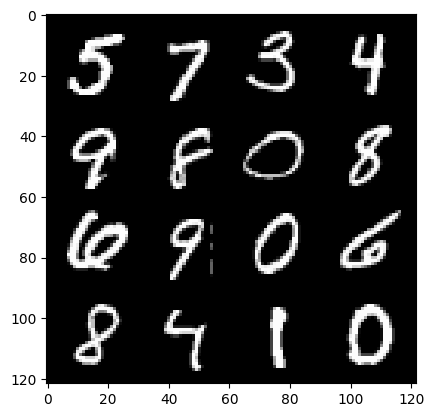

21: step 9900 / Gen loss: 6.675206147829694 / disc_loss: 0.011891975344624373


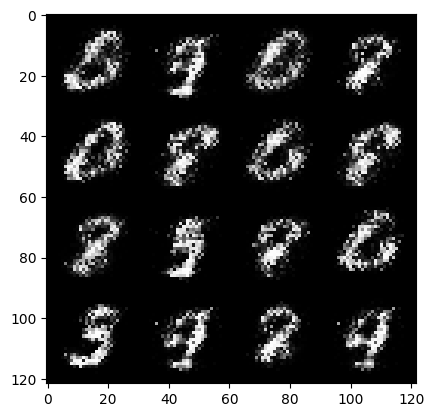

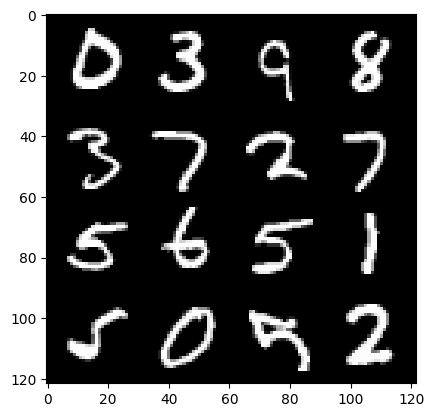

21: step 10200 / Gen loss: 7.174306848843893 / disc_loss: 0.010655575963901355


  0%|          | 0/469 [00:00<?, ?it/s]

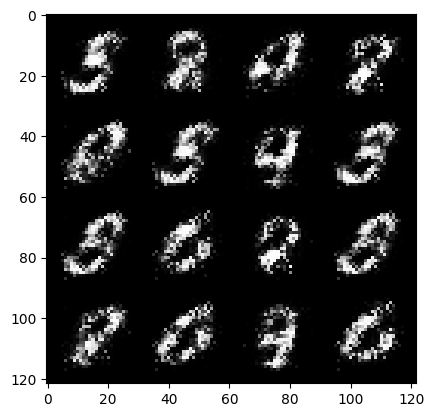

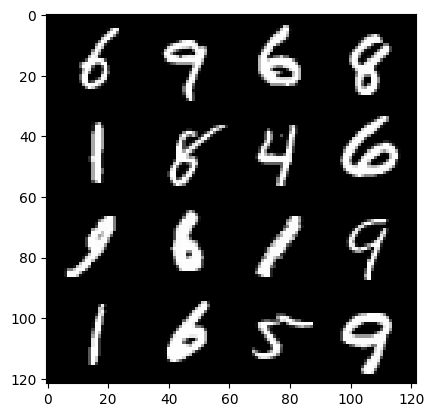

22: step 10500 / Gen loss: 6.897996350924177 / disc_loss: 0.010489358054862053


  0%|          | 0/469 [00:00<?, ?it/s]

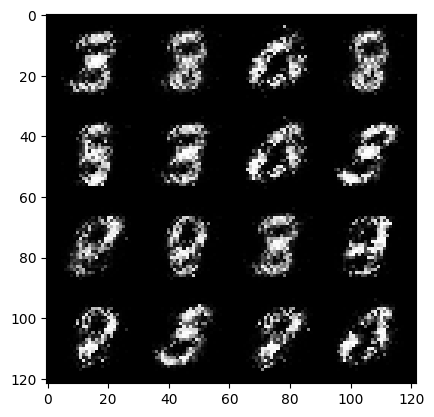

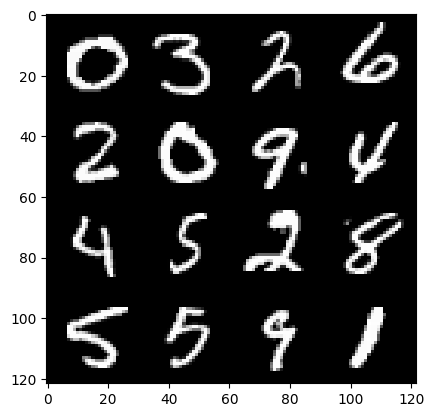

23: step 10800 / Gen loss: 7.0983124128977435 / disc_loss: 0.010253125213008989


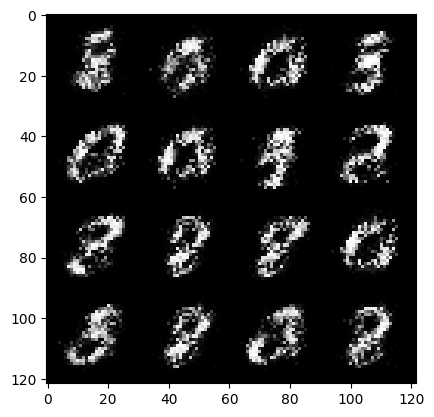

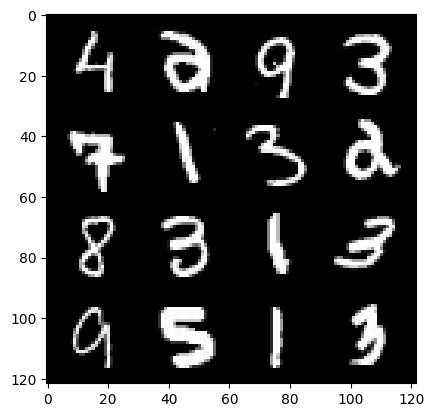

23: step 11100 / Gen loss: 7.543935716946925 / disc_loss: 0.010042265929126487


  0%|          | 0/469 [00:00<?, ?it/s]

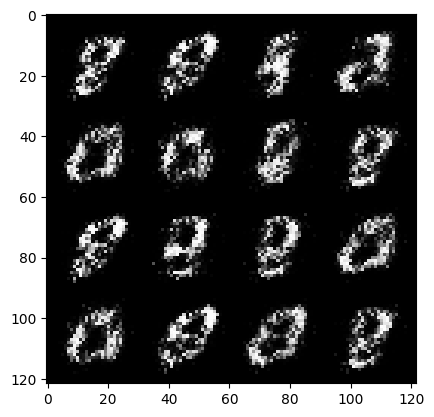

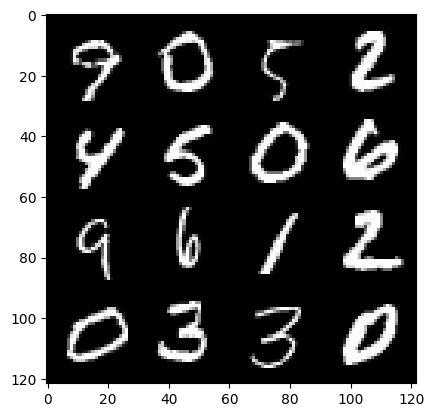

24: step 11400 / Gen loss: 7.232462479273482 / disc_loss: 0.01092462311770457


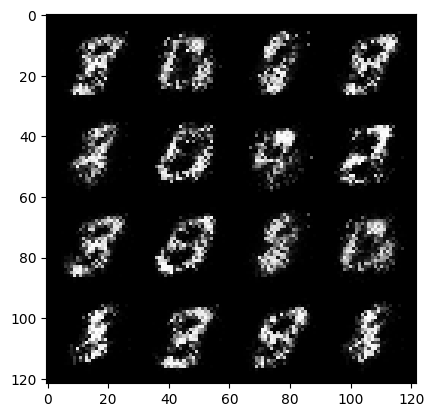

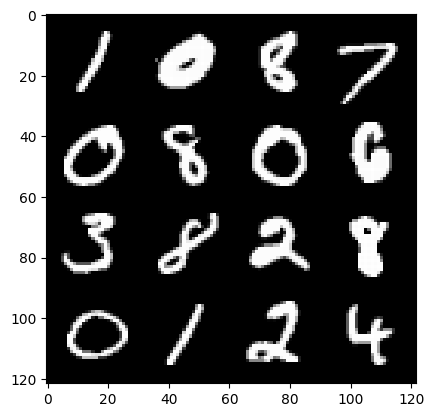

24: step 11700 / Gen loss: 7.04926401297251 / disc_loss: 0.012183985819574451


  0%|          | 0/469 [00:00<?, ?it/s]

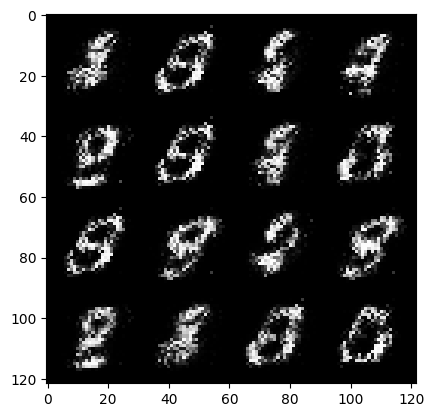

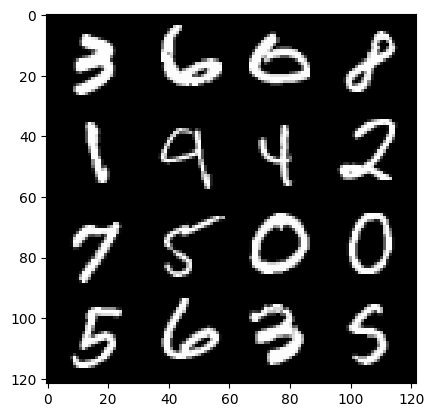

25: step 12000 / Gen loss: 6.908428381284074 / disc_loss: 0.012063483914826074


  0%|          | 0/469 [00:00<?, ?it/s]

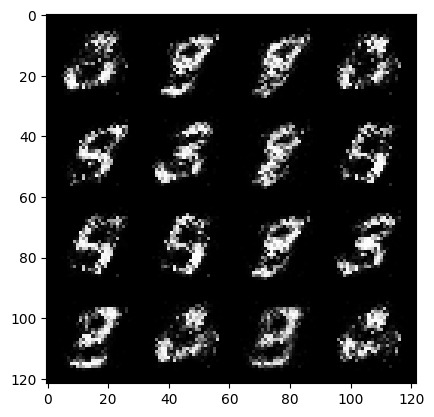

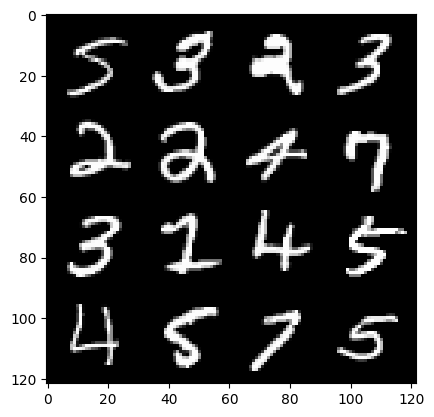

26: step 12300 / Gen loss: 6.865747628211978 / disc_loss: 0.011659374680602925


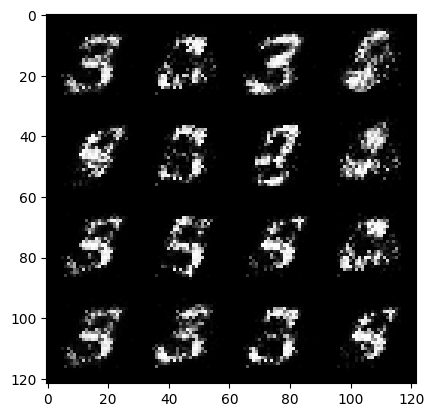

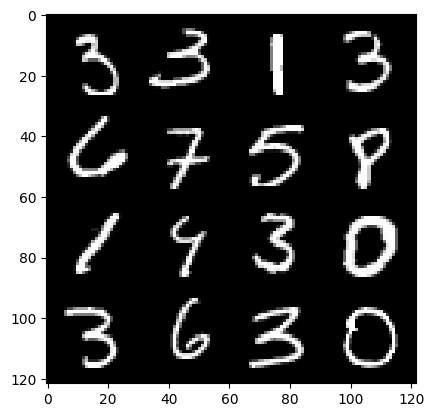

26: step 12600 / Gen loss: 6.877446246147164 / disc_loss: 0.011903895848275479


  0%|          | 0/469 [00:00<?, ?it/s]

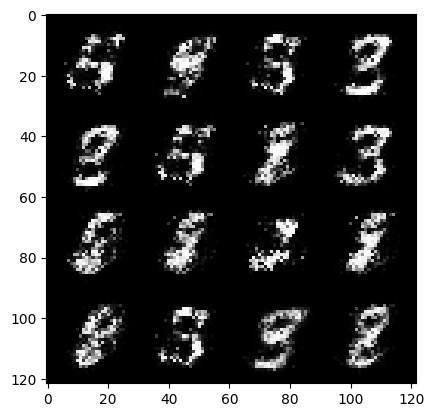

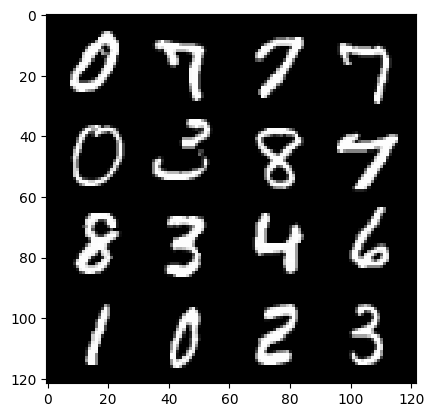

27: step 12900 / Gen loss: 6.9525427500406884 / disc_loss: 0.01343148240741964


  0%|          | 0/469 [00:00<?, ?it/s]

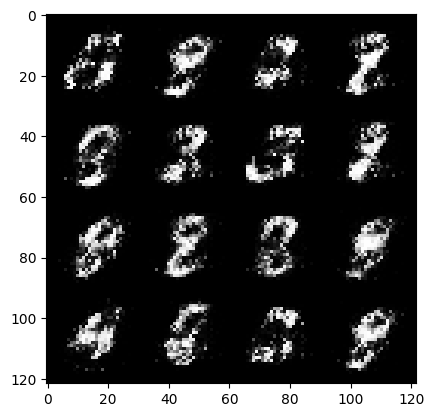

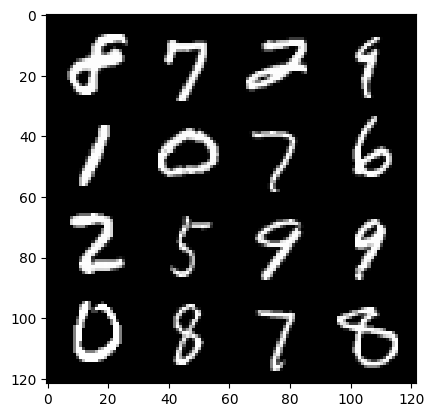

28: step 13200 / Gen loss: 6.833889937400821 / disc_loss: 0.013506076878402384


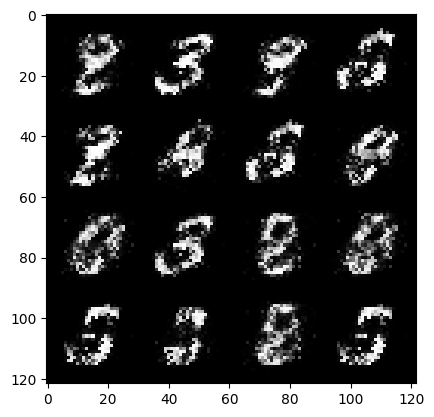

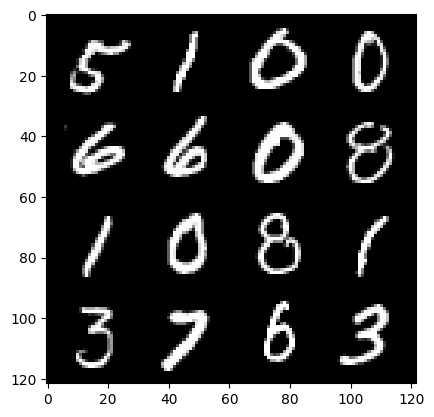

28: step 13500 / Gen loss: 7.038709578514102 / disc_loss: 0.012141469819083187


  0%|          | 0/469 [00:00<?, ?it/s]

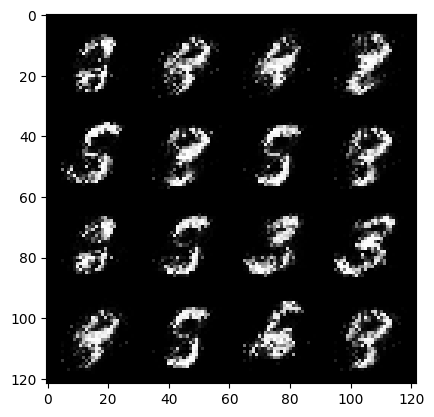

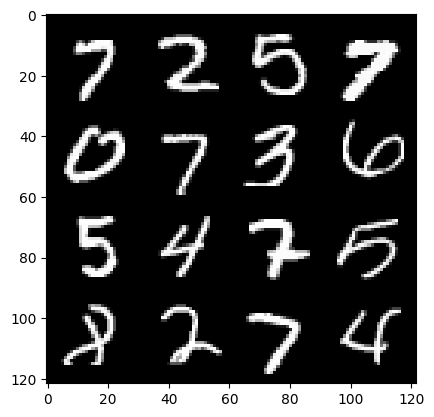

29: step 13800 / Gen loss: 6.475423838297525 / disc_loss: 0.01230694891186431


  0%|          | 0/469 [00:00<?, ?it/s]

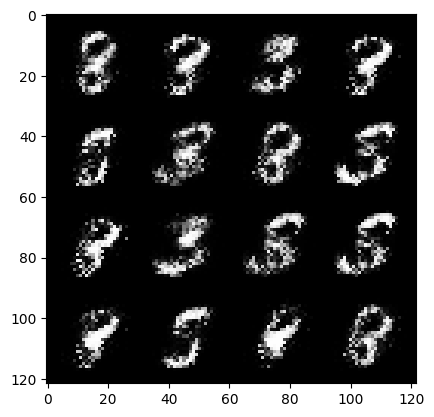

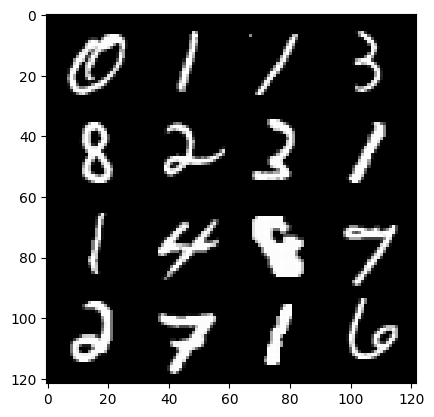

30: step 14100 / Gen loss: 6.876506792704267 / disc_loss: 0.015222321719629686


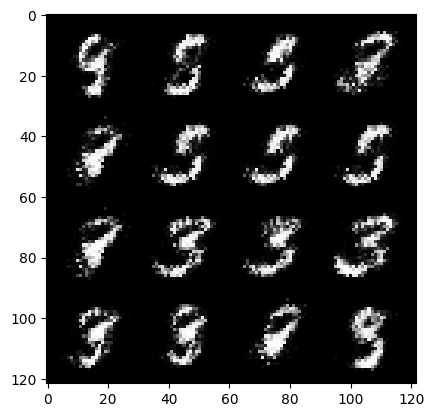

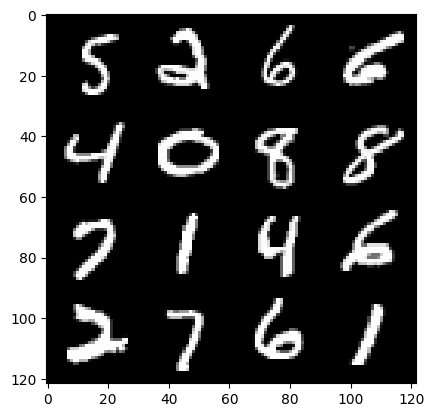

30: step 14400 / Gen loss: 6.309430476824446 / disc_loss: 0.020817211494625846


  0%|          | 0/469 [00:00<?, ?it/s]

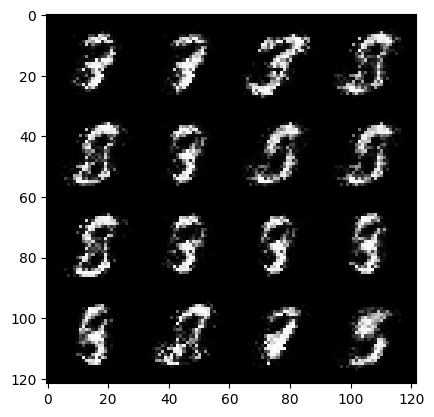

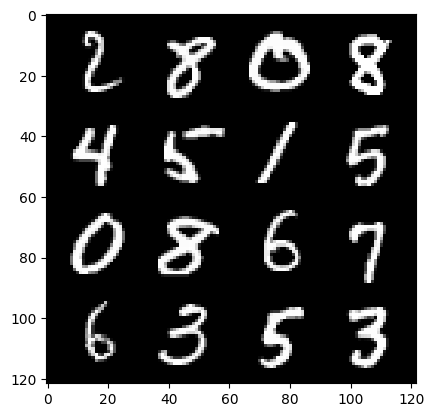

31: step 14700 / Gen loss: 5.9751157140731825 / disc_loss: 0.02682658238026005


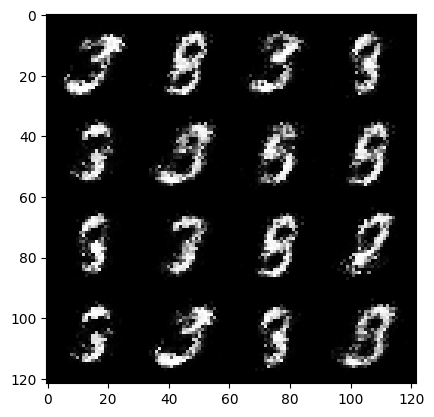

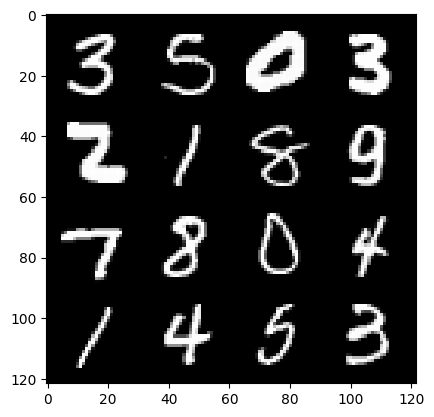

31: step 15000 / Gen loss: 6.126699533462522 / disc_loss: 0.023221769852874188


  0%|          | 0/469 [00:00<?, ?it/s]

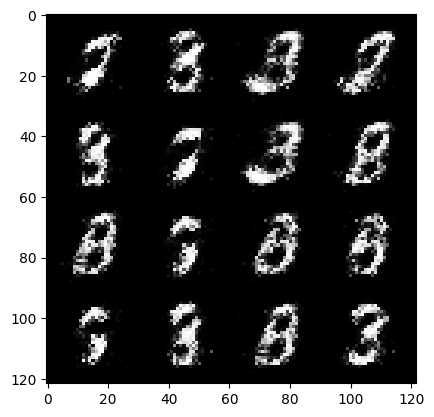

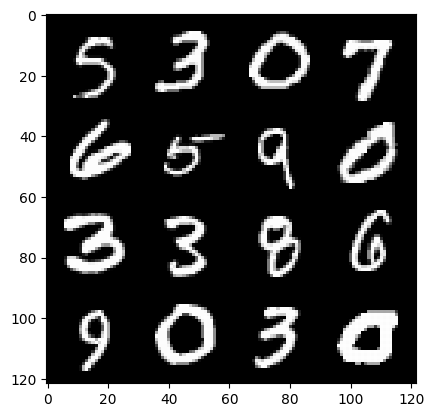

32: step 15300 / Gen loss: 6.129357217152907 / disc_loss: 0.020764549369923783


  0%|          | 0/469 [00:00<?, ?it/s]

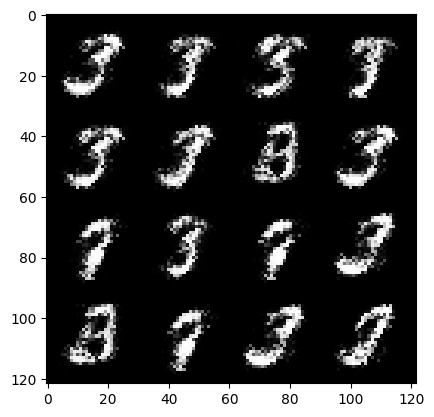

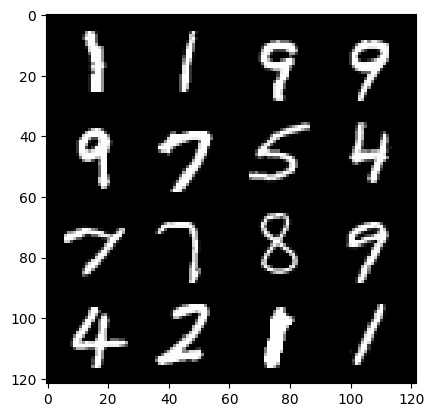

33: step 15600 / Gen loss: 6.237772040367127 / disc_loss: 0.01952956191419313


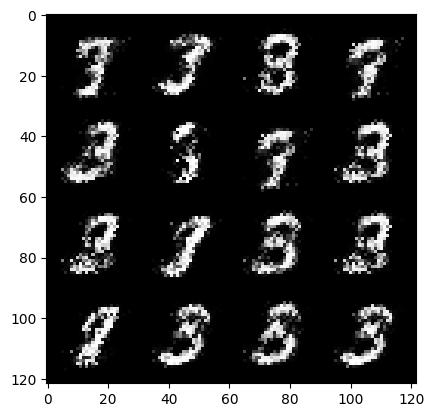

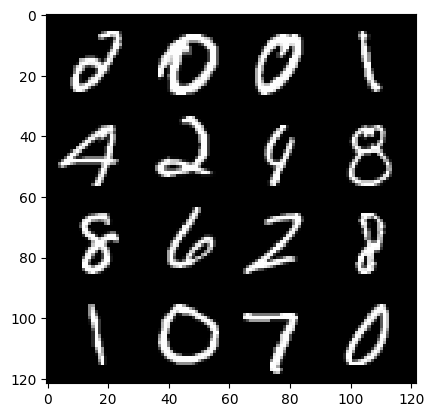

33: step 15900 / Gen loss: 6.3133492978413885 / disc_loss: 0.018394648562340684


  0%|          | 0/469 [00:00<?, ?it/s]

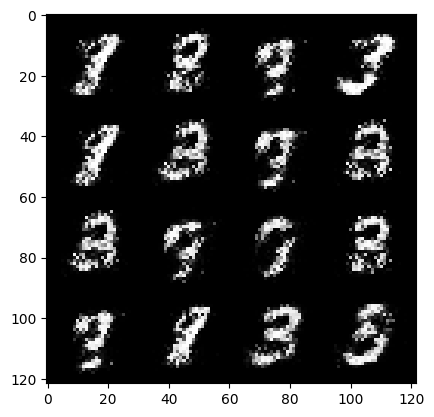

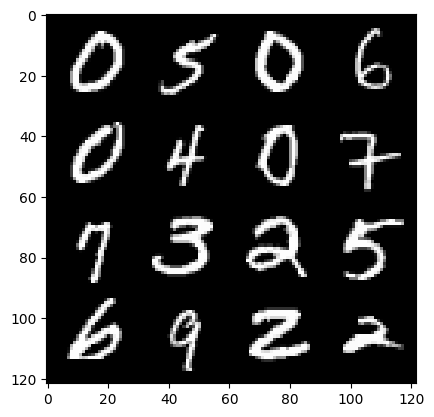

34: step 16200 / Gen loss: 6.430685434341426 / disc_loss: 0.015503373676134899


  0%|          | 0/469 [00:00<?, ?it/s]

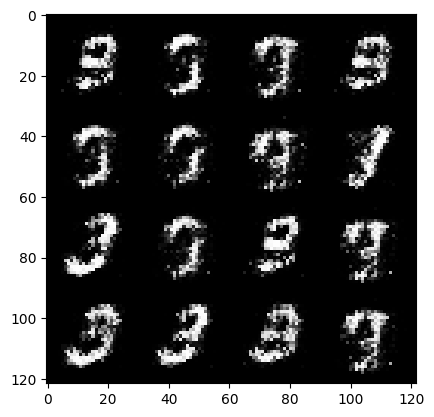

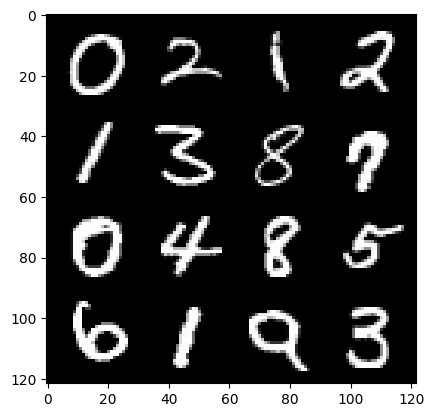

35: step 16500 / Gen loss: 6.5468919769922875 / disc_loss: 0.016756714199048766


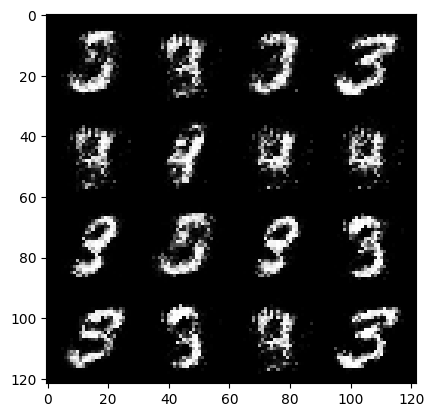

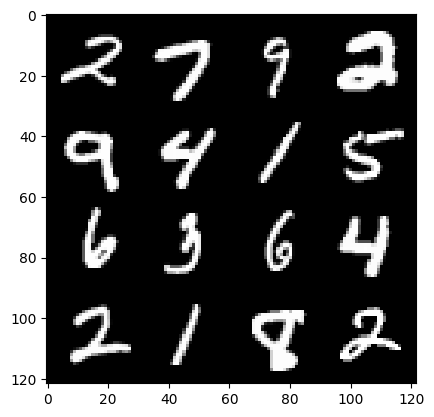

35: step 16800 / Gen loss: 6.941647149721784 / disc_loss: 0.021225547760259356


  0%|          | 0/469 [00:00<?, ?it/s]

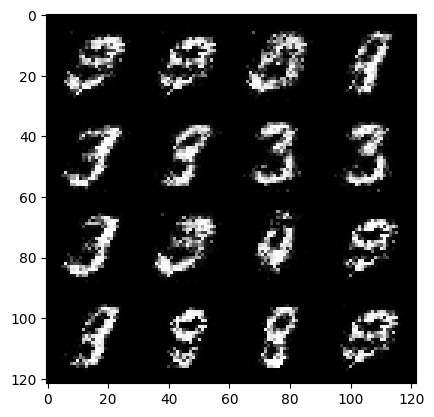

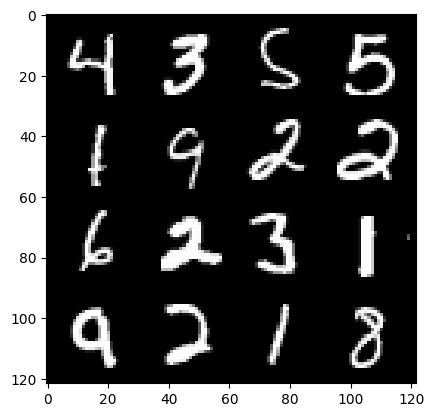

36: step 17100 / Gen loss: 6.329627833366393 / disc_loss: 0.020237138391627617


  0%|          | 0/469 [00:00<?, ?it/s]

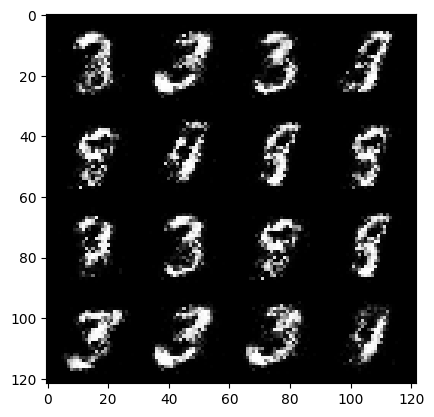

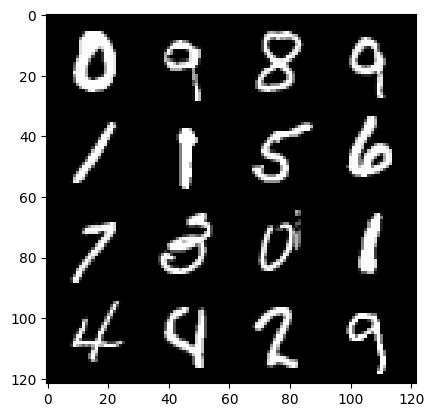

37: step 17400 / Gen loss: 6.557146218617757 / disc_loss: 0.020187100559317814


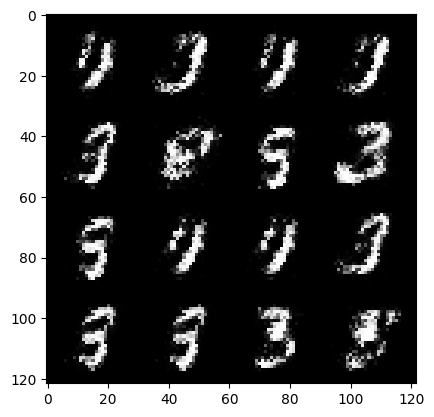

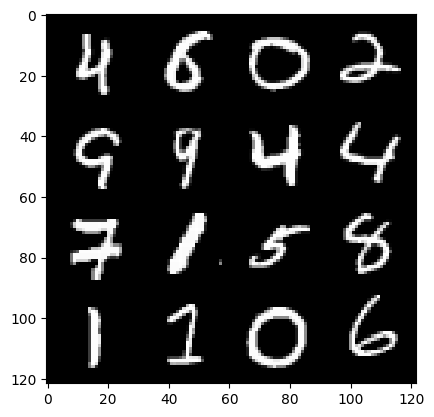

37: step 17700 / Gen loss: 6.475528076489766 / disc_loss: 0.023806334366090604


  0%|          | 0/469 [00:00<?, ?it/s]

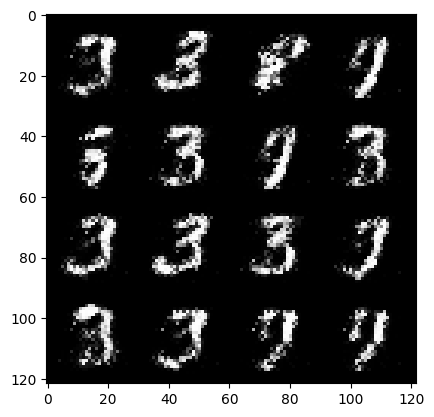

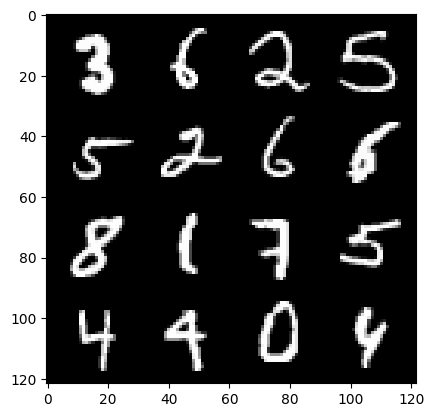

38: step 18000 / Gen loss: 6.261008776028952 / disc_loss: 0.027460076399147503


  0%|          | 0/469 [00:00<?, ?it/s]

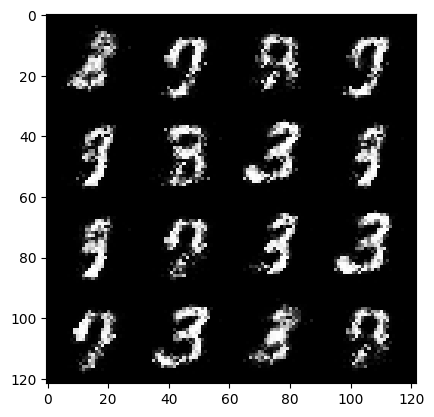

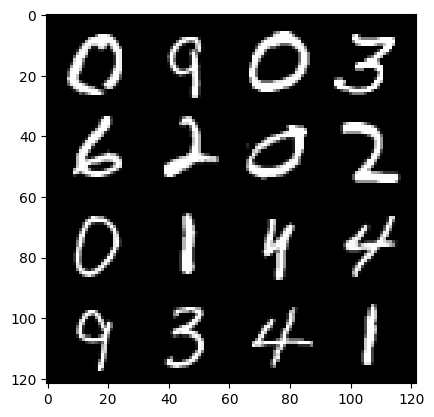

39: step 18300 / Gen loss: 6.361147049268086 / disc_loss: 0.02743835406843575


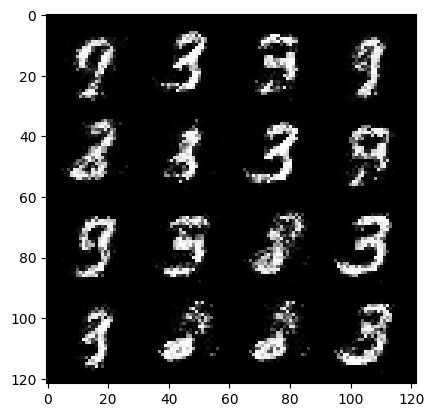

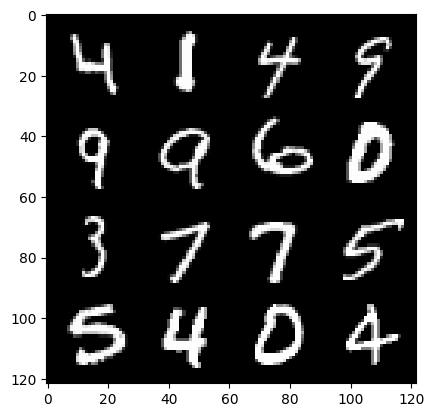

39: step 18600 / Gen loss: 5.982551465034485 / disc_loss: 0.02535165001483014


  0%|          | 0/469 [00:00<?, ?it/s]

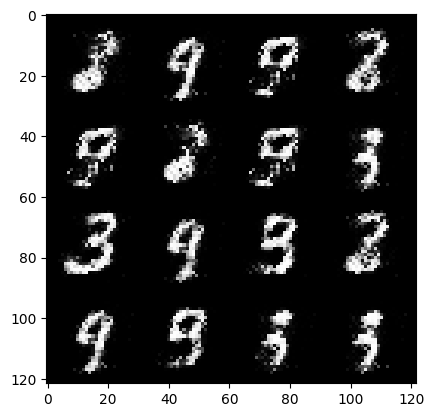

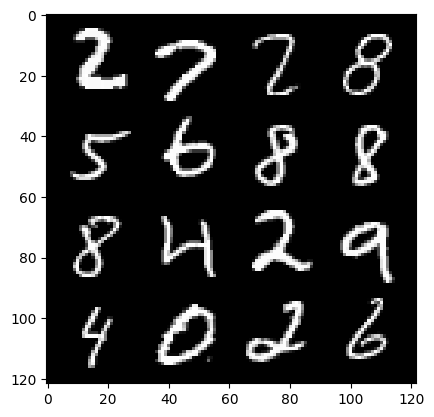

40: step 18900 / Gen loss: 6.045266098976135 / disc_loss: 0.028537014777151246


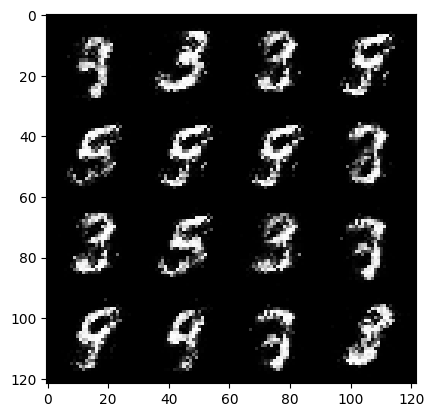

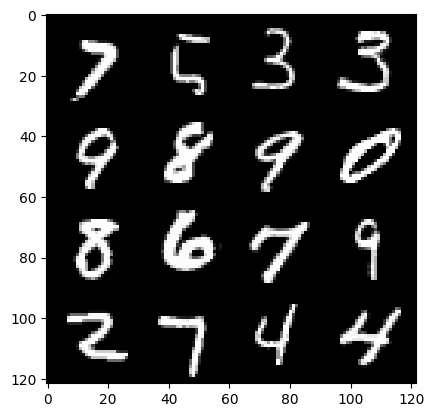

40: step 19200 / Gen loss: 5.942105271021527 / disc_loss: 0.024516774557996546


  0%|          | 0/469 [00:00<?, ?it/s]

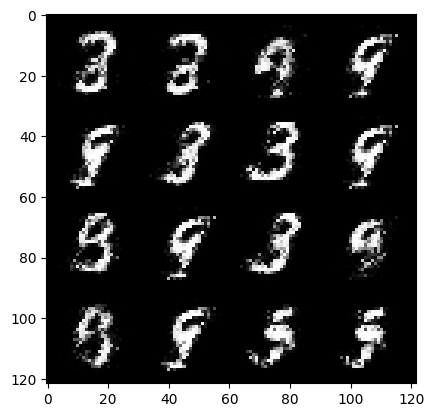

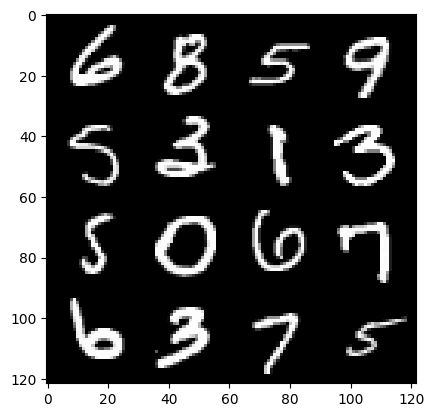

41: step 19500 / Gen loss: 6.374951845804849 / disc_loss: 0.022527344678528606


  0%|          | 0/469 [00:00<?, ?it/s]

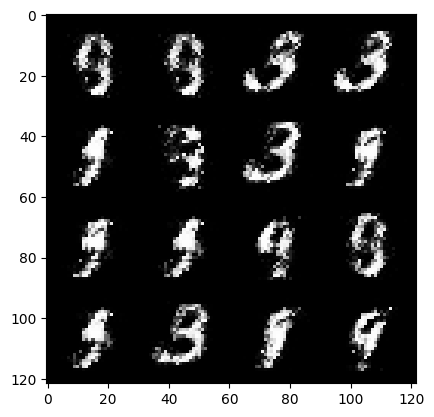

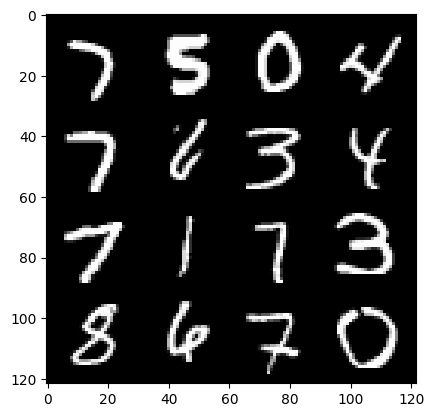

42: step 19800 / Gen loss: 5.969108689626057 / disc_loss: 0.027684704285735877


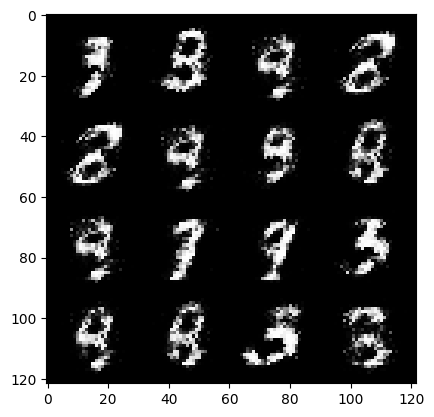

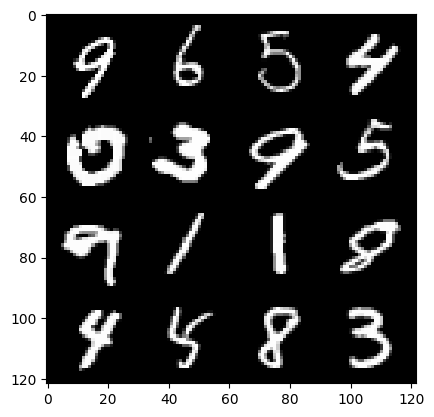

42: step 20100 / Gen loss: 5.948905824025474 / disc_loss: 0.025970373869252692


  0%|          | 0/469 [00:00<?, ?it/s]

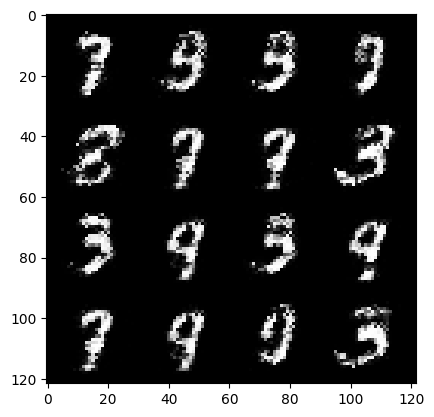

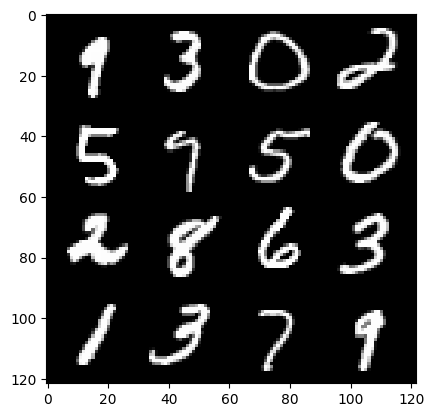

43: step 20400 / Gen loss: 6.427803874015806 / disc_loss: 0.026699503711424773


  0%|          | 0/469 [00:00<?, ?it/s]

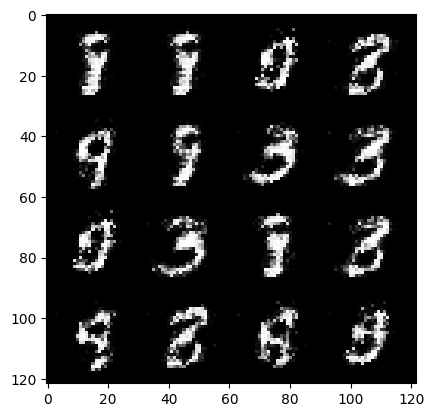

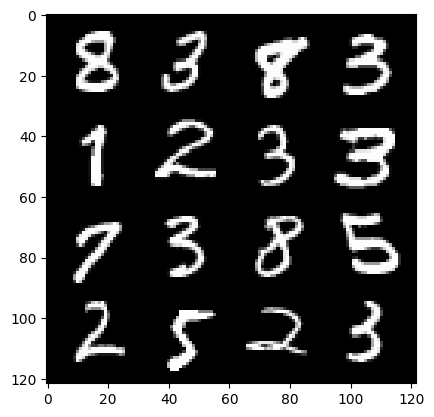

44: step 20700 / Gen loss: 5.960142746766408 / disc_loss: 0.03817884284847726


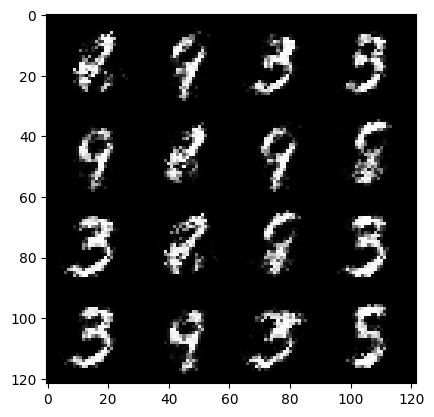

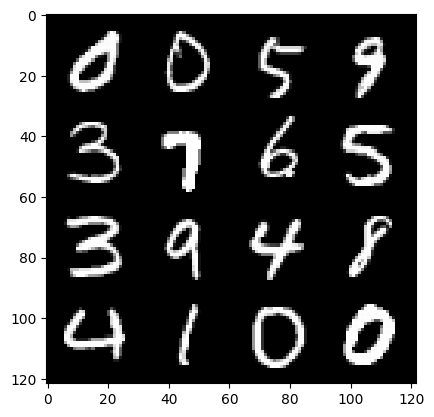

44: step 21000 / Gen loss: 5.482762602170305 / disc_loss: 0.03203647479259719


  0%|          | 0/469 [00:00<?, ?it/s]

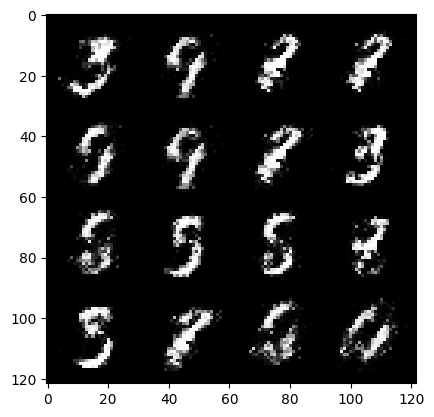

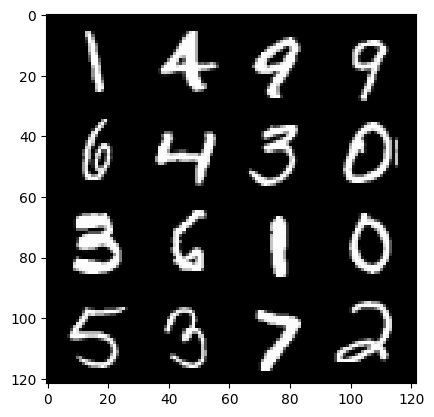

45: step 21300 / Gen loss: 5.590232957204187 / disc_loss: 0.04134760380722585


  0%|          | 0/469 [00:00<?, ?it/s]

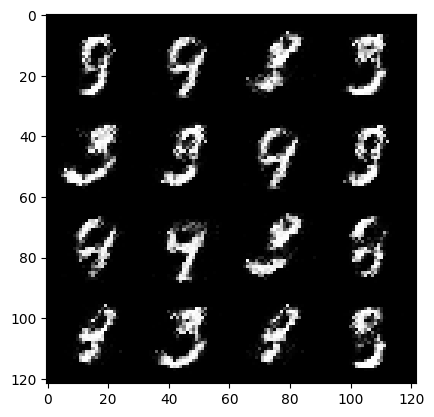

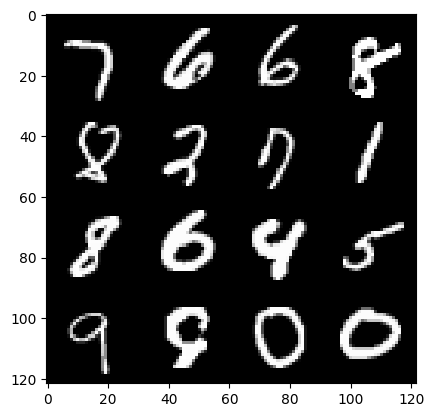

46: step 21600 / Gen loss: 5.244564429918921 / disc_loss: 0.03836030409981806


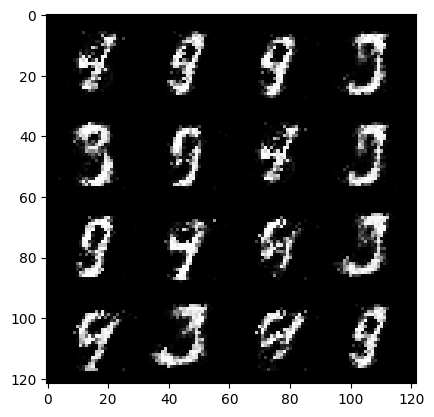

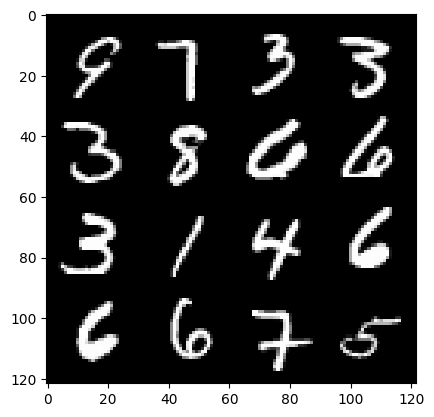

46: step 21900 / Gen loss: 5.60567149957021 / disc_loss: 0.034334134631790234


  0%|          | 0/469 [00:00<?, ?it/s]

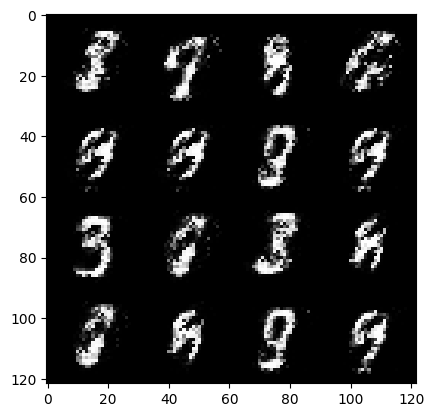

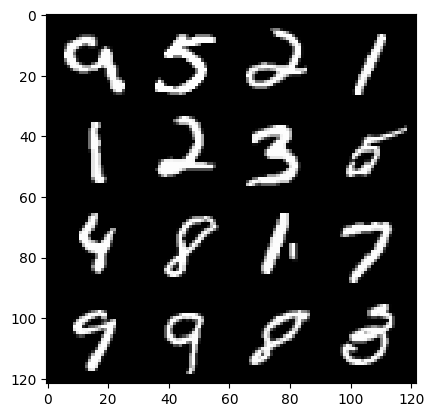

47: step 22200 / Gen loss: 5.780794272422796 / disc_loss: 0.037585980268195256


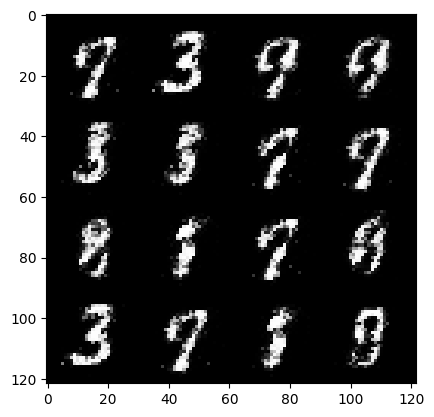

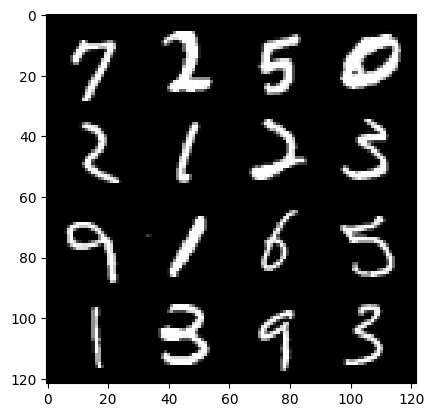

47: step 22500 / Gen loss: 5.407645697593689 / disc_loss: 0.042833455475047216


  0%|          | 0/469 [00:00<?, ?it/s]

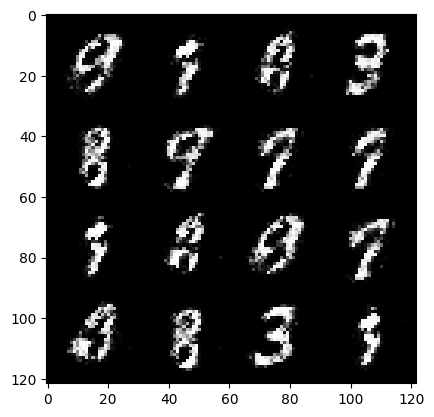

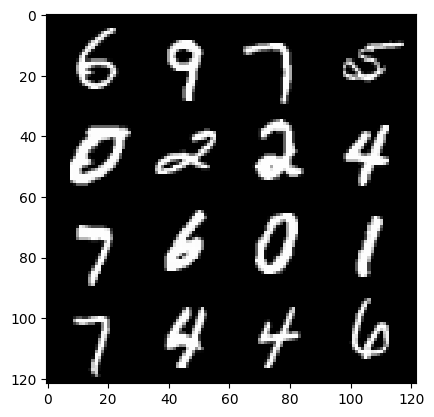

48: step 22800 / Gen loss: 5.518666300773621 / disc_loss: 0.045629779637480765


  0%|          | 0/469 [00:00<?, ?it/s]

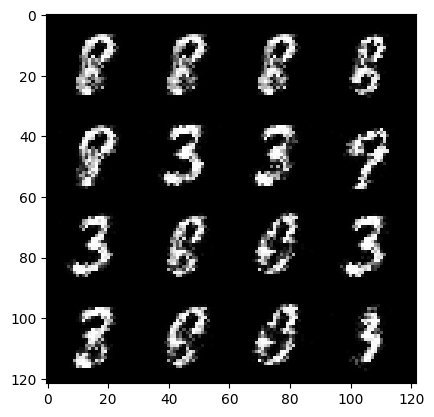

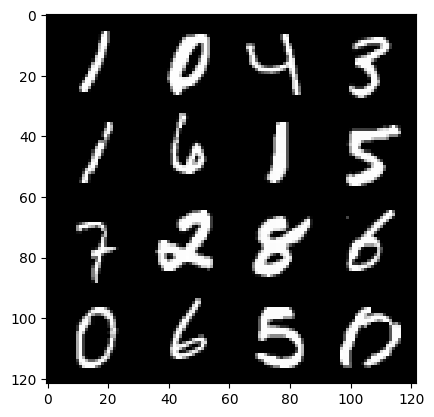

49: step 23100 / Gen loss: 5.6002763175964345 / disc_loss: 0.03971457809520264


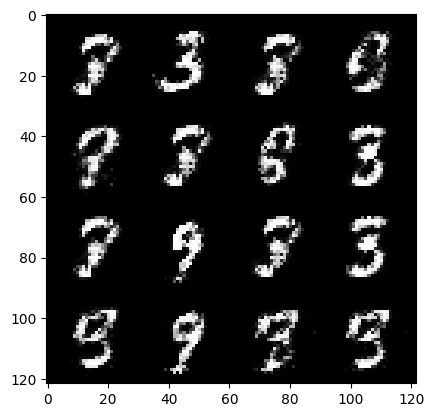

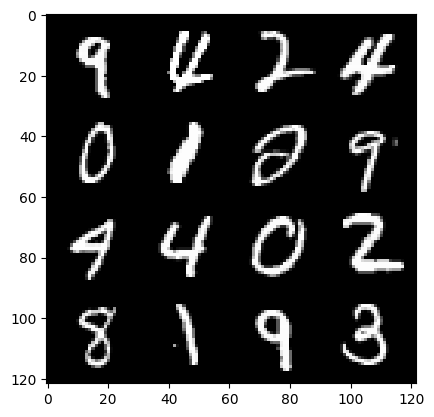

49: step 23400 / Gen loss: 5.696667381922405 / disc_loss: 0.044772686213254934


  0%|          | 0/469 [00:00<?, ?it/s]

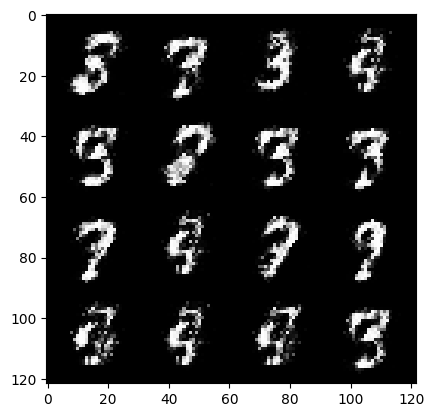

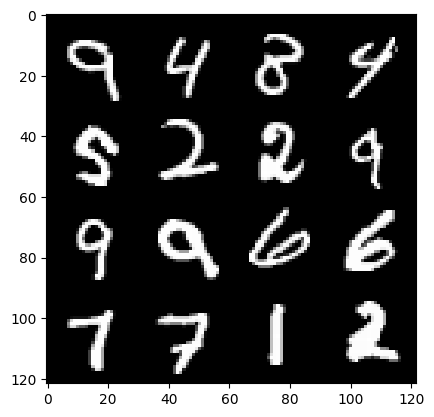

50: step 23700 / Gen loss: 5.261523513793948 / disc_loss: 0.053220193494732206


  0%|          | 0/469 [00:00<?, ?it/s]

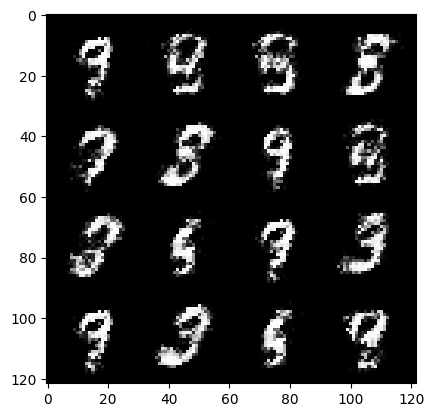

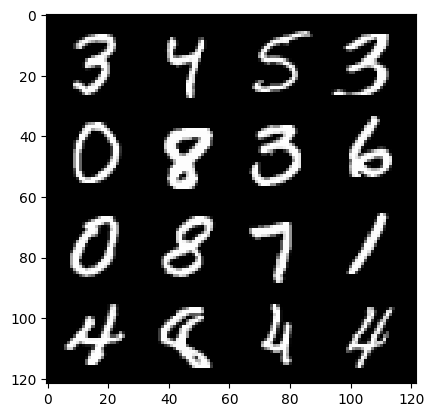

51: step 24000 / Gen loss: 5.277775467236836 / disc_loss: 0.0443222705150644


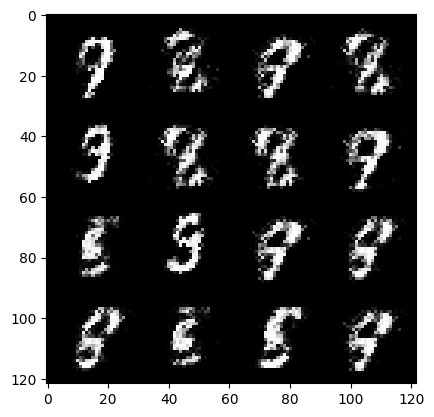

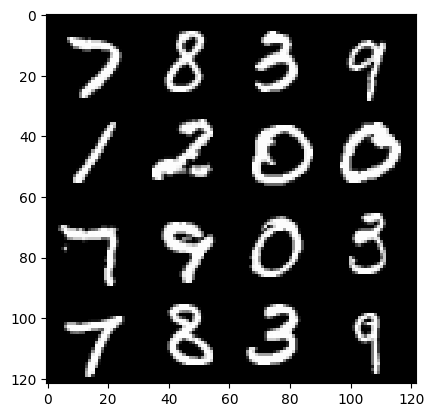

51: step 24300 / Gen loss: 5.284134319623308 / disc_loss: 0.042555144273986434


  0%|          | 0/469 [00:00<?, ?it/s]

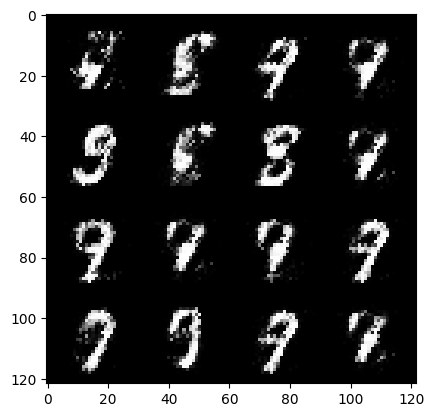

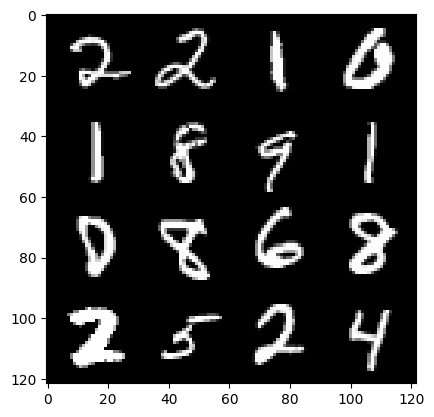

52: step 24600 / Gen loss: 5.525652067661288 / disc_loss: 0.03745032872073351


  0%|          | 0/469 [00:00<?, ?it/s]

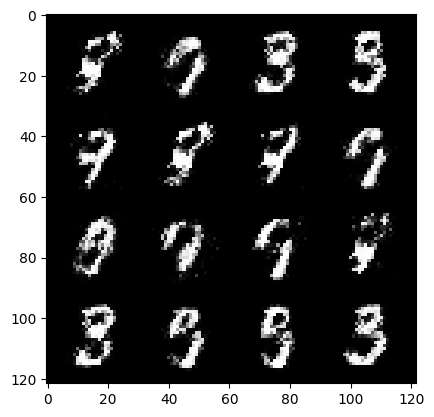

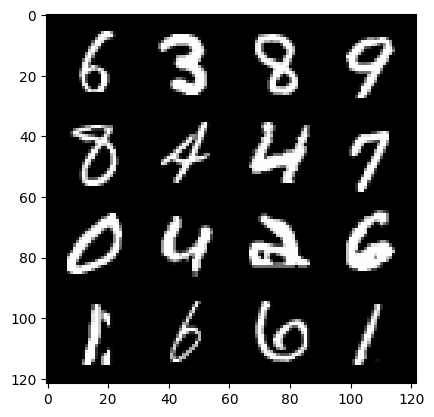

53: step 24900 / Gen loss: 5.590407544771831 / disc_loss: 0.033136100590539466


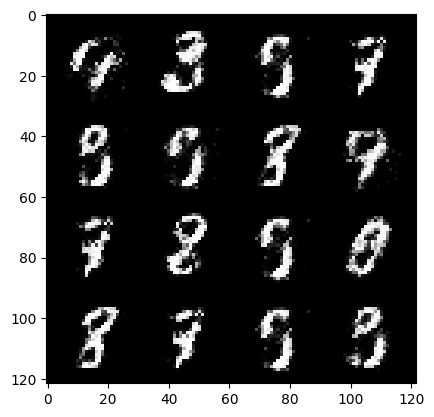

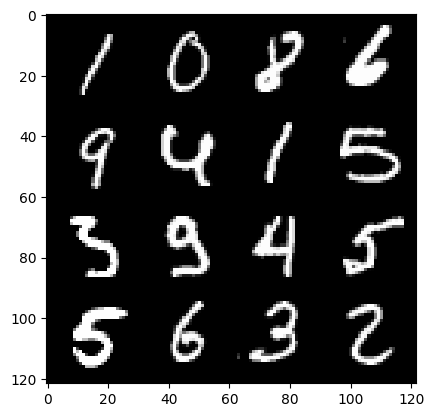

53: step 25200 / Gen loss: 5.919883869489034 / disc_loss: 0.03740920208860191


  0%|          | 0/469 [00:00<?, ?it/s]

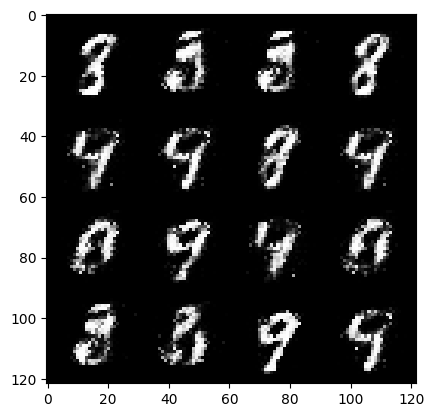

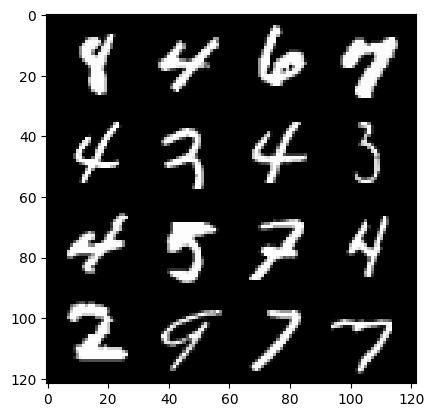

54: step 25500 / Gen loss: 5.753860325813293 / disc_loss: 0.03779982575681059


  0%|          | 0/469 [00:00<?, ?it/s]

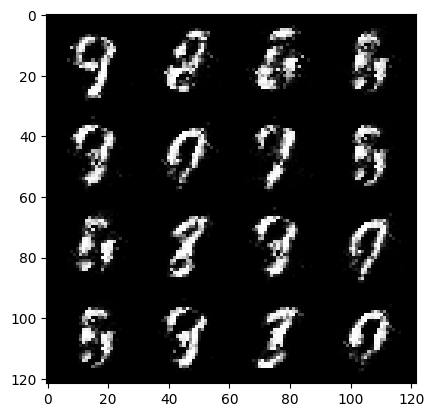

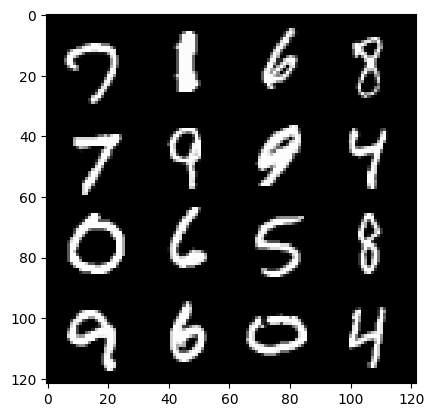

55: step 25800 / Gen loss: 5.315357724825543 / disc_loss: 0.052524390540396156


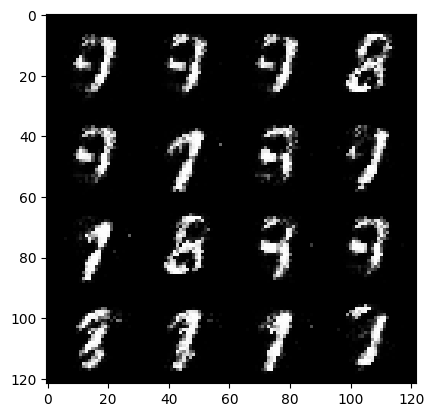

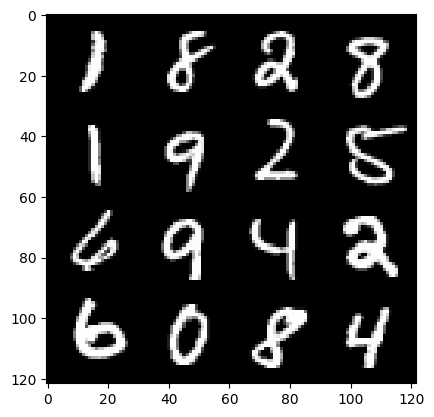

55: step 26100 / Gen loss: 5.0945177833239255 / disc_loss: 0.0491846085867534


  0%|          | 0/469 [00:00<?, ?it/s]

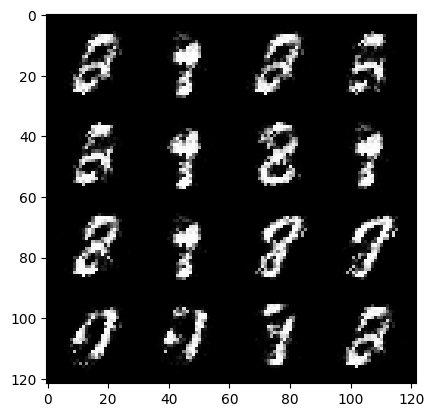

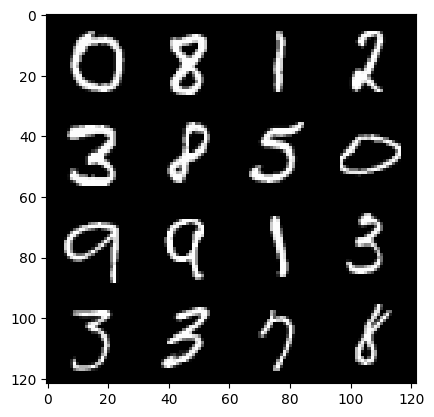

56: step 26400 / Gen loss: 5.330218666394557 / disc_loss: 0.051094465541342934


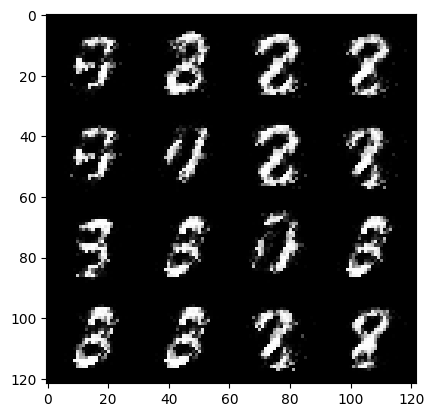

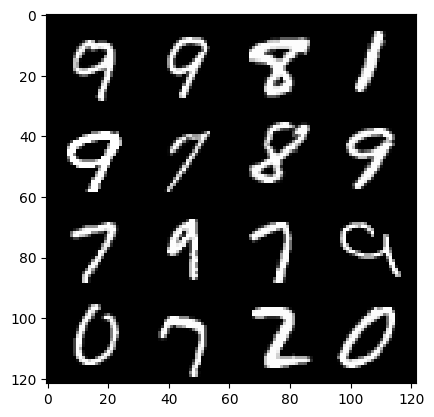

56: step 26700 / Gen loss: 5.272625610828402 / disc_loss: 0.05300975252563757


  0%|          | 0/469 [00:00<?, ?it/s]

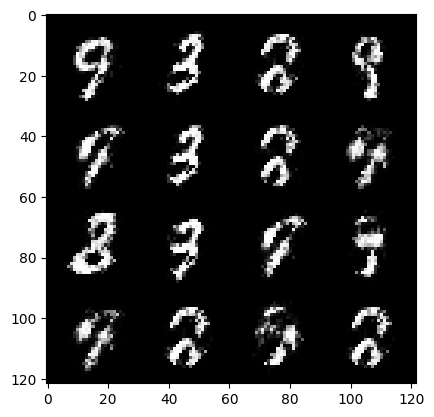

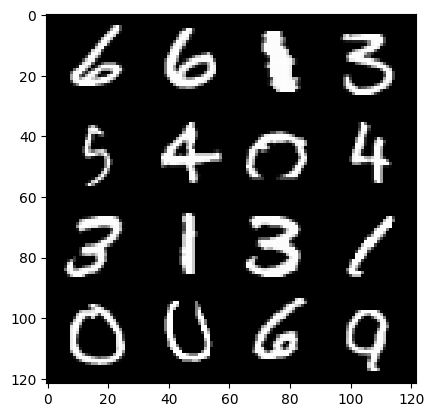

57: step 27000 / Gen loss: 5.274003519217176 / disc_loss: 0.04944338927355904


  0%|          | 0/469 [00:00<?, ?it/s]

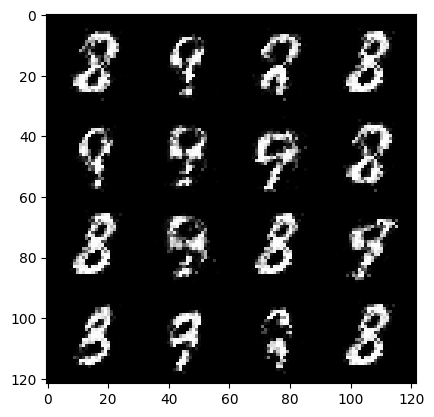

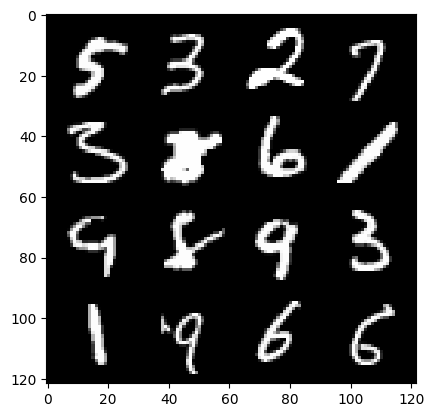

58: step 27300 / Gen loss: 4.83564062754313 / disc_loss: 0.05460677171746889


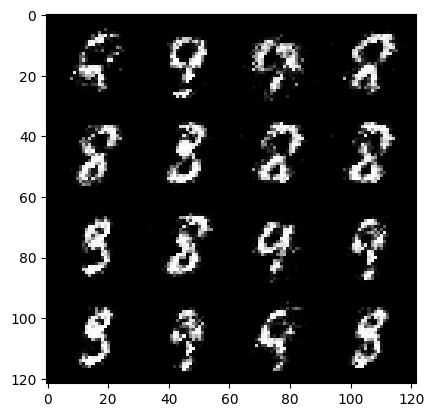

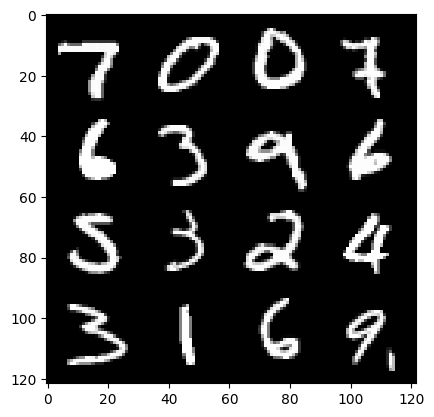

58: step 27600 / Gen loss: 5.150186661084493 / disc_loss: 0.05855777400856216


  0%|          | 0/469 [00:00<?, ?it/s]

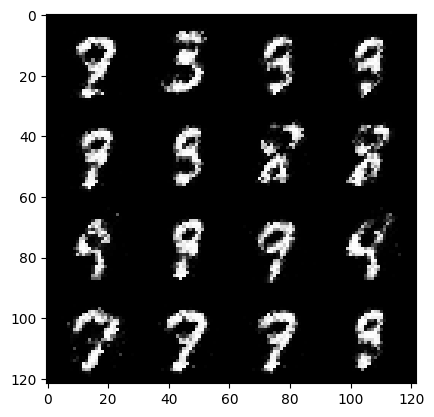

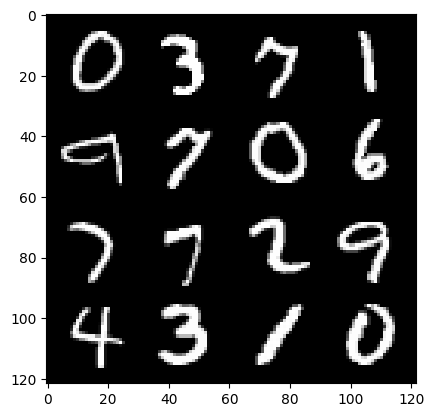

59: step 27900 / Gen loss: 5.292841923236849 / disc_loss: 0.051455903391664226


  0%|          | 0/469 [00:00<?, ?it/s]

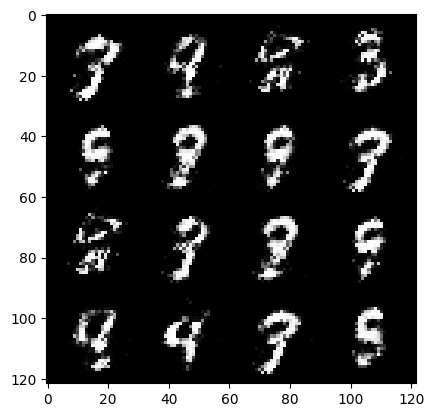

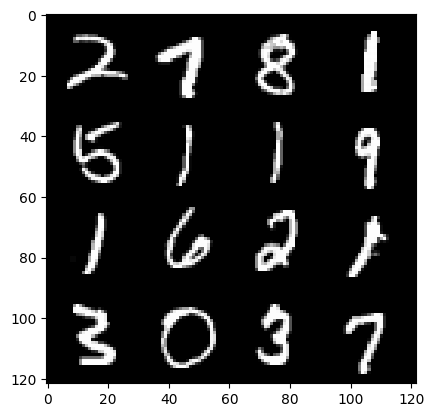

60: step 28200 / Gen loss: 5.166331717173255 / disc_loss: 0.04752085046532256


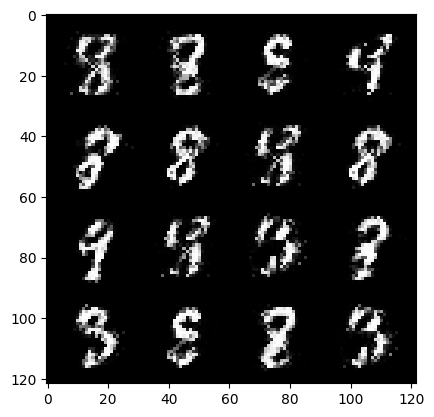

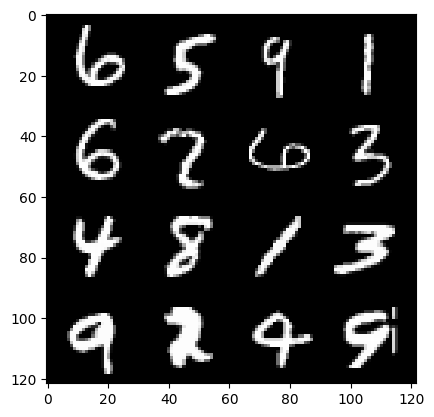

60: step 28500 / Gen loss: 4.876773509184519 / disc_loss: 0.05132550785938902


  0%|          | 0/469 [00:00<?, ?it/s]

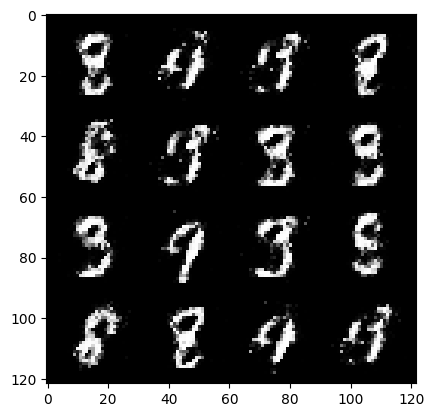

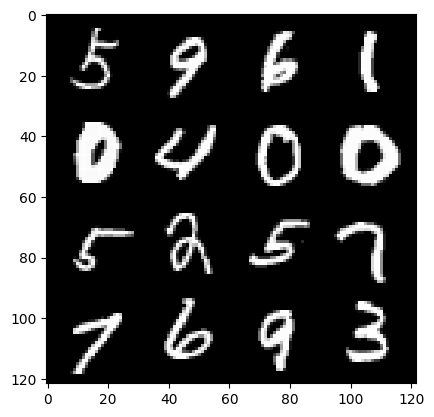

61: step 28800 / Gen loss: 5.131808156172431 / disc_loss: 0.05221929409385971


  0%|          | 0/469 [00:00<?, ?it/s]

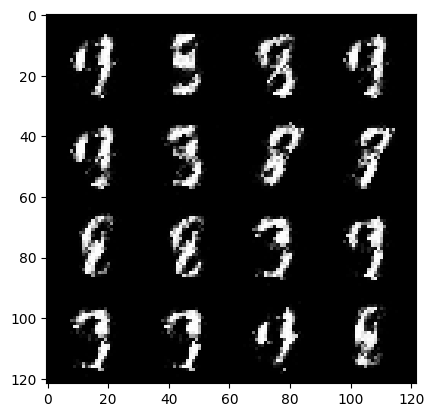

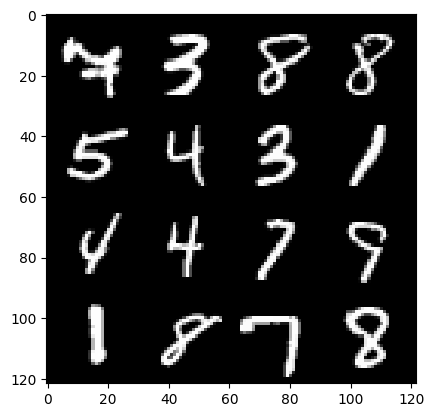

62: step 29100 / Gen loss: 5.259729927380879 / disc_loss: 0.04896254984661938


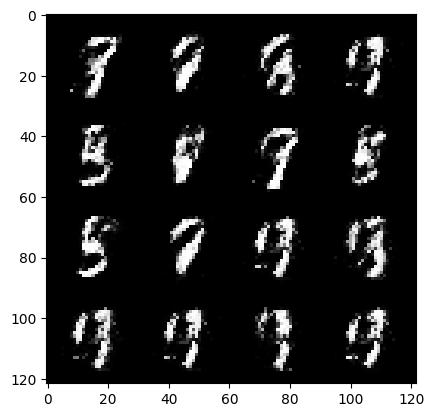

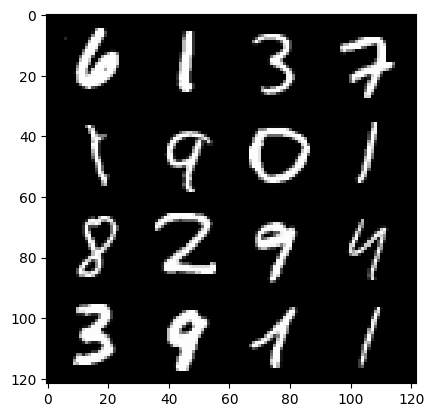

62: step 29400 / Gen loss: 5.190890477498368 / disc_loss: 0.0501951049423466


  0%|          | 0/469 [00:00<?, ?it/s]

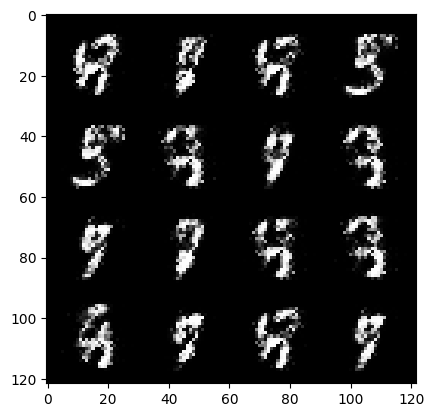

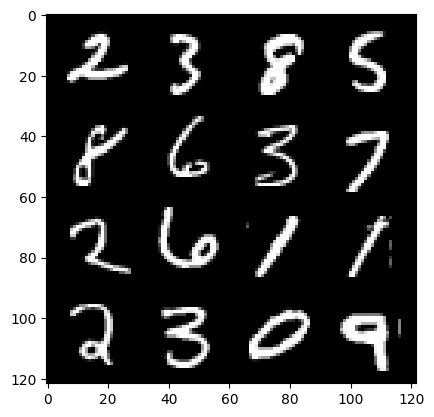

63: step 29700 / Gen loss: 5.153245849609374 / disc_loss: 0.05140418627454587


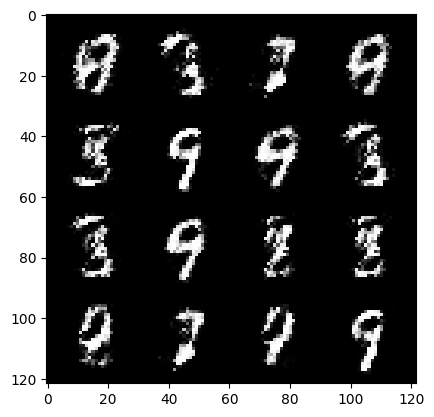

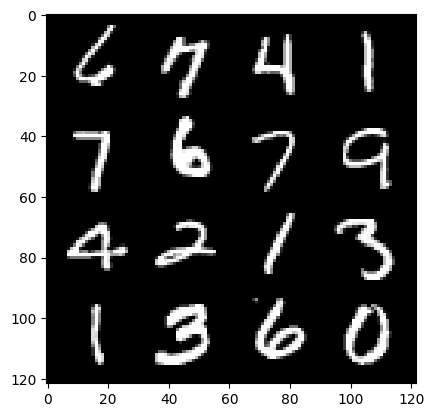

63: step 30000 / Gen loss: 4.985087393124897 / disc_loss: 0.06615862738961972


  0%|          | 0/469 [00:00<?, ?it/s]

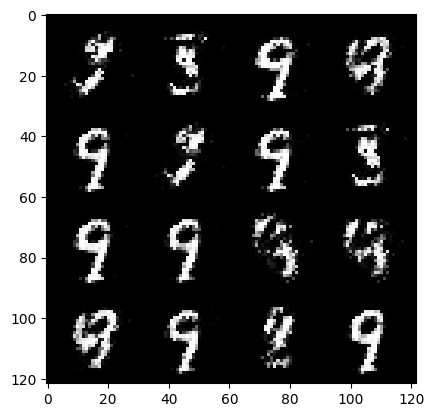

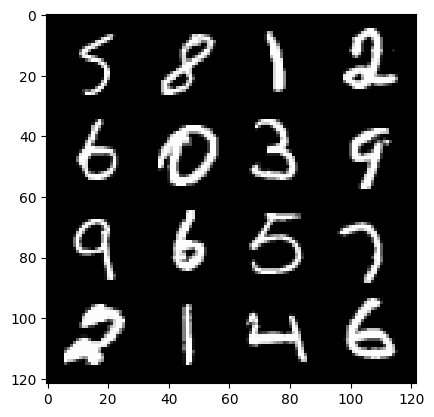

64: step 30300 / Gen loss: 5.004220046997068 / disc_loss: 0.05478696934257945


  0%|          | 0/469 [00:00<?, ?it/s]

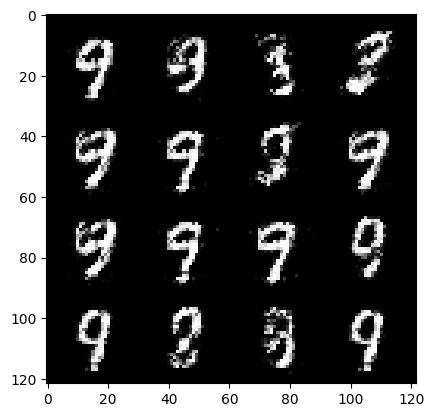

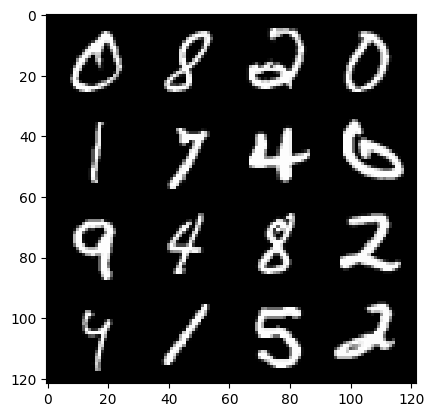

65: step 30600 / Gen loss: 5.456336692174276 / disc_loss: 0.05199745548578603


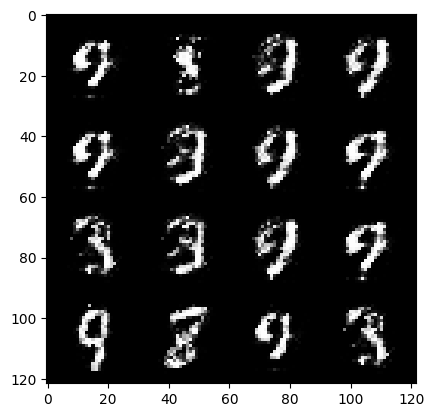

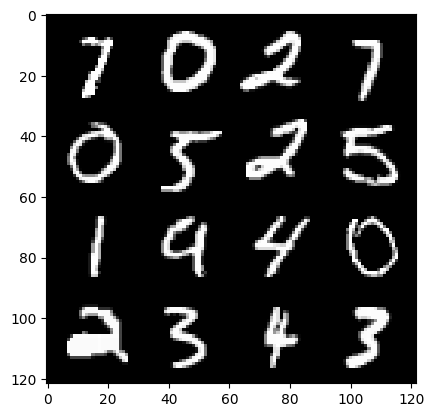

65: step 30900 / Gen loss: 5.1461922208468085 / disc_loss: 0.06664878743390253


  0%|          | 0/469 [00:00<?, ?it/s]

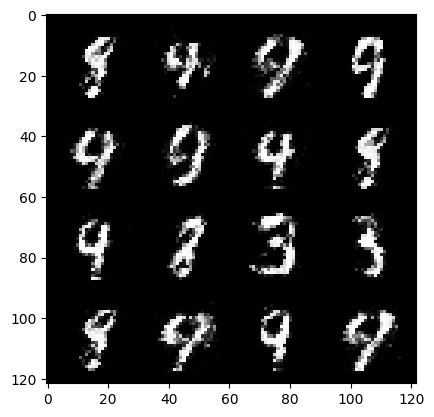

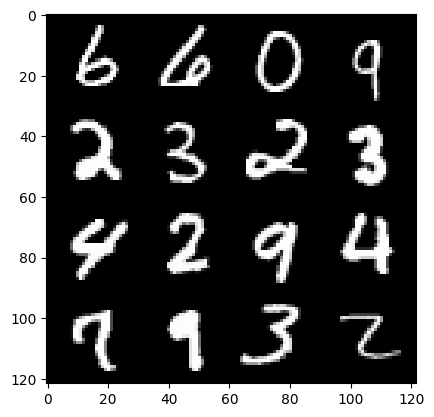

66: step 31200 / Gen loss: 5.136211435000101 / disc_loss: 0.08383875015502175


  0%|          | 0/469 [00:00<?, ?it/s]

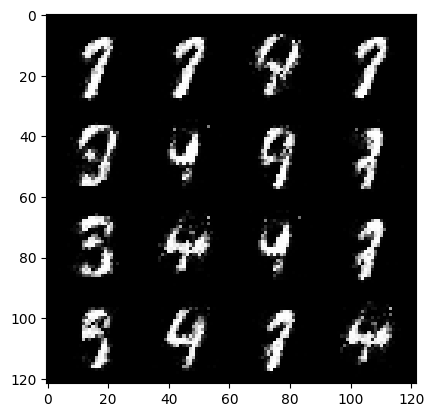

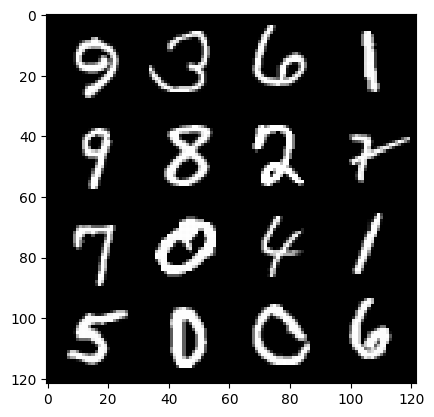

67: step 31500 / Gen loss: 4.8204386711120595 / disc_loss: 0.08151399329304698


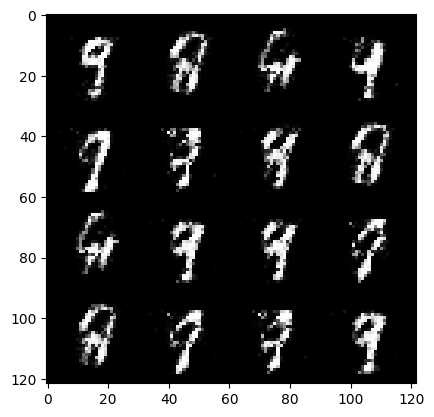

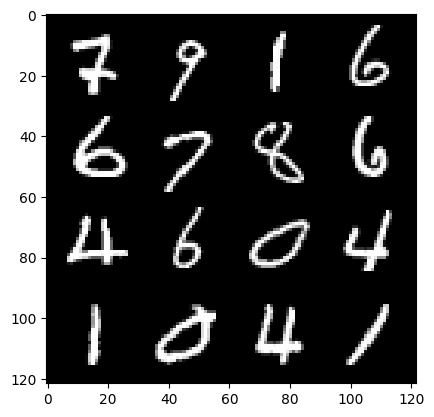

67: step 31800 / Gen loss: 4.5597976883252445 / disc_loss: 0.07991001016460357


  0%|          | 0/469 [00:00<?, ?it/s]

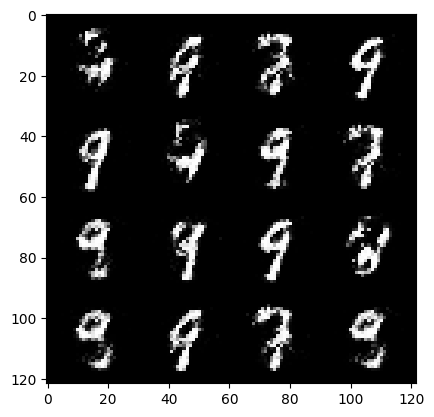

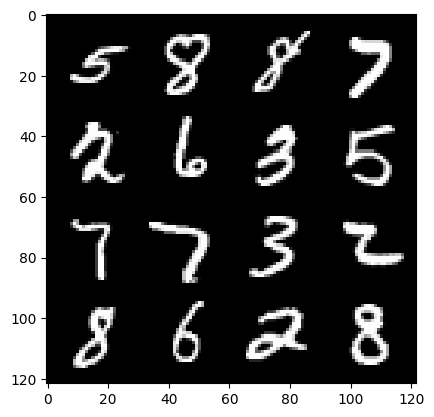

68: step 32100 / Gen loss: 4.944786199728647 / disc_loss: 0.0802576664524774


  0%|          | 0/469 [00:00<?, ?it/s]

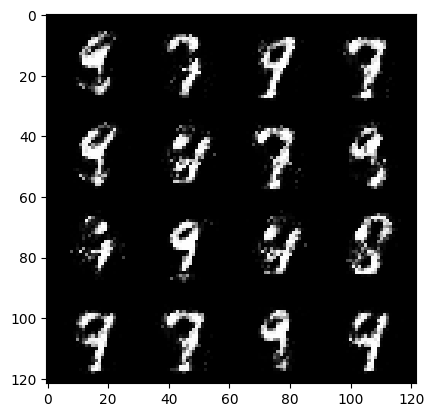

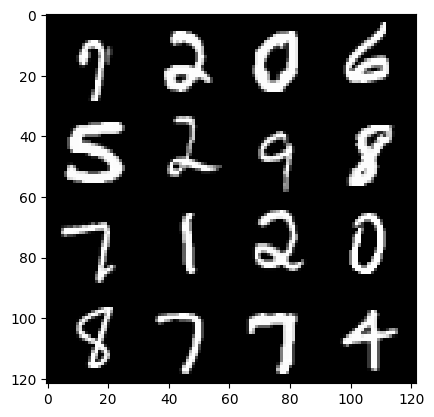

69: step 32400 / Gen loss: 4.68348900079727 / disc_loss: 0.0909205748885871


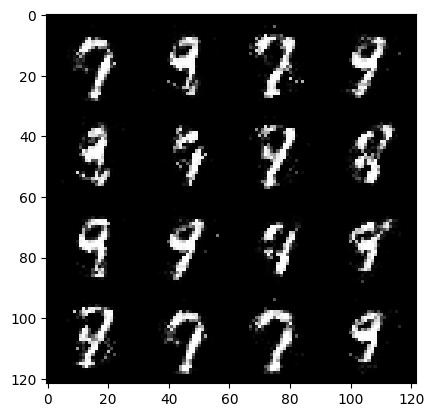

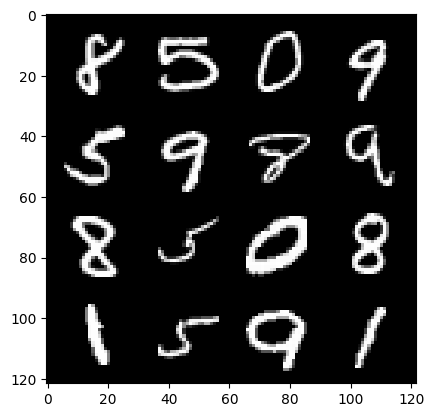

69: step 32700 / Gen loss: 4.632903739611309 / disc_loss: 0.08412642347936829


  0%|          | 0/469 [00:00<?, ?it/s]

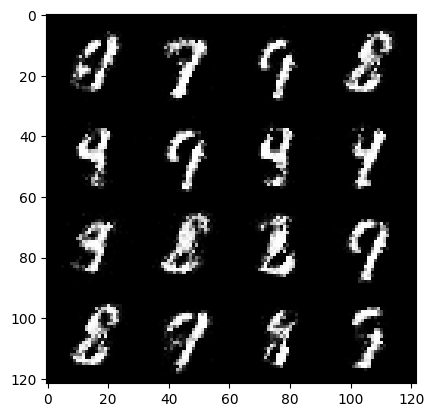

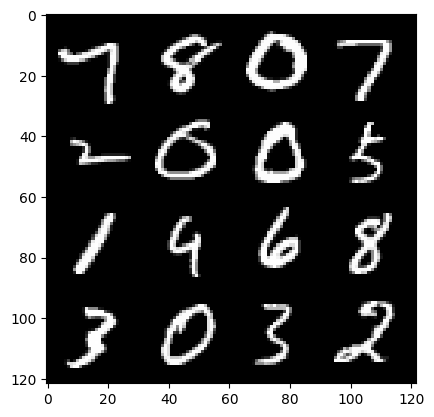

70: step 33000 / Gen loss: 4.810056284268697 / disc_loss: 0.07346232467641432


  0%|          | 0/469 [00:00<?, ?it/s]

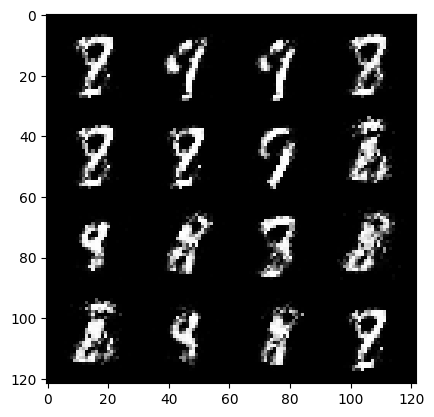

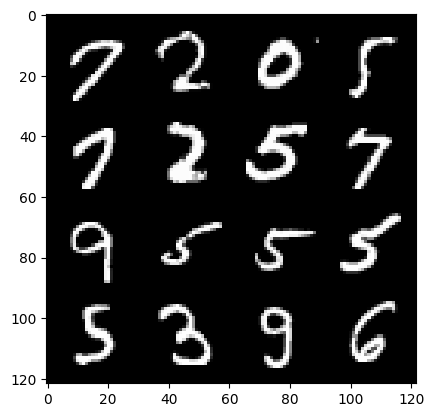

71: step 33300 / Gen loss: 4.798907639185588 / disc_loss: 0.06872723517629008


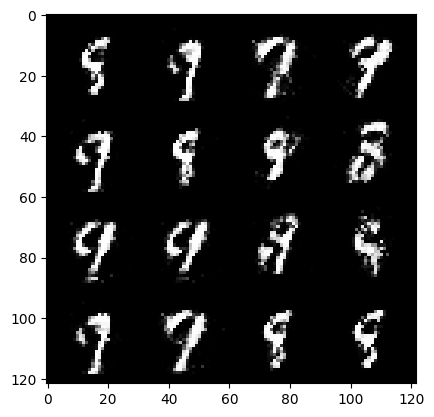

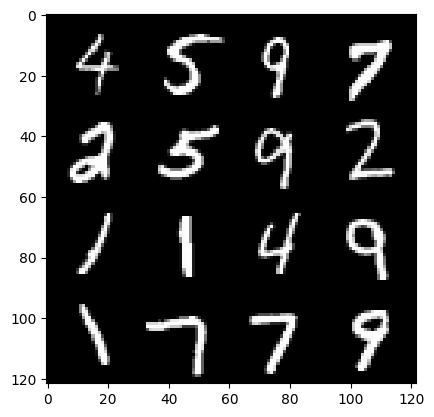

71: step 33600 / Gen loss: 4.520296781857807 / disc_loss: 0.0858556756004691


  0%|          | 0/469 [00:00<?, ?it/s]

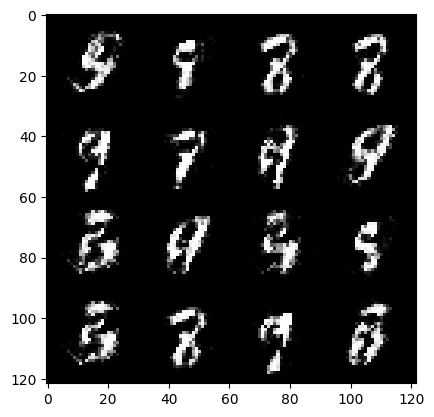

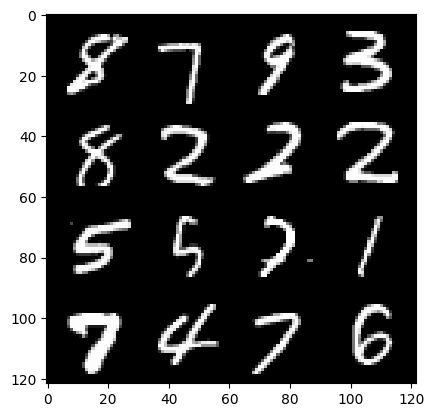

72: step 33900 / Gen loss: 4.354571007092795 / disc_loss: 0.07816068489104512


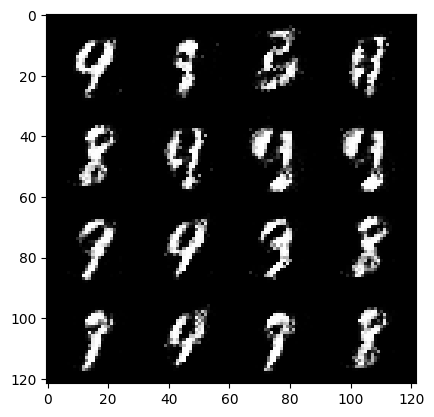

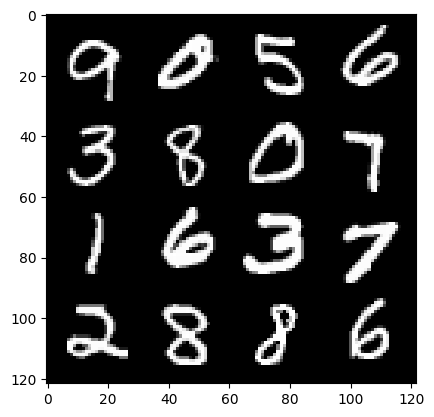

72: step 34200 / Gen loss: 4.80512889703115 / disc_loss: 0.06265859318897131


  0%|          | 0/469 [00:00<?, ?it/s]

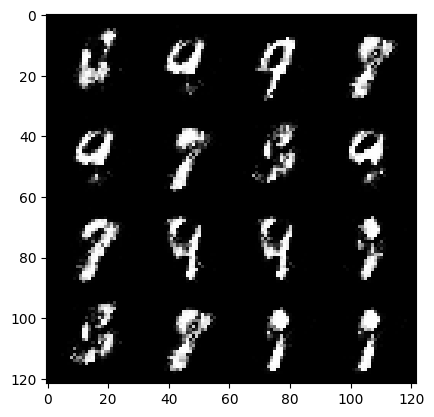

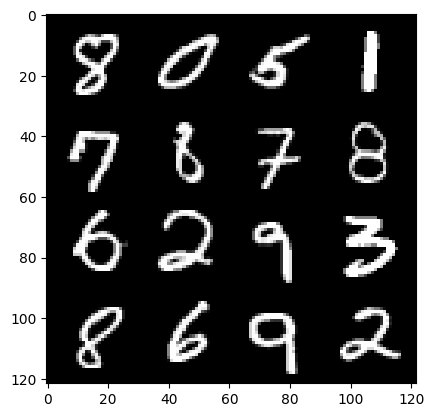

73: step 34500 / Gen loss: 4.732986056009924 / disc_loss: 0.07743137224266929


  0%|          | 0/469 [00:00<?, ?it/s]

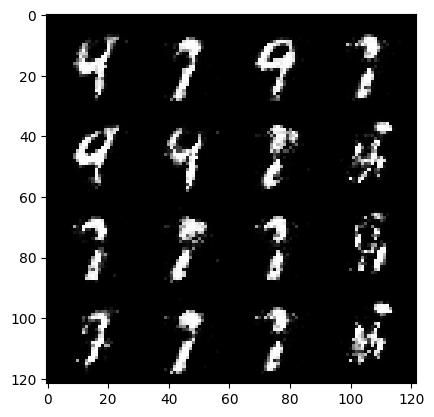

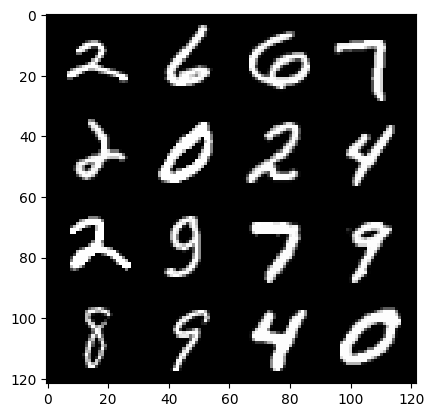

74: step 34800 / Gen loss: 4.315212597052255 / disc_loss: 0.07734714861648778


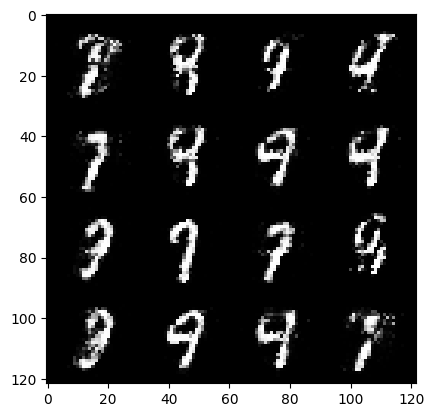

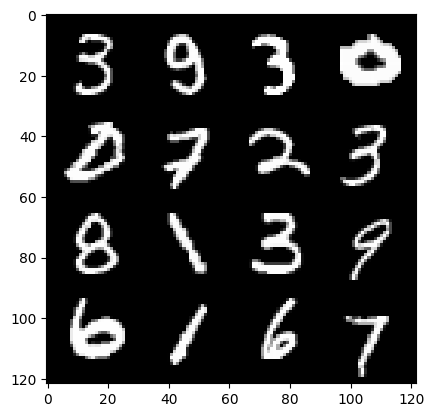

74: step 35100 / Gen loss: 4.599329213301339 / disc_loss: 0.08016931146383284


  0%|          | 0/469 [00:00<?, ?it/s]

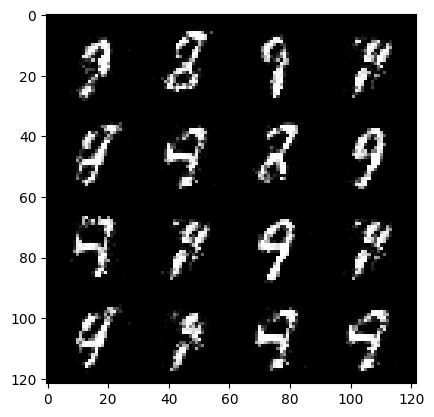

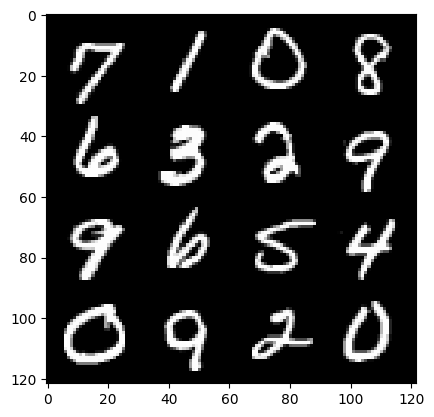

75: step 35400 / Gen loss: 4.451584286689757 / disc_loss: 0.08208096035445728


  0%|          | 0/469 [00:00<?, ?it/s]

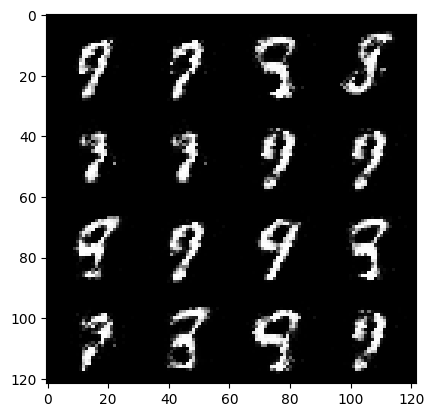

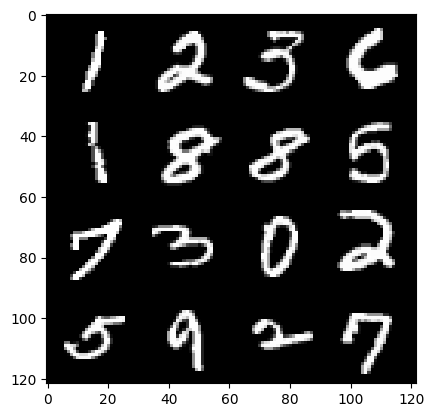

76: step 35700 / Gen loss: 4.532908141613003 / disc_loss: 0.09007693586250155


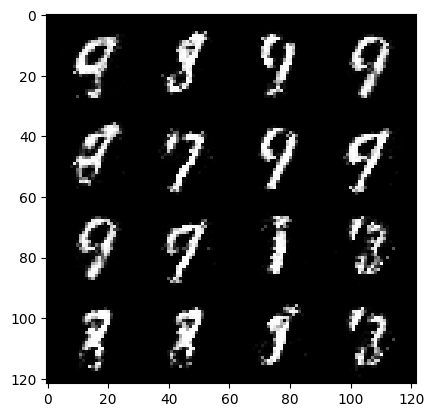

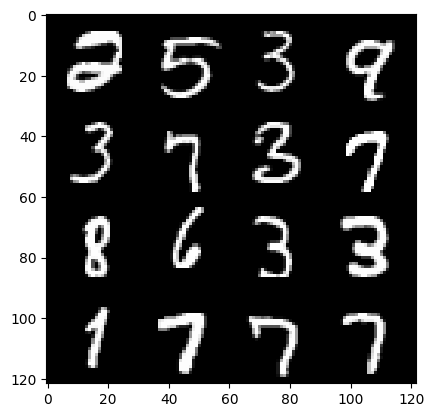

76: step 36000 / Gen loss: 4.5685783354441325 / disc_loss: 0.09294343349834283


  0%|          | 0/469 [00:00<?, ?it/s]

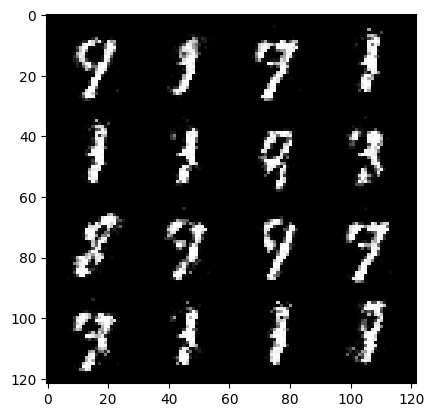

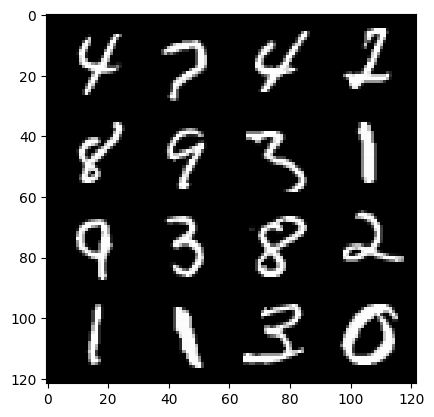

77: step 36300 / Gen loss: 4.323926219940183 / disc_loss: 0.09383498872319858


  0%|          | 0/469 [00:00<?, ?it/s]

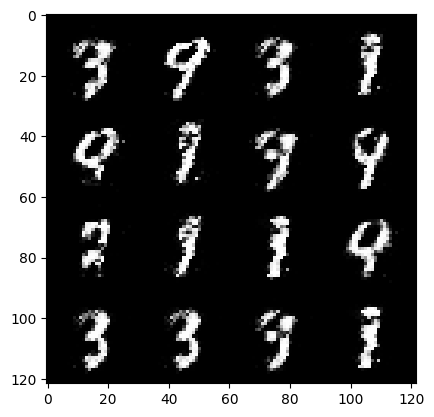

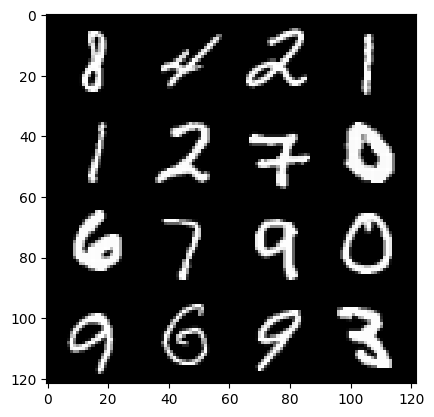

78: step 36600 / Gen loss: 4.748926420211792 / disc_loss: 0.07115784413181239


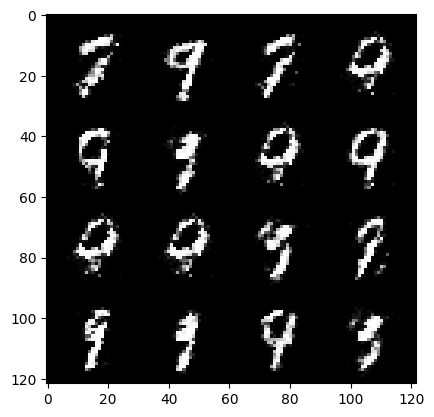

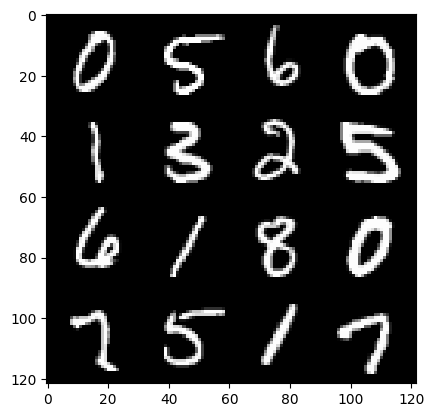

78: step 36900 / Gen loss: 4.410920310020447 / disc_loss: 0.08238528087424735


  0%|          | 0/469 [00:00<?, ?it/s]

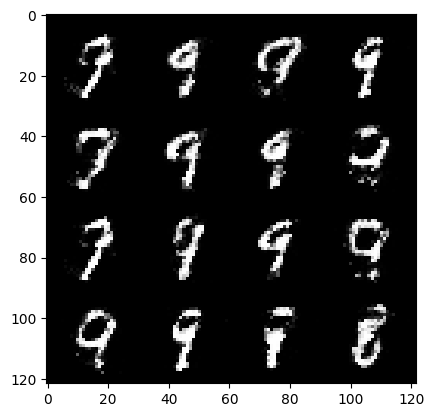

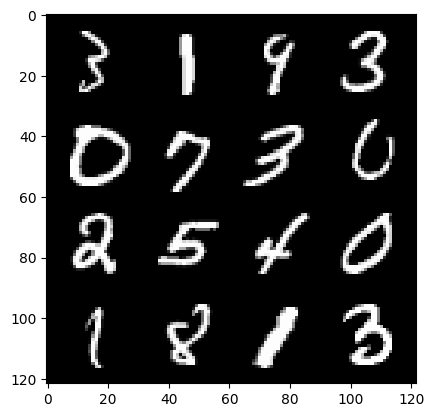

79: step 37200 / Gen loss: 4.383362053235375 / disc_loss: 0.09562206792024276


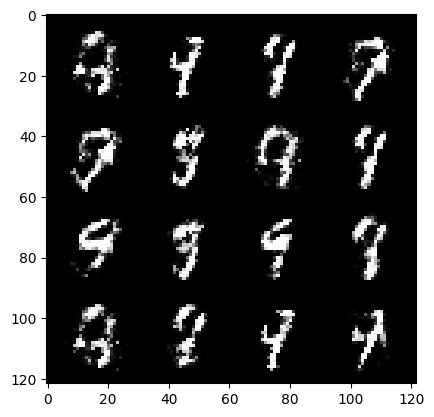

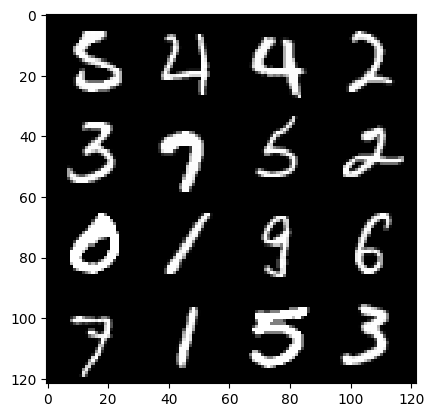

79: step 37500 / Gen loss: 4.262069334983823 / disc_loss: 0.1122427939561506


  0%|          | 0/469 [00:00<?, ?it/s]

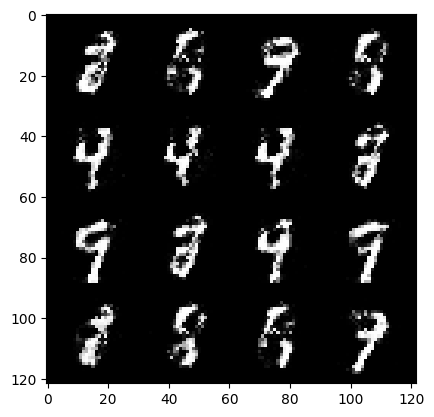

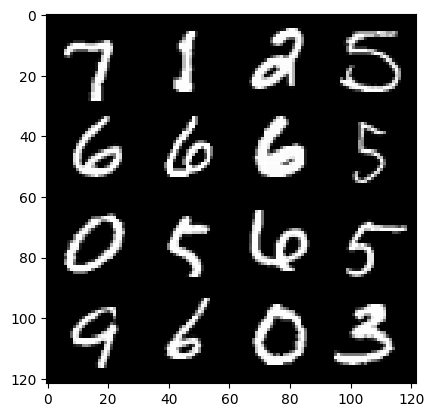

80: step 37800 / Gen loss: 4.31700459241867 / disc_loss: 0.09653197775284451


  0%|          | 0/469 [00:00<?, ?it/s]

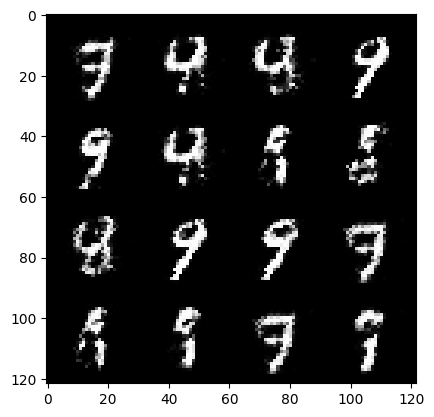

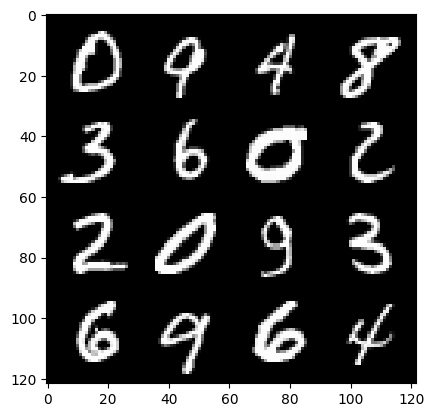

81: step 38100 / Gen loss: 4.2515079387029 / disc_loss: 0.09160826195652287


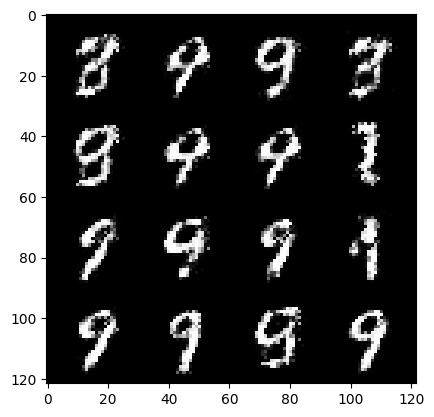

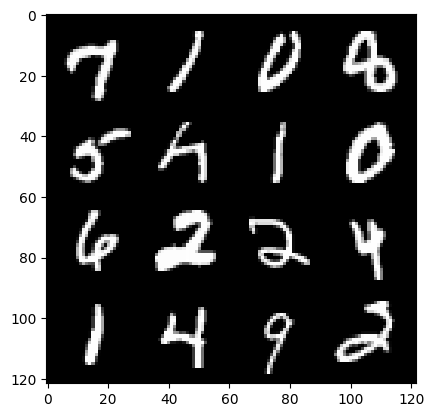

81: step 38400 / Gen loss: 4.288985326290128 / disc_loss: 0.09914333893607057


  0%|          | 0/469 [00:00<?, ?it/s]

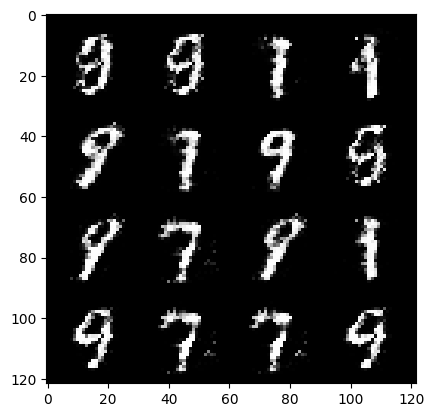

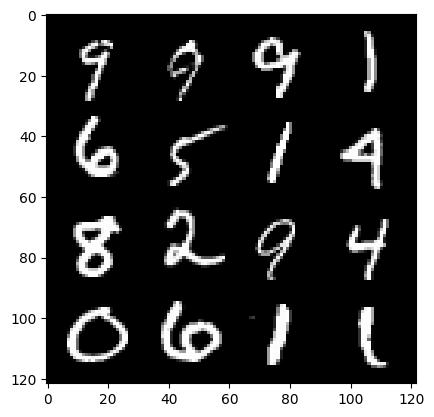

82: step 38700 / Gen loss: 4.092177703380586 / disc_loss: 0.1094206515575448


  0%|          | 0/469 [00:00<?, ?it/s]

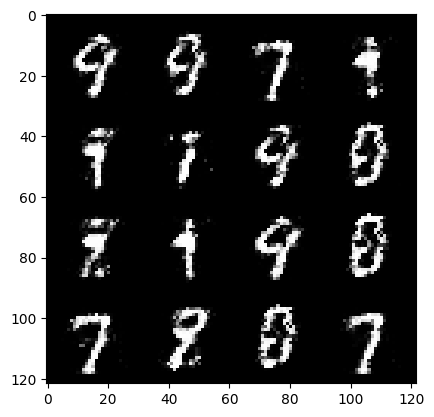

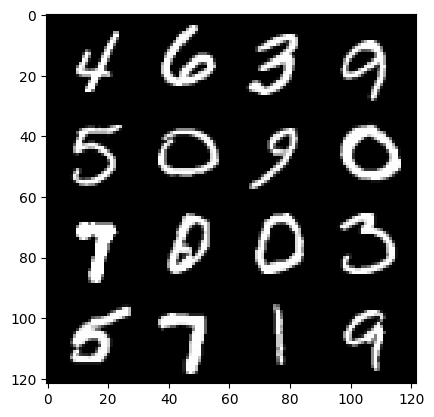

83: step 39000 / Gen loss: 4.218422675927479 / disc_loss: 0.08684375166892998


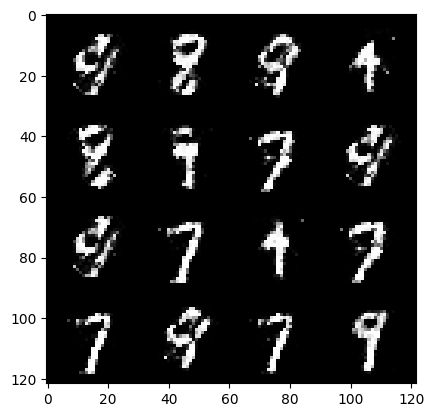

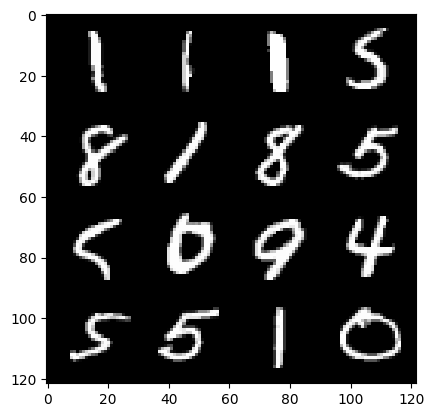

83: step 39300 / Gen loss: 4.2358494973182665 / disc_loss: 0.07526043118288121


  0%|          | 0/469 [00:00<?, ?it/s]

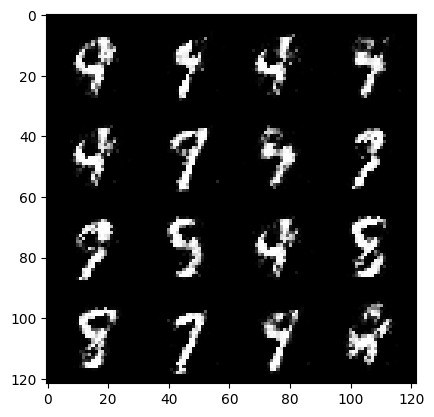

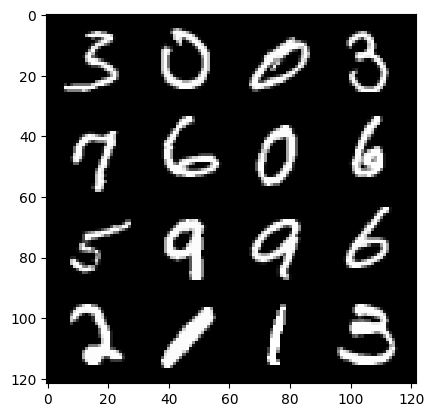

84: step 39600 / Gen loss: 4.472497789065045 / disc_loss: 0.07771975991316141


  0%|          | 0/469 [00:00<?, ?it/s]

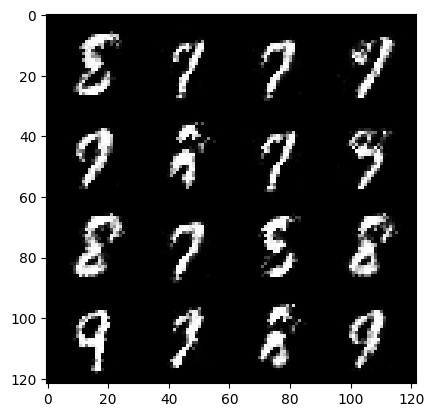

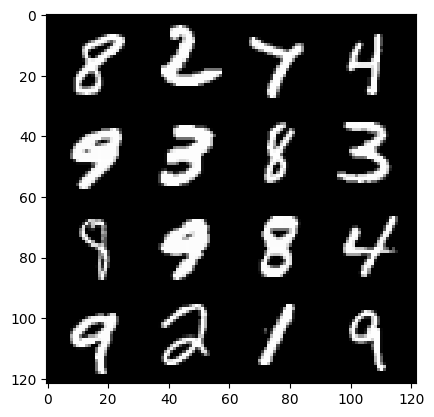

85: step 39900 / Gen loss: 4.031743296782179 / disc_loss: 0.10371359254543983


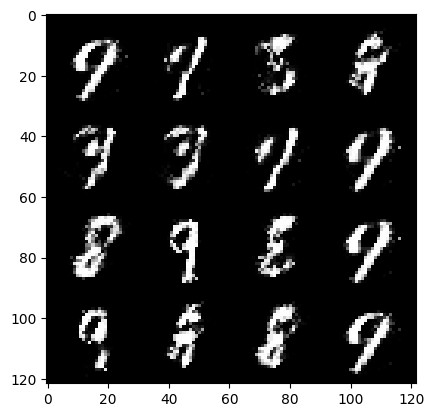

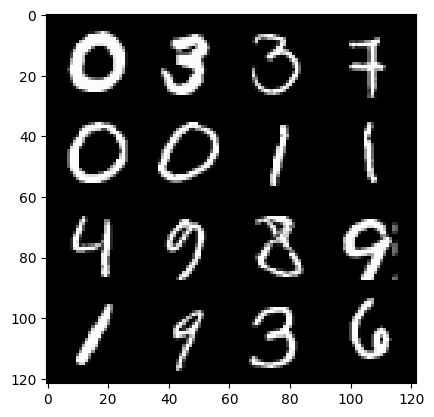

85: step 40200 / Gen loss: 4.142470307350157 / disc_loss: 0.09792979807903368


  0%|          | 0/469 [00:00<?, ?it/s]

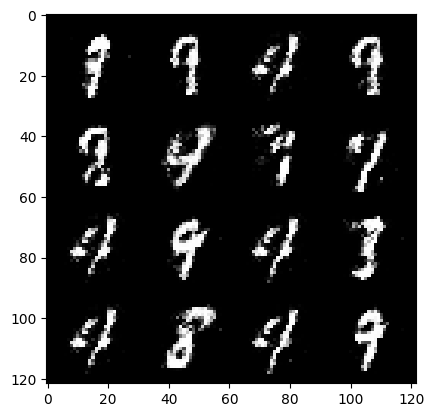

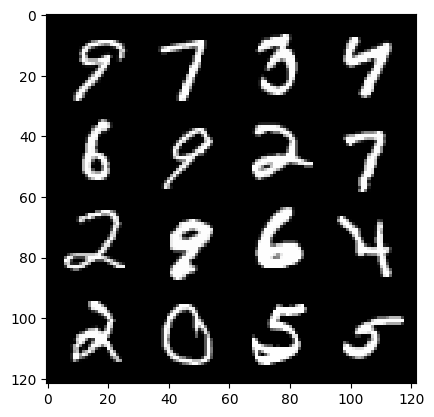

86: step 40500 / Gen loss: 4.171189977327983 / disc_loss: 0.09422422938048841


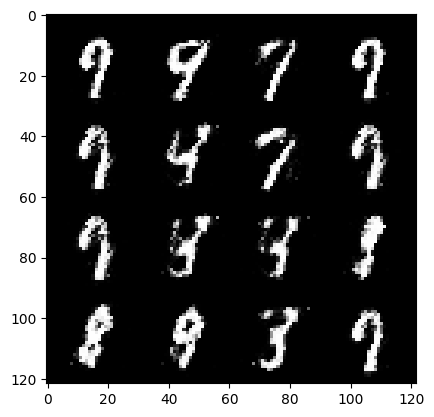

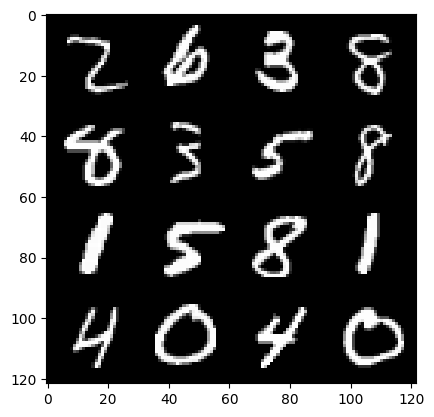

86: step 40800 / Gen loss: 4.323077382246656 / disc_loss: 0.10036946255092813


  0%|          | 0/469 [00:00<?, ?it/s]

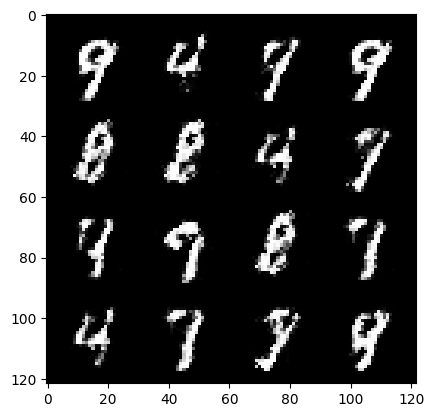

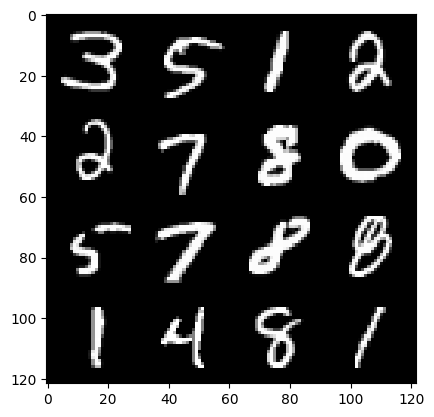

87: step 41100 / Gen loss: 3.898379969596863 / disc_loss: 0.10157928035284082


  0%|          | 0/469 [00:00<?, ?it/s]

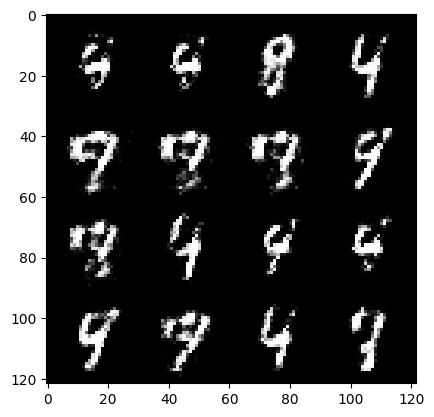

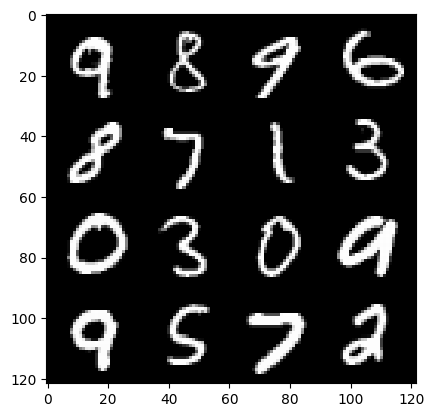

88: step 41400 / Gen loss: 4.185445024967194 / disc_loss: 0.08820067097122469


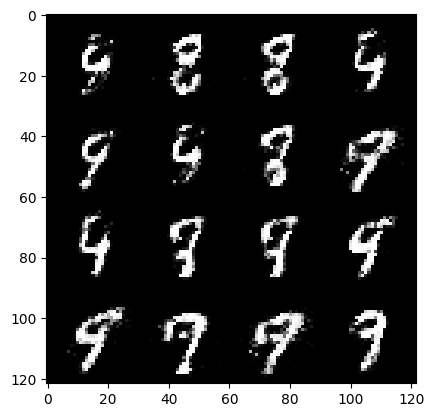

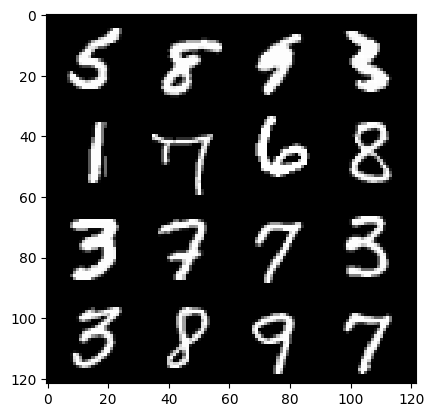

88: step 41700 / Gen loss: 3.8985695592562366 / disc_loss: 0.09907637396206463


  0%|          | 0/469 [00:00<?, ?it/s]

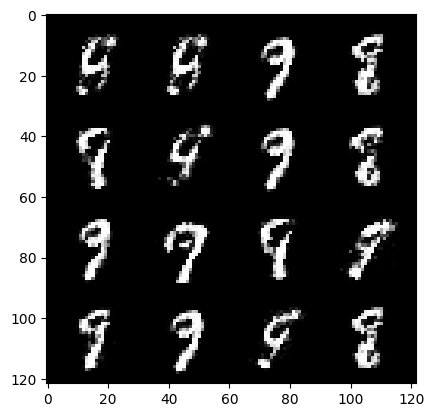

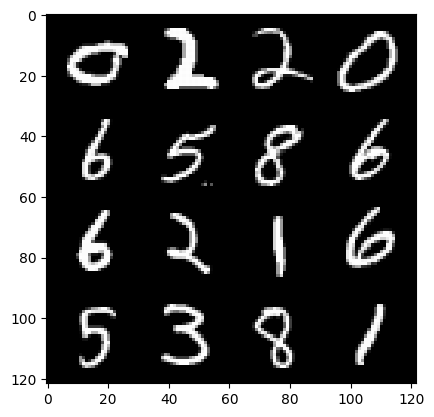

89: step 42000 / Gen loss: 4.140886154969534 / disc_loss: 0.09676877522220213


  0%|          | 0/469 [00:00<?, ?it/s]

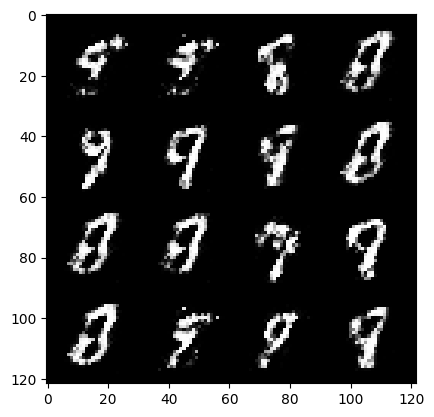

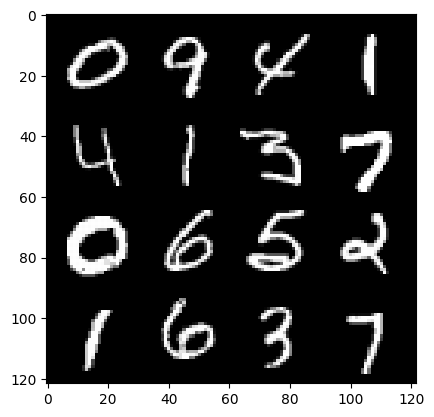

90: step 42300 / Gen loss: 3.906949915885925 / disc_loss: 0.10769212516645588


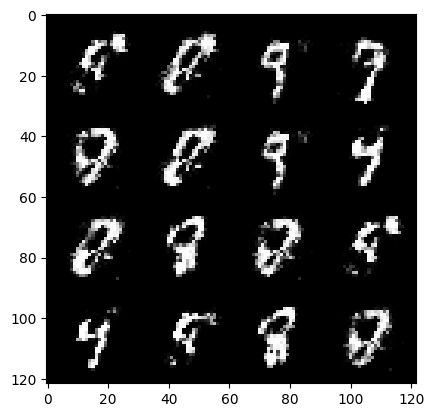

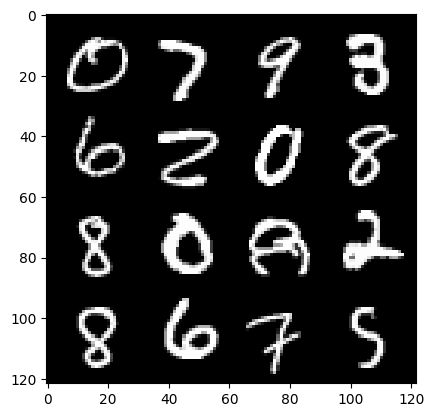

90: step 42600 / Gen loss: 4.047884982426964 / disc_loss: 0.11649219553917652


  0%|          | 0/469 [00:00<?, ?it/s]

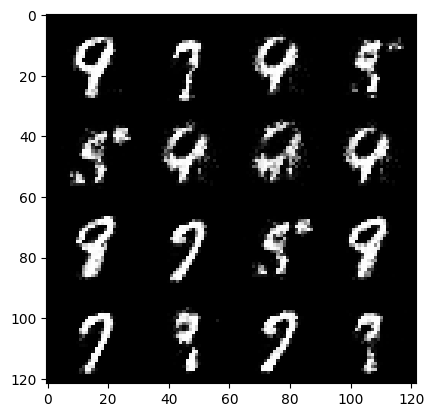

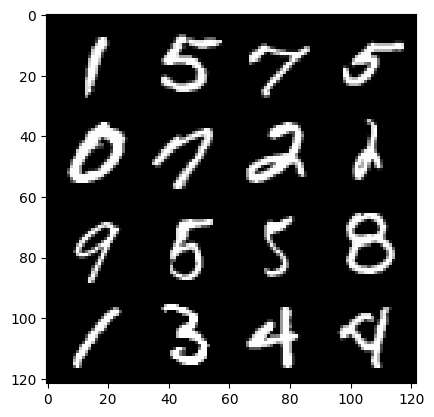

91: step 42900 / Gen loss: 4.074271694819134 / disc_loss: 0.11458753726134702


  0%|          | 0/469 [00:00<?, ?it/s]

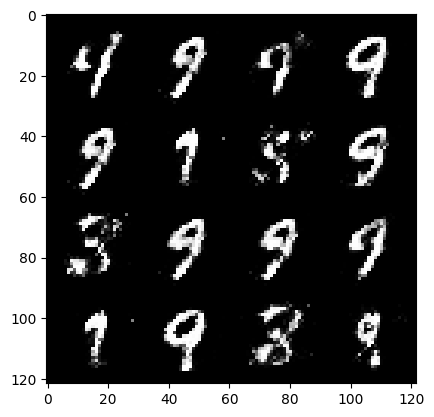

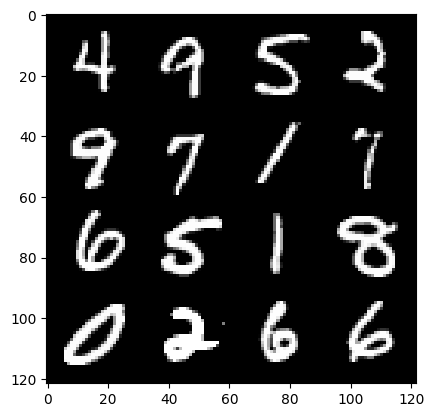

92: step 43200 / Gen loss: 4.002502708435057 / disc_loss: 0.10741025855143856


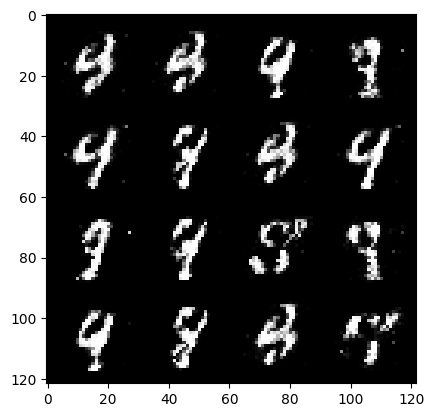

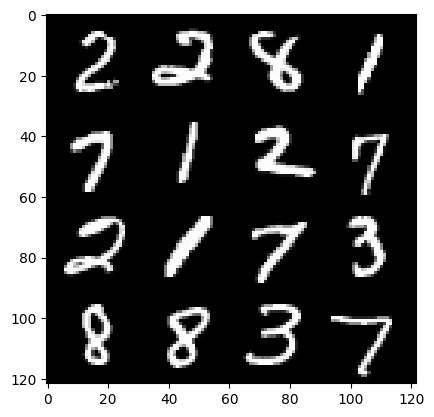

92: step 43500 / Gen loss: 4.186032883326214 / disc_loss: 0.1046904492378235


  0%|          | 0/469 [00:00<?, ?it/s]

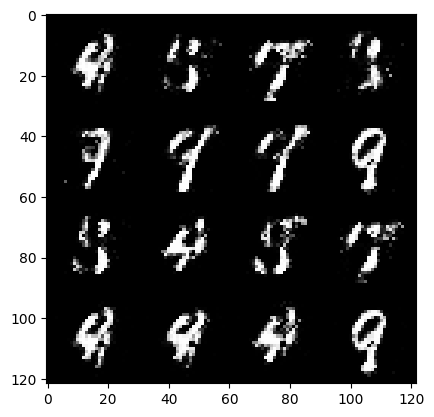

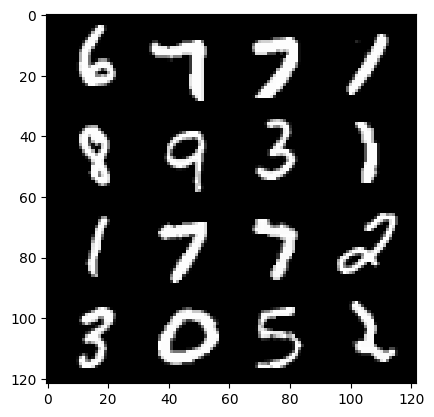

93: step 43800 / Gen loss: 4.230623122851053 / disc_loss: 0.10972925272459778


  0%|          | 0/469 [00:00<?, ?it/s]

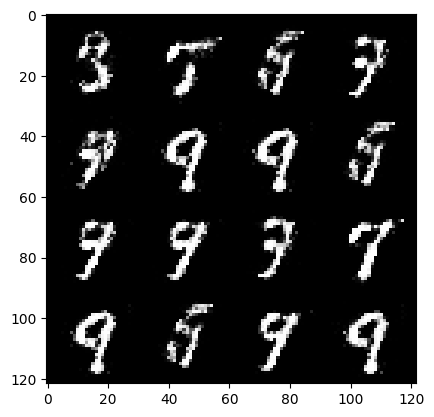

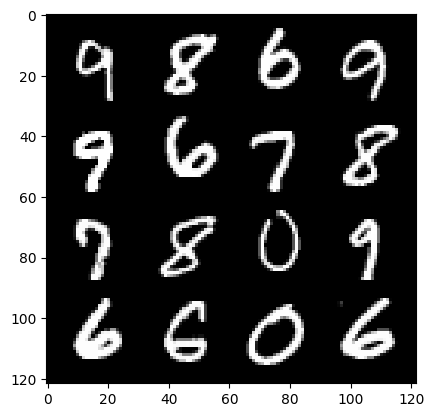

94: step 44100 / Gen loss: 3.9188268558184296 / disc_loss: 0.1201674819240967


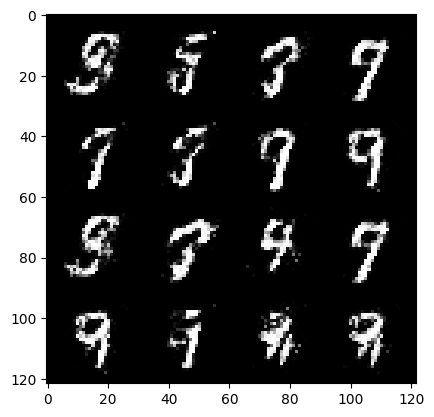

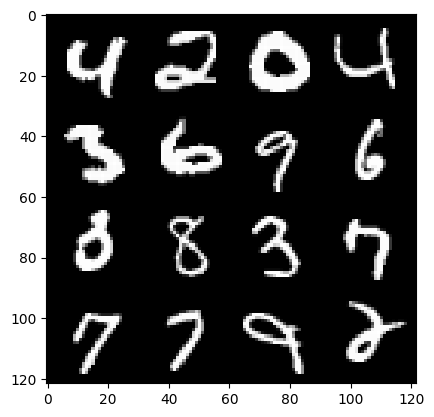

94: step 44400 / Gen loss: 4.14318140029907 / disc_loss: 0.10285152491182094


  0%|          | 0/469 [00:00<?, ?it/s]

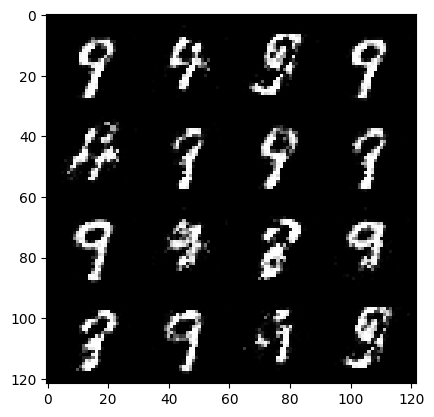

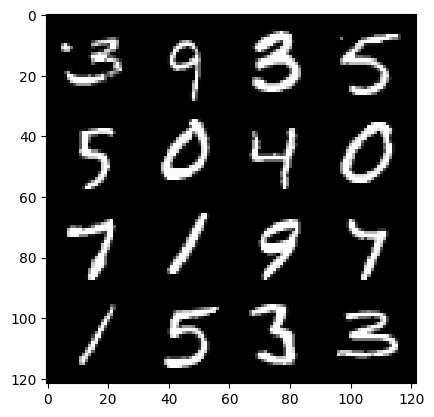

95: step 44700 / Gen loss: 4.053568731943768 / disc_loss: 0.09274884893248485


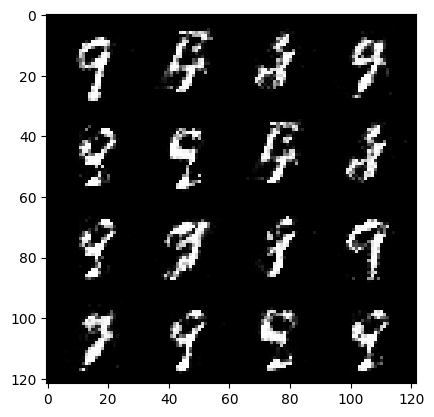

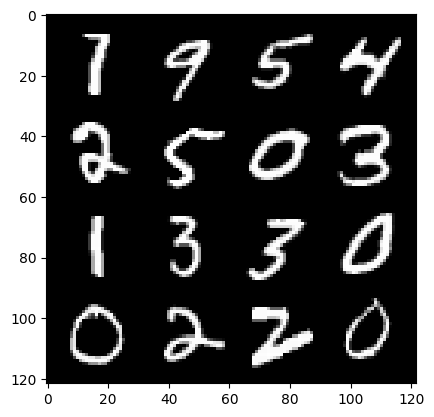

95: step 45000 / Gen loss: 4.298694171110789 / disc_loss: 0.08956151243920131


  0%|          | 0/469 [00:00<?, ?it/s]

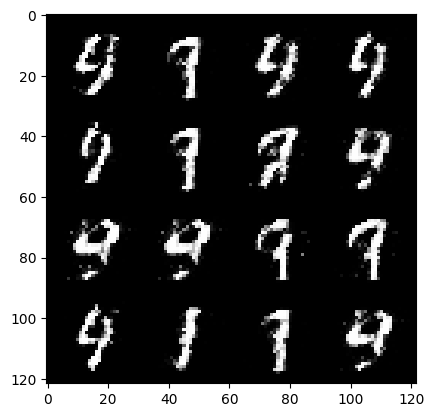

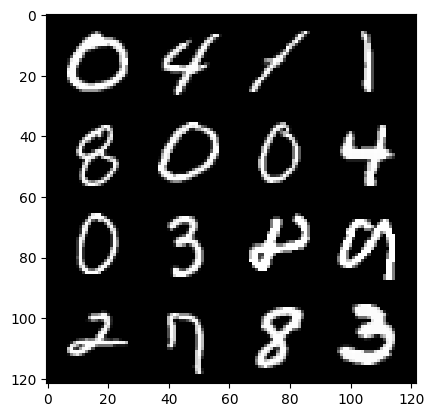

96: step 45300 / Gen loss: 3.8487696949640884 / disc_loss: 0.11046613011509183


  0%|          | 0/469 [00:00<?, ?it/s]

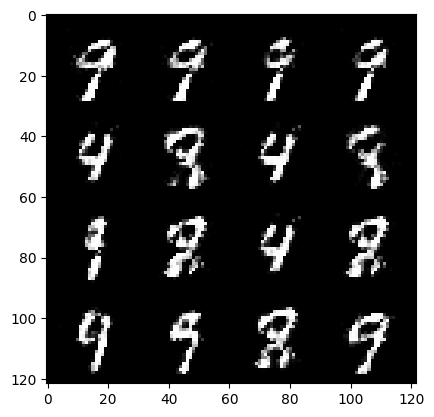

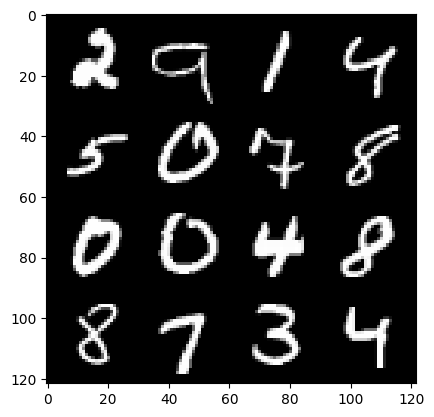

97: step 45600 / Gen loss: 3.786703507900238 / disc_loss: 0.13066690195351832


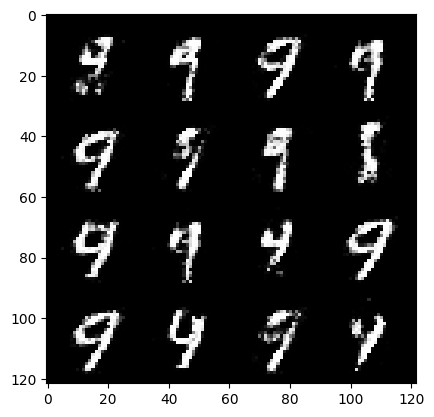

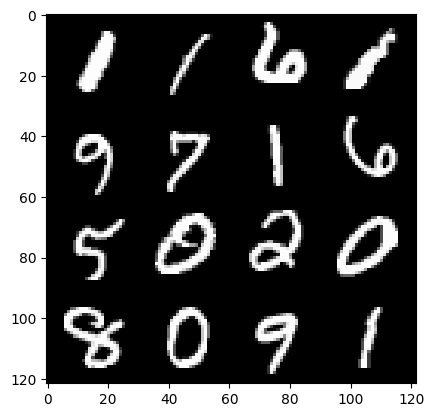

97: step 45900 / Gen loss: 3.710464971065517 / disc_loss: 0.11764029659330838


  0%|          | 0/469 [00:00<?, ?it/s]

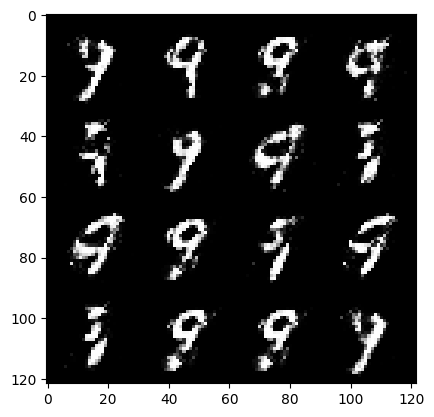

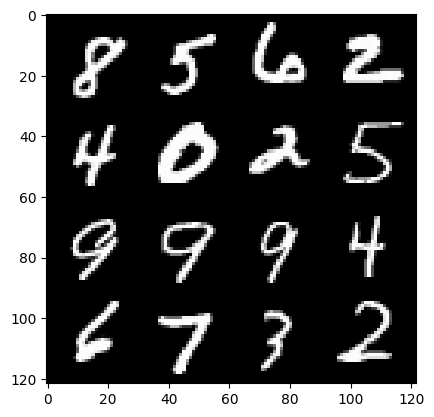

98: step 46200 / Gen loss: 3.770037212371827 / disc_loss: 0.11441812091817466


  0%|          | 0/469 [00:00<?, ?it/s]

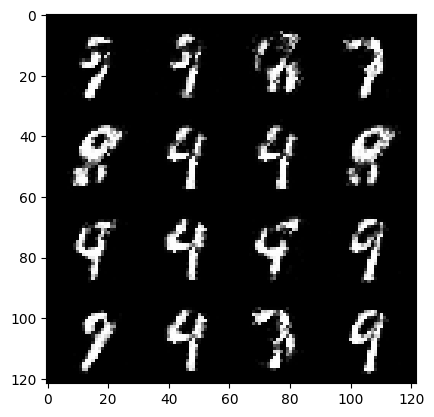

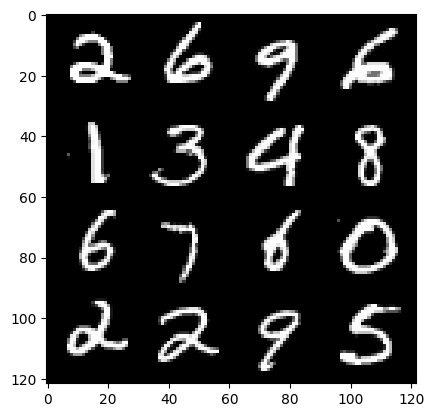

99: step 46500 / Gen loss: 3.8014233191808087 / disc_loss: 0.11593675141533206


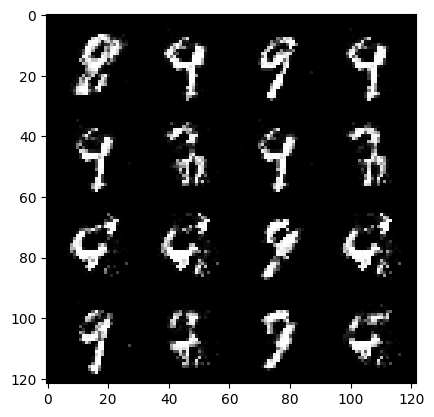

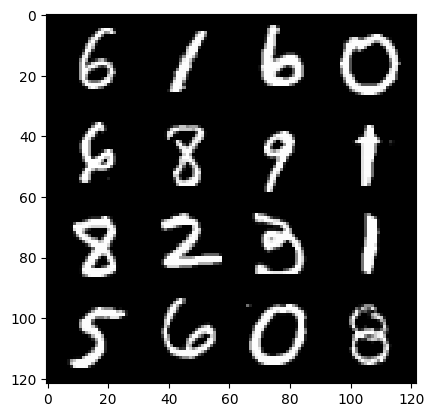

99: step 46800 / Gen loss: 3.755671338240308 / disc_loss: 0.12194901251544546


  0%|          | 0/469 [00:00<?, ?it/s]

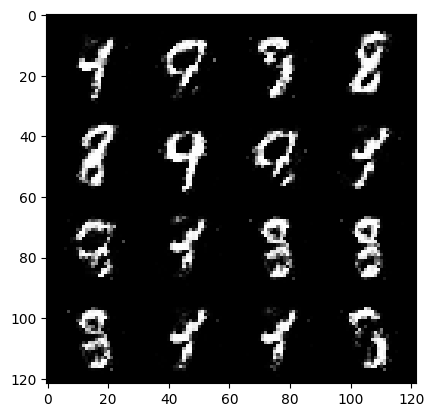

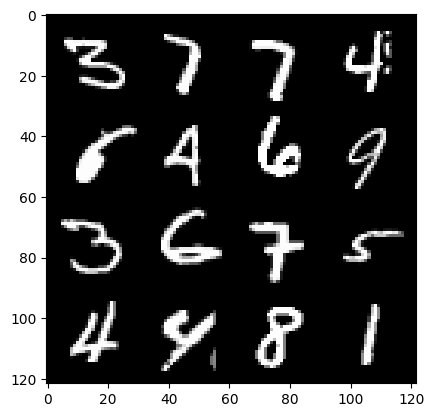

100: step 47100 / Gen loss: 3.7468037788073203 / disc_loss: 0.12347295733789601


  0%|          | 0/469 [00:00<?, ?it/s]

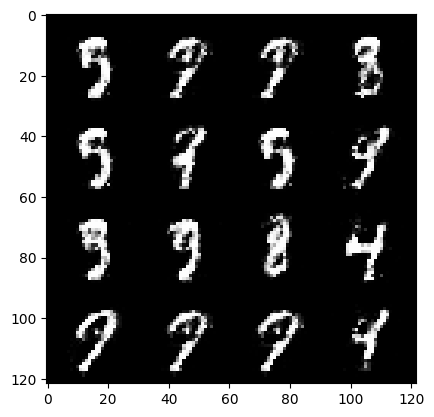

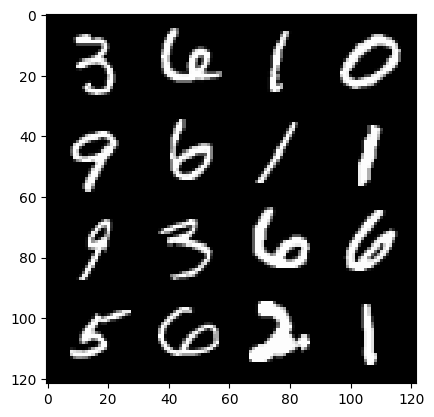

101: step 47400 / Gen loss: 3.417962263425188 / disc_loss: 0.14073420160760494


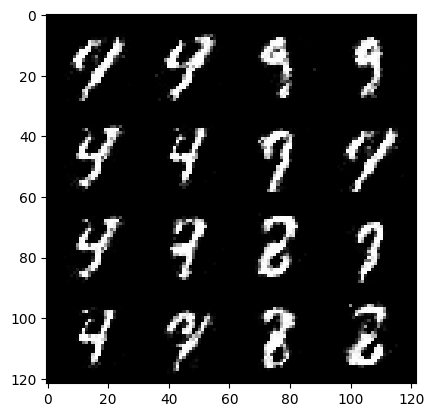

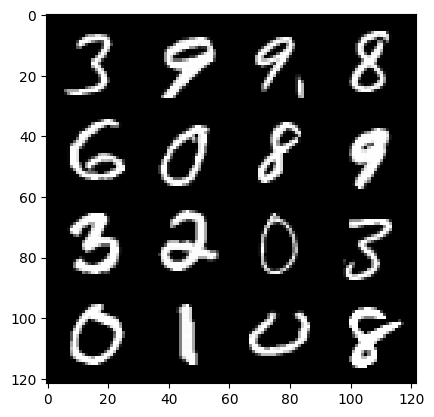

101: step 47700 / Gen loss: 3.7165017716089865 / disc_loss: 0.11592627366383865


  0%|          | 0/469 [00:00<?, ?it/s]

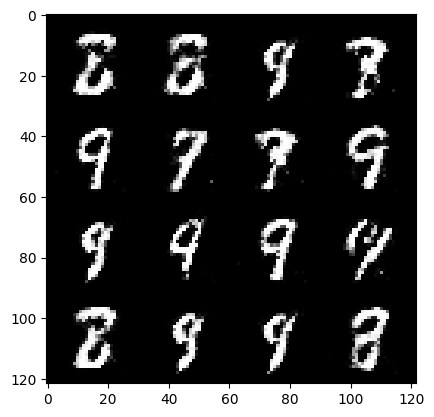

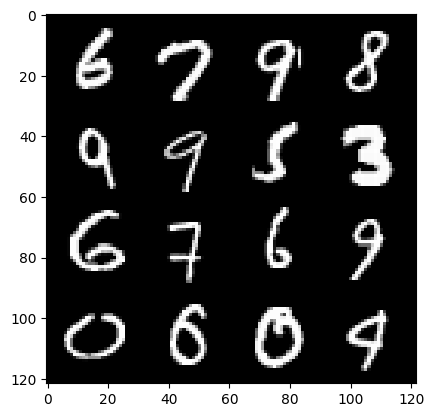

102: step 48000 / Gen loss: 3.6458358987172437 / disc_loss: 0.12614994451403622


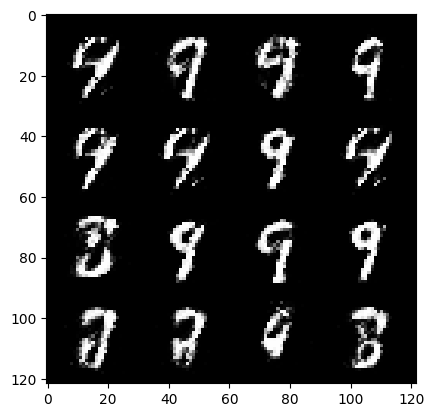

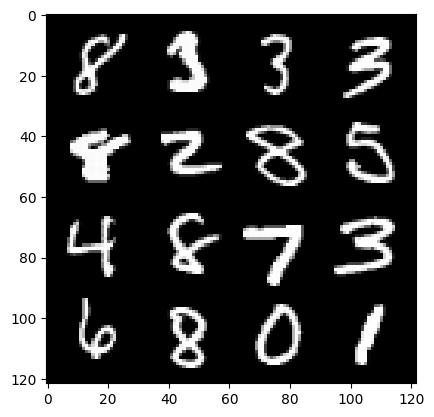

102: step 48300 / Gen loss: 3.5747087430953965 / disc_loss: 0.11572722638646757


  0%|          | 0/469 [00:00<?, ?it/s]

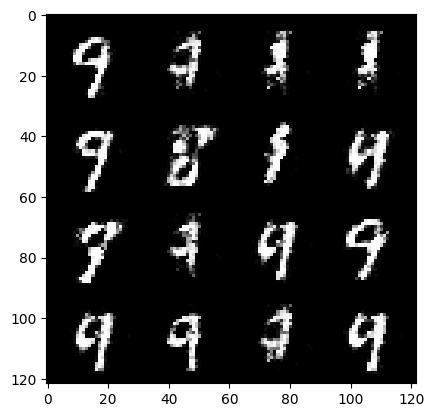

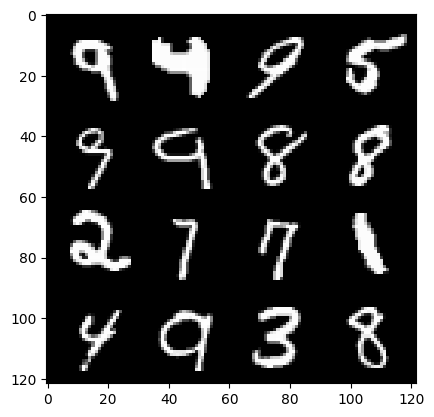

103: step 48600 / Gen loss: 3.565892449220021 / disc_loss: 0.1444634082789223


  0%|          | 0/469 [00:00<?, ?it/s]

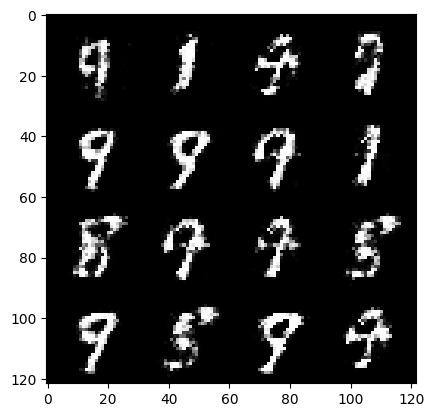

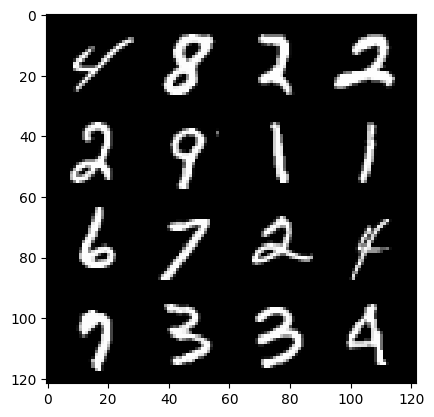

104: step 48900 / Gen loss: 3.3150895682970667 / disc_loss: 0.16650306430955722


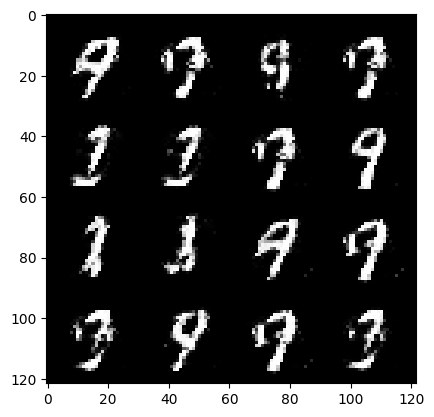

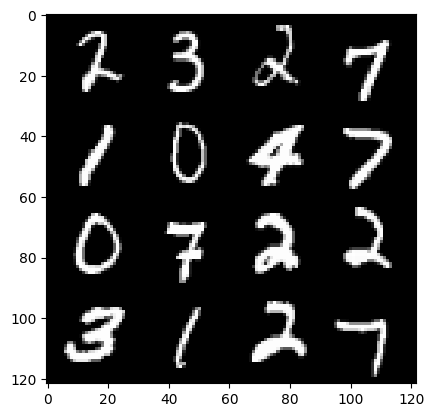

104: step 49200 / Gen loss: 3.4263104987144457 / disc_loss: 0.1372391942515969


  0%|          | 0/469 [00:00<?, ?it/s]

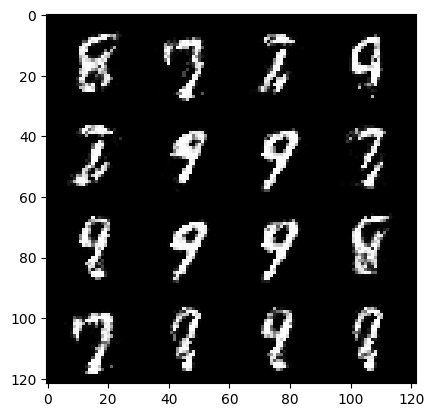

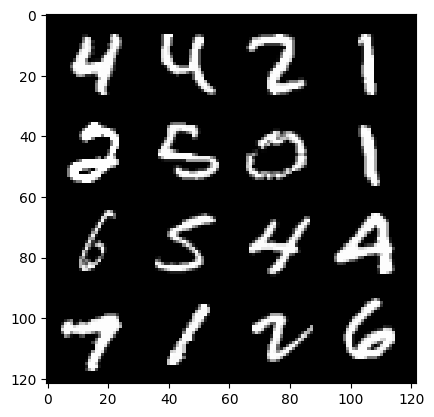

105: step 49500 / Gen loss: 3.338327380021413 / disc_loss: 0.14882312143842386


  0%|          | 0/469 [00:00<?, ?it/s]

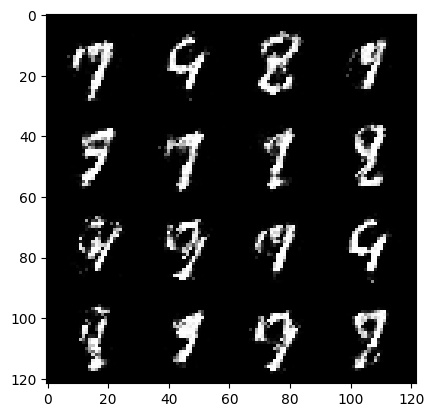

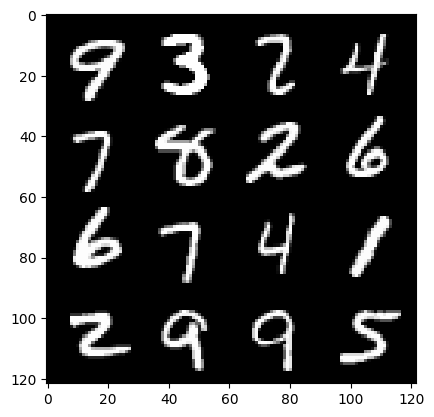

106: step 49800 / Gen loss: 3.3104222567876183 / disc_loss: 0.14826863035559654


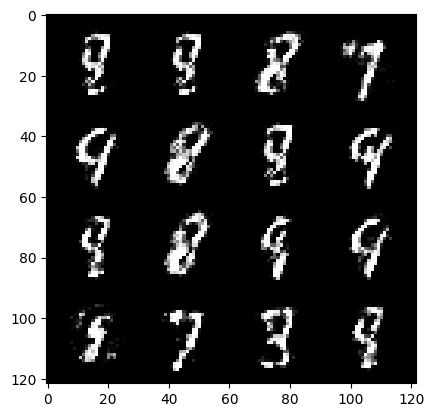

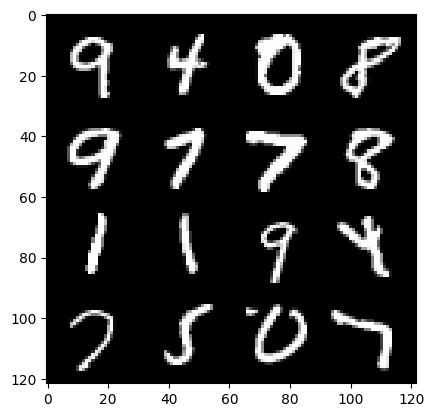

106: step 50100 / Gen loss: 3.28139003833135 / disc_loss: 0.1519409114743273


  0%|          | 0/469 [00:00<?, ?it/s]

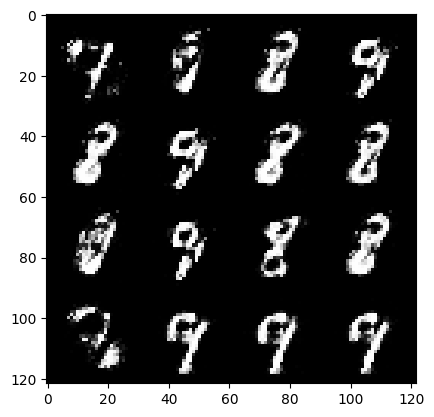

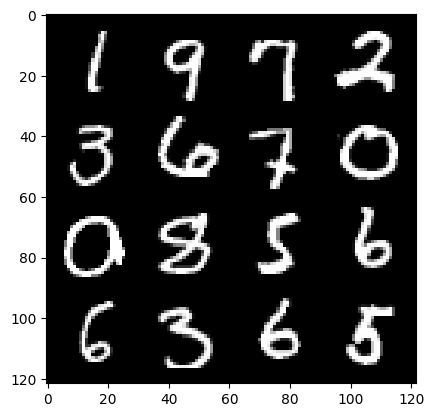

107: step 50400 / Gen loss: 3.5702253651618934 / disc_loss: 0.16552859219411997


  0%|          | 0/469 [00:00<?, ?it/s]

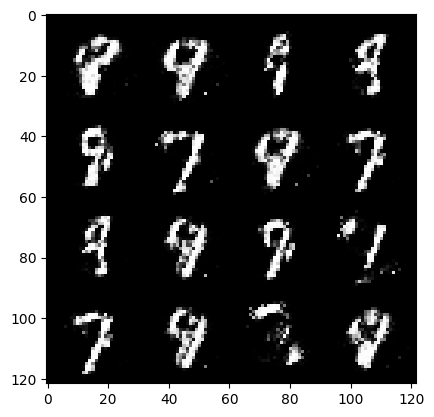

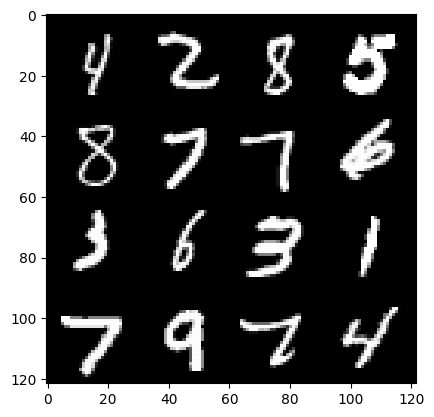

108: step 50700 / Gen loss: 3.12498498837153 / disc_loss: 0.1755744005242983


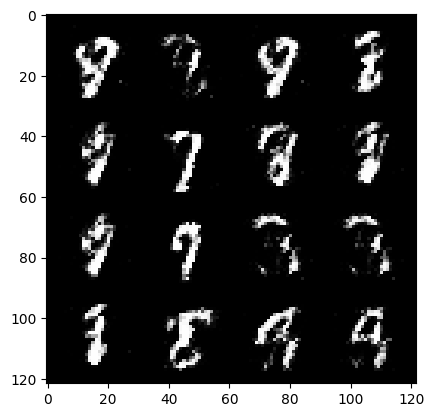

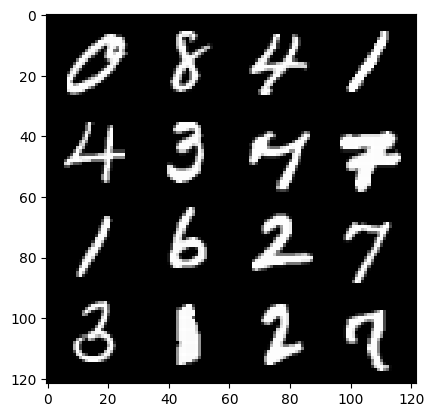

108: step 51000 / Gen loss: 3.3972394951184586 / disc_loss: 0.1443523550281922


  0%|          | 0/469 [00:00<?, ?it/s]

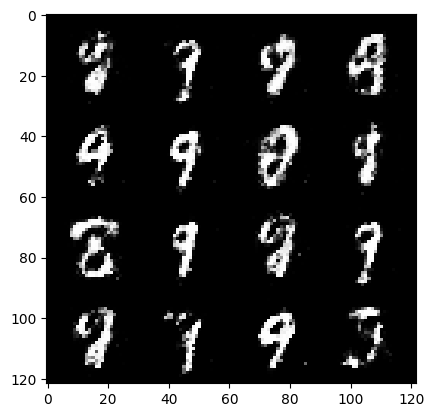

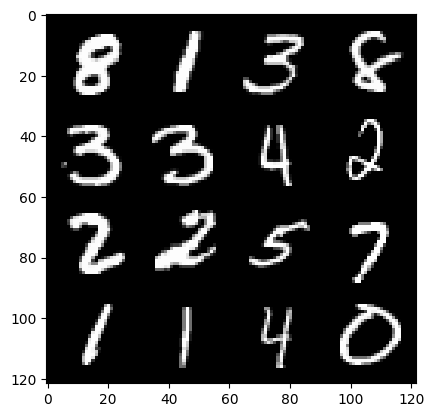

109: step 51300 / Gen loss: 3.378235936164856 / disc_loss: 0.15245523544649295


  0%|          | 0/469 [00:00<?, ?it/s]

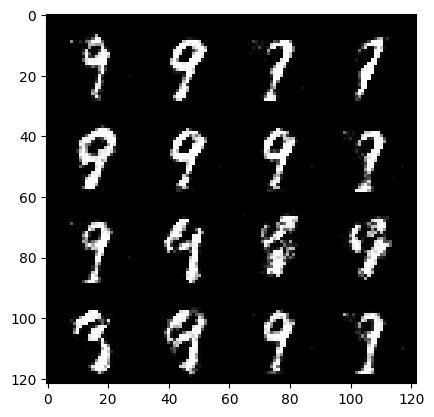

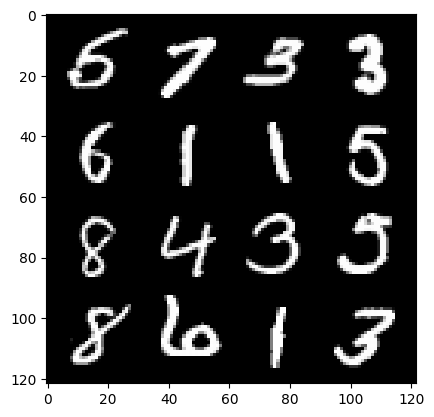

110: step 51600 / Gen loss: 3.320574713548023 / disc_loss: 0.14293747093528505


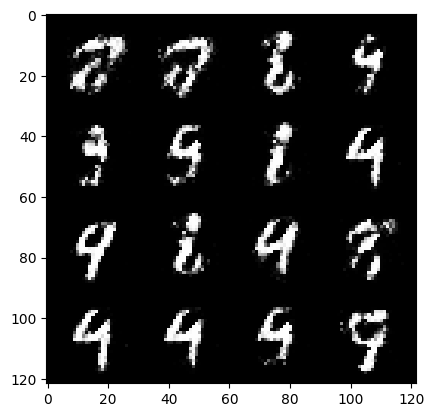

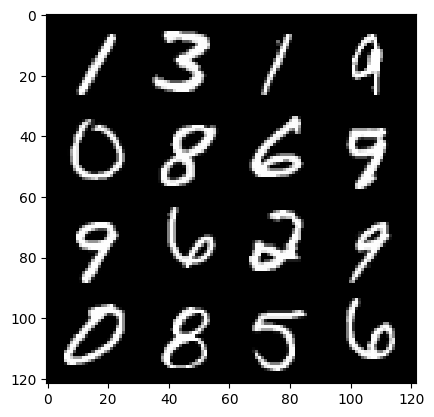

110: step 51900 / Gen loss: 3.24912790218989 / disc_loss: 0.14954595466454815


  0%|          | 0/469 [00:00<?, ?it/s]

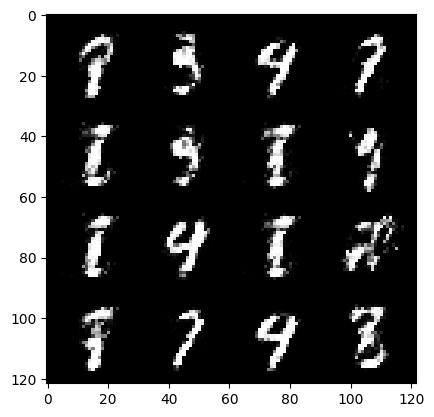

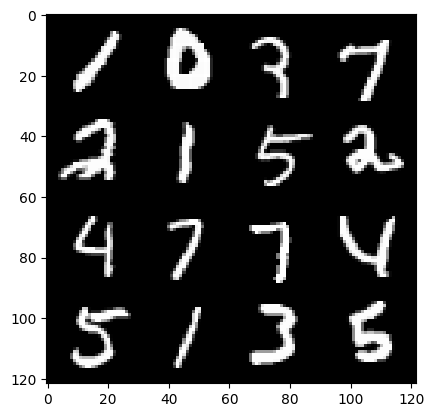

111: step 52200 / Gen loss: 3.42151035308838 / disc_loss: 0.1248238661512733


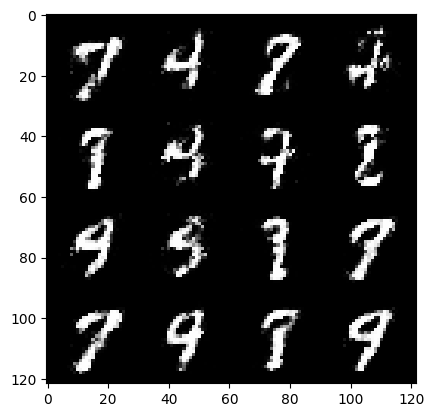

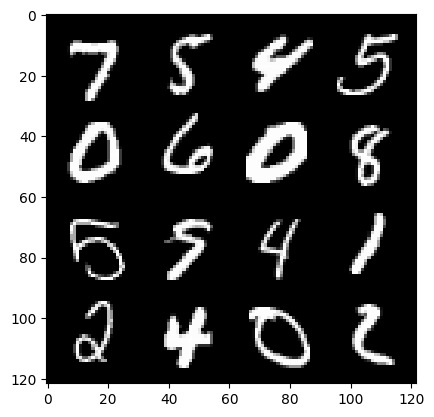

111: step 52500 / Gen loss: 3.3737680117289237 / disc_loss: 0.14876814344276984


  0%|          | 0/469 [00:00<?, ?it/s]

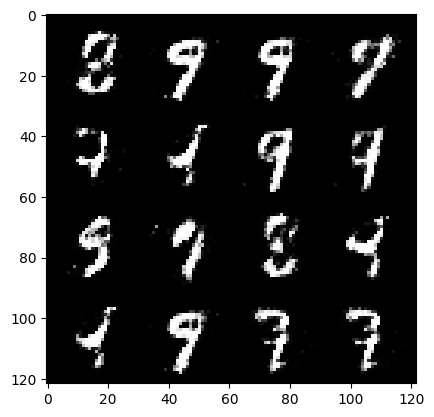

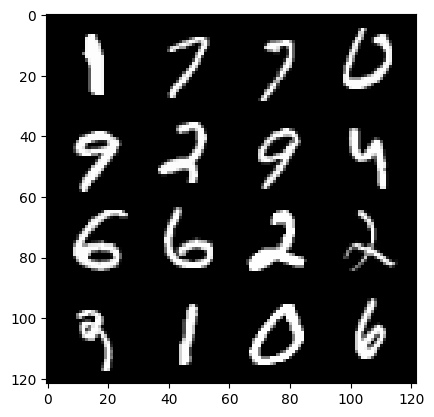

112: step 52800 / Gen loss: 3.364099637667336 / disc_loss: 0.14335880200068146


  0%|          | 0/469 [00:00<?, ?it/s]

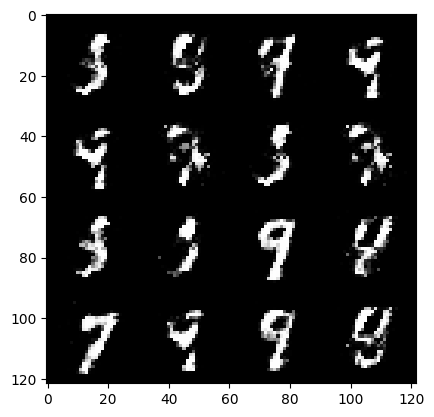

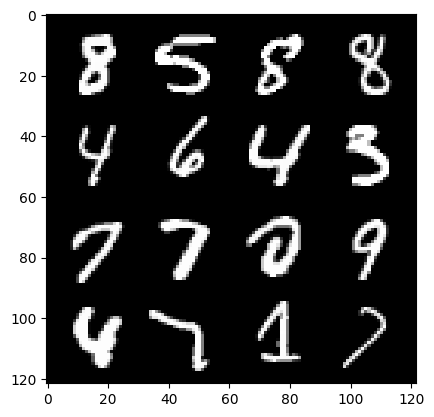

113: step 53100 / Gen loss: 3.415379401048026 / disc_loss: 0.13508093285063913


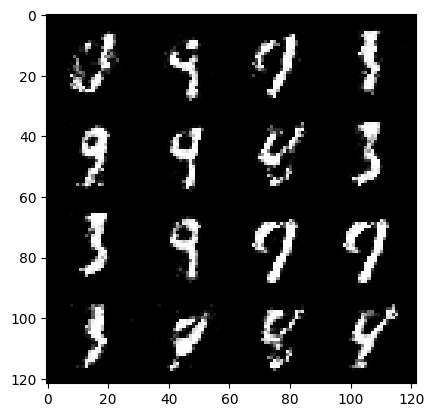

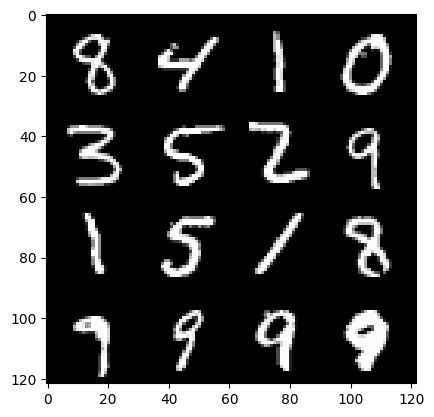

113: step 53400 / Gen loss: 3.3376388271649686 / disc_loss: 0.1508007053285838


  0%|          | 0/469 [00:00<?, ?it/s]

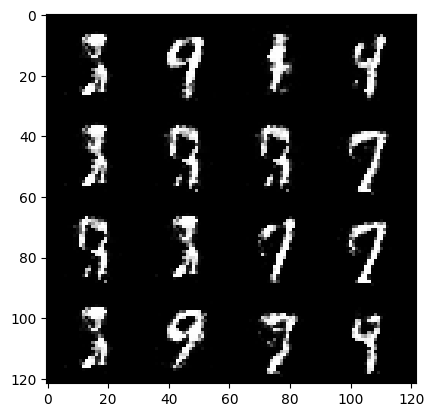

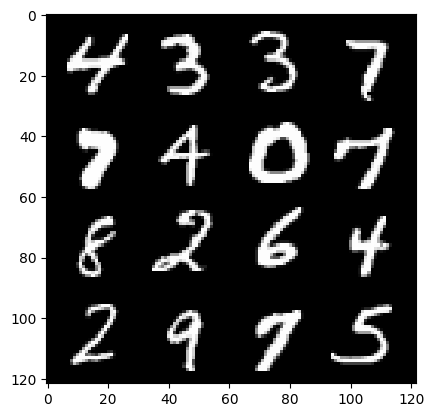

114: step 53700 / Gen loss: 3.407712510426836 / disc_loss: 0.13046712788442785


  0%|          | 0/469 [00:00<?, ?it/s]

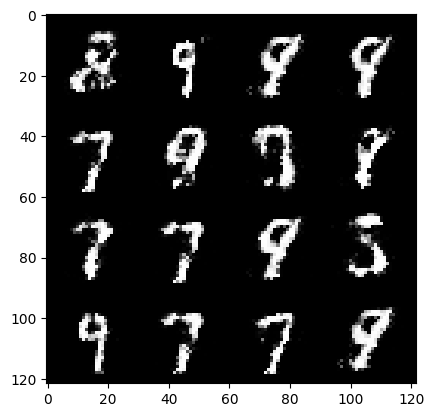

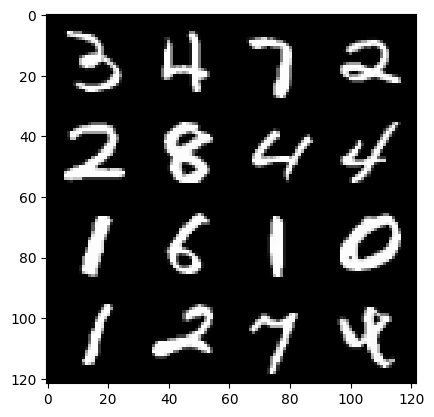

115: step 54000 / Gen loss: 3.470315613746645 / disc_loss: 0.1411271111418803


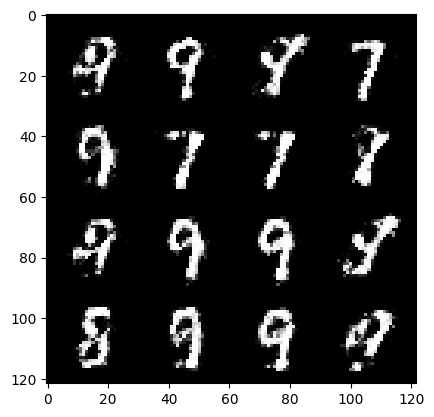

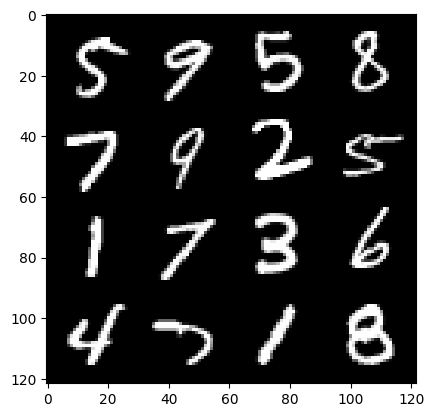

115: step 54300 / Gen loss: 3.3332186722755437 / disc_loss: 0.15334913412729897


  0%|          | 0/469 [00:00<?, ?it/s]

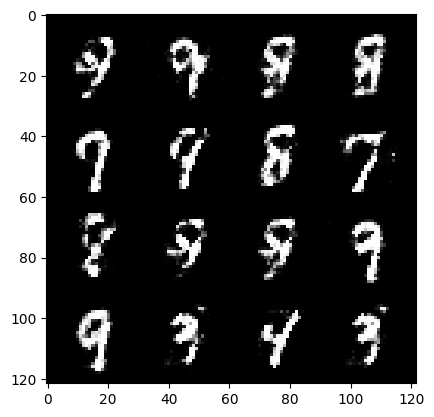

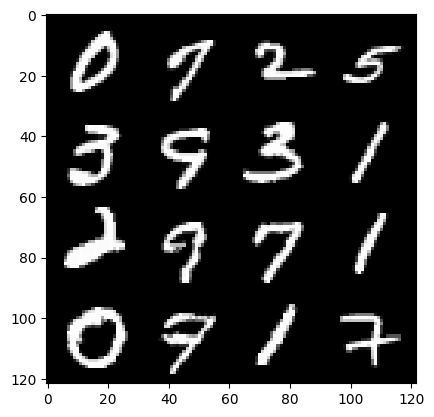

116: step 54600 / Gen loss: 3.3939843265215552 / disc_loss: 0.1369729029387235


  0%|          | 0/469 [00:00<?, ?it/s]

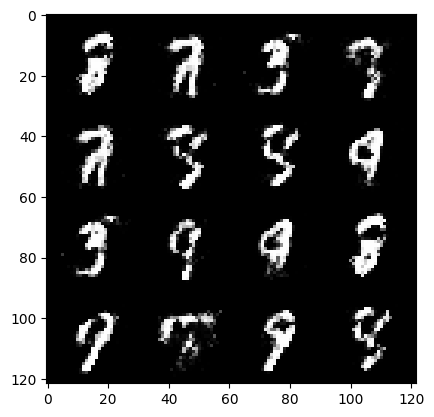

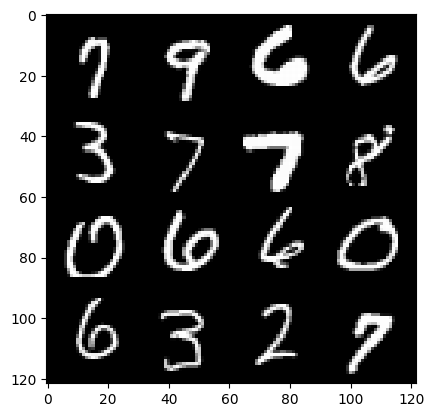

117: step 54900 / Gen loss: 3.5641816091537493 / disc_loss: 0.125086851765712


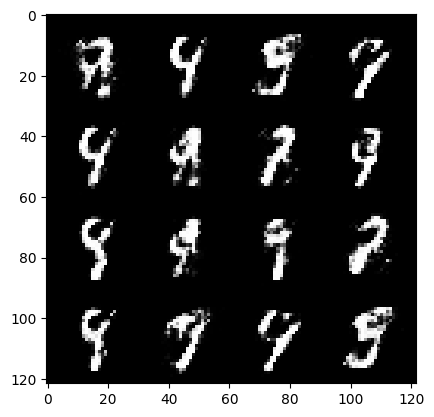

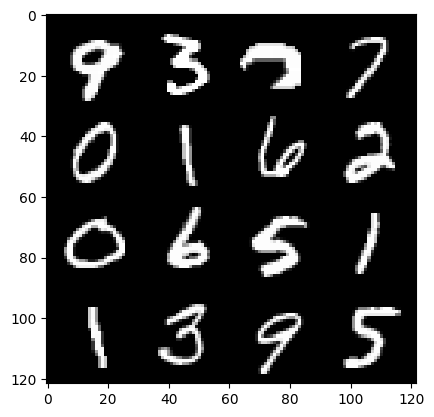

117: step 55200 / Gen loss: 3.35879695892334 / disc_loss: 0.1422770755738019


  0%|          | 0/469 [00:00<?, ?it/s]

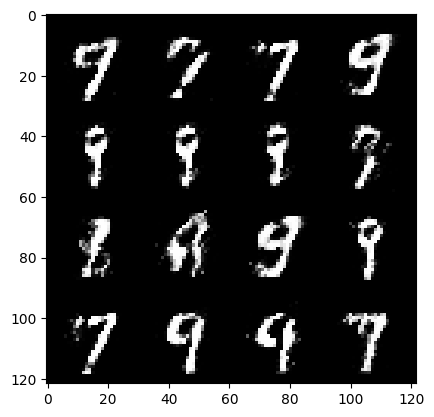

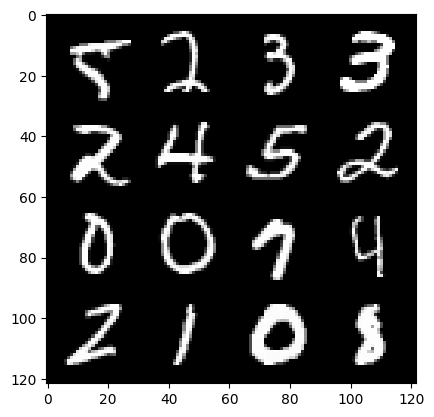

118: step 55500 / Gen loss: 3.116170359452566 / disc_loss: 0.1685433959712585


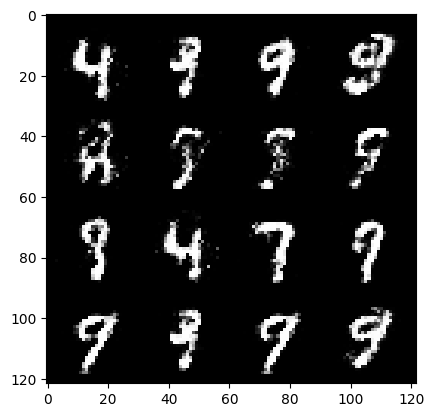

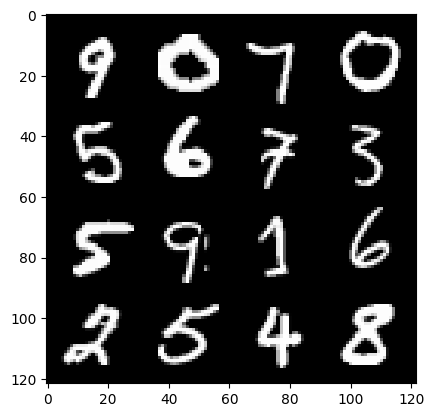

118: step 55800 / Gen loss: 3.2769987050692246 / disc_loss: 0.13414524175226694


  0%|          | 0/469 [00:00<?, ?it/s]

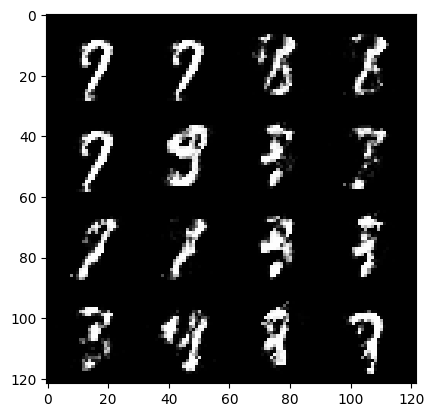

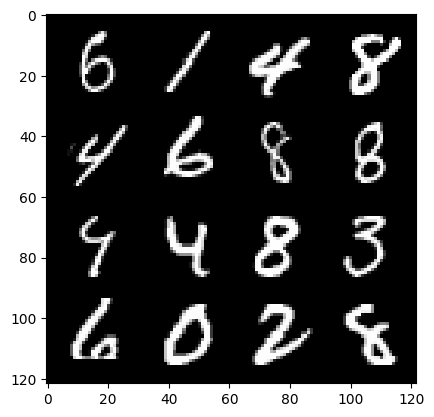

119: step 56100 / Gen loss: 3.169133070309956 / disc_loss: 0.15446247048676


  0%|          | 0/469 [00:00<?, ?it/s]

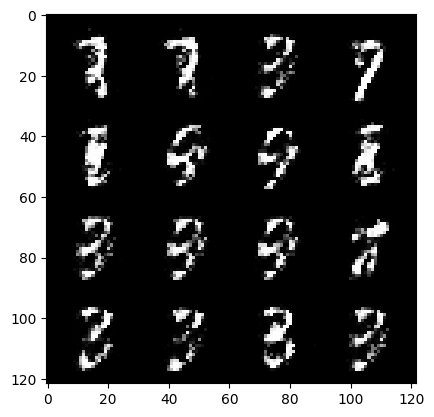

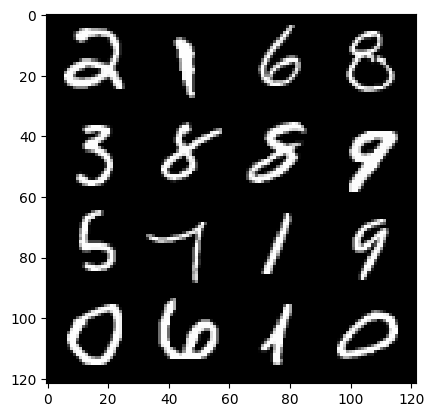

120: step 56400 / Gen loss: 3.3260146562258415 / disc_loss: 0.14574140517661965


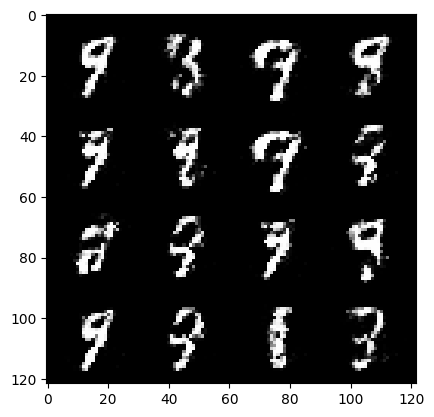

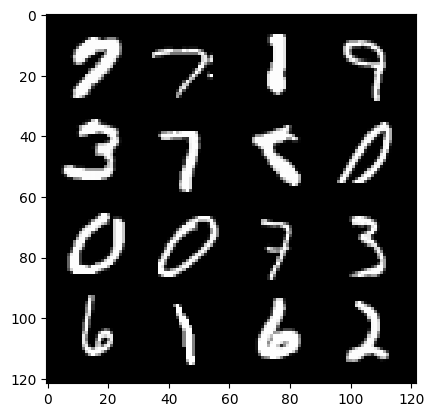

120: step 56700 / Gen loss: 3.2656346456209833 / disc_loss: 0.13316613803307223


  0%|          | 0/469 [00:00<?, ?it/s]

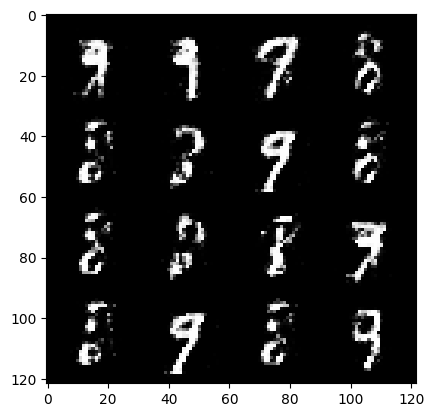

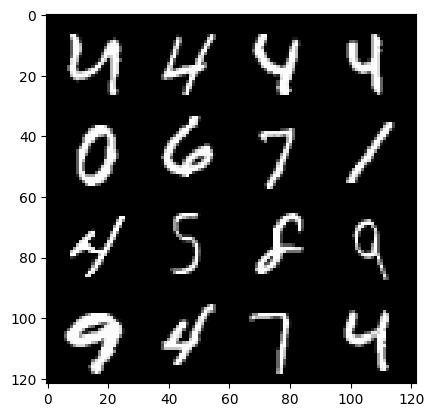

121: step 57000 / Gen loss: 3.639036641120912 / disc_loss: 0.11818033844232559


  0%|          | 0/469 [00:00<?, ?it/s]

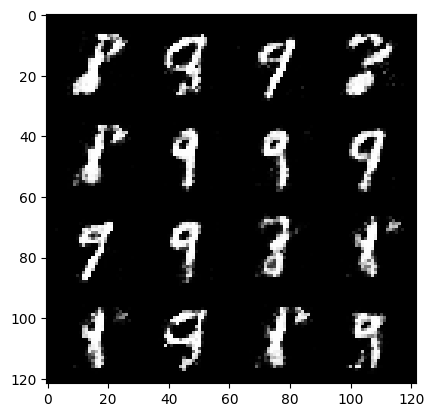

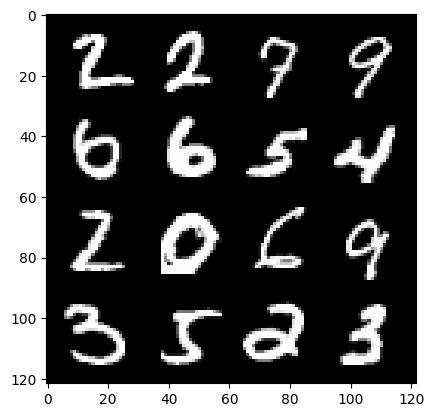

122: step 57300 / Gen loss: 3.402258568604787 / disc_loss: 0.14954881253341845


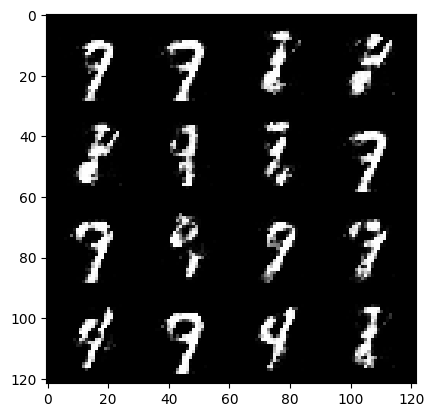

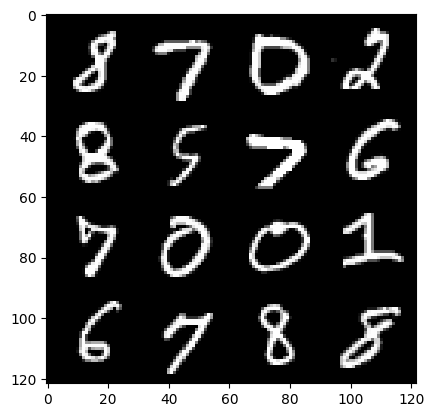

122: step 57600 / Gen loss: 3.530563950538637 / disc_loss: 0.1324523083493115


  0%|          | 0/469 [00:00<?, ?it/s]

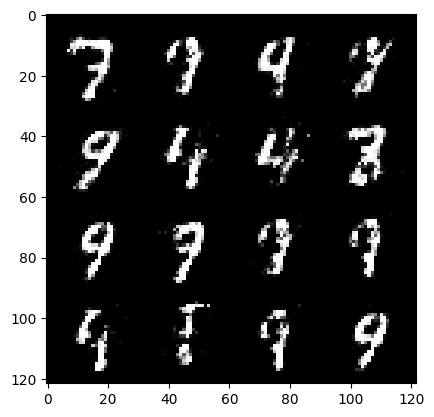

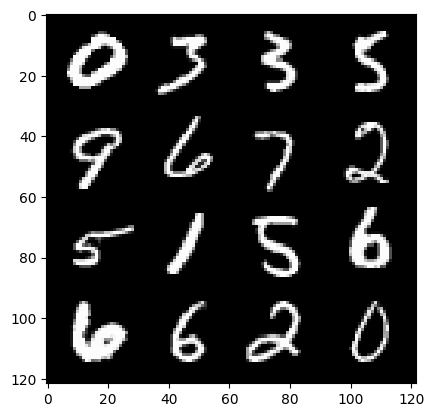

123: step 57900 / Gen loss: 3.2551854149500525 / disc_loss: 0.15211536912868406


  0%|          | 0/469 [00:00<?, ?it/s]

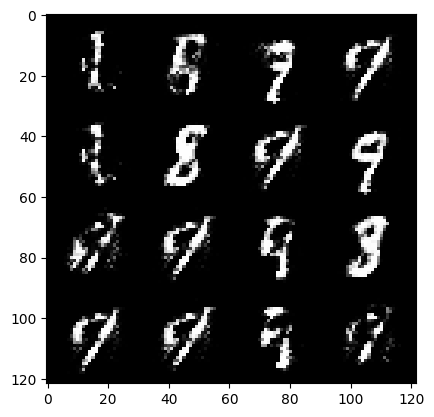

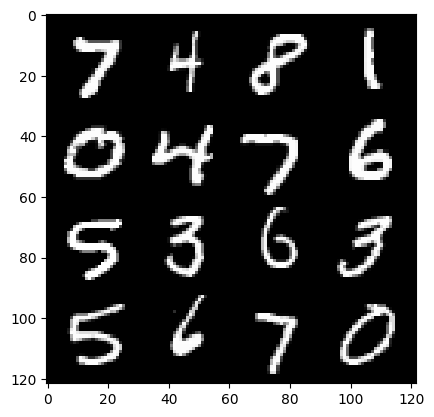

124: step 58200 / Gen loss: 3.131504809061686 / disc_loss: 0.17772151897350943


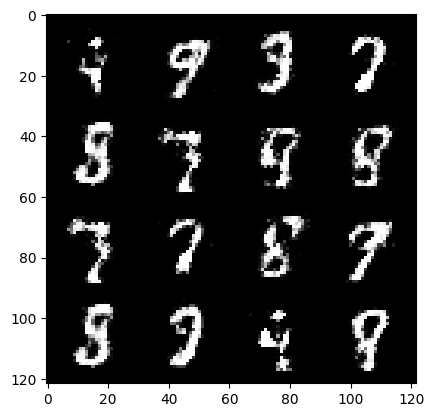

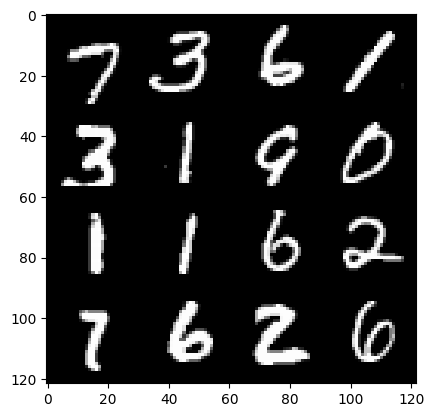

124: step 58500 / Gen loss: 3.182280643781027 / disc_loss: 0.15632676372925444


  0%|          | 0/469 [00:00<?, ?it/s]

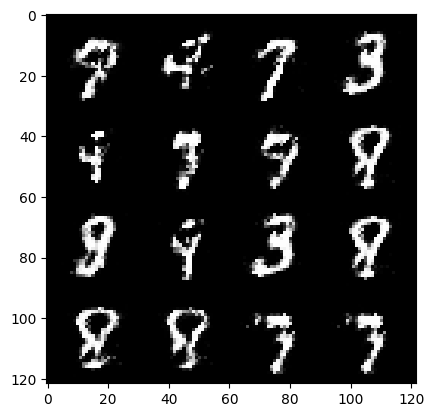

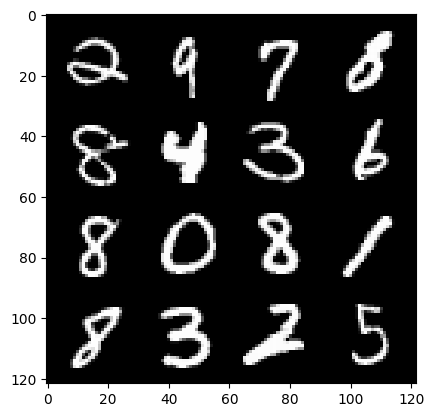

125: step 58800 / Gen loss: 3.2964534147580467 / disc_loss: 0.1337520242482425


  0%|          | 0/469 [00:00<?, ?it/s]

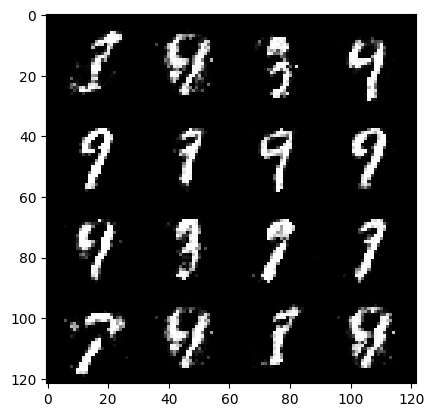

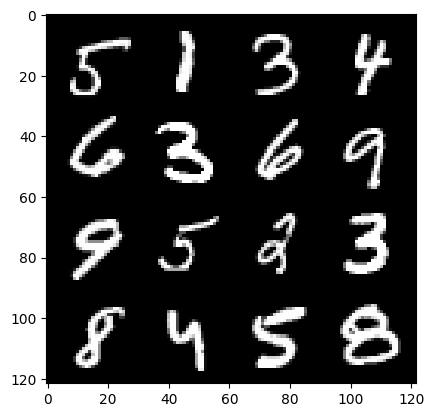

126: step 59100 / Gen loss: 3.1910969392458592 / disc_loss: 0.15700376711785793


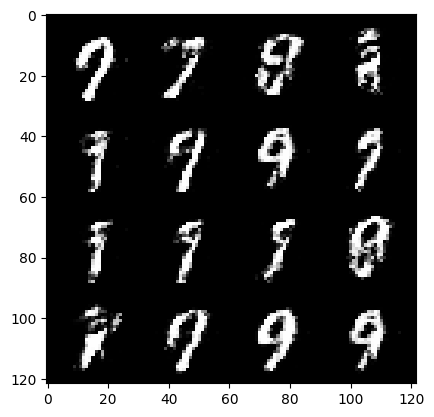

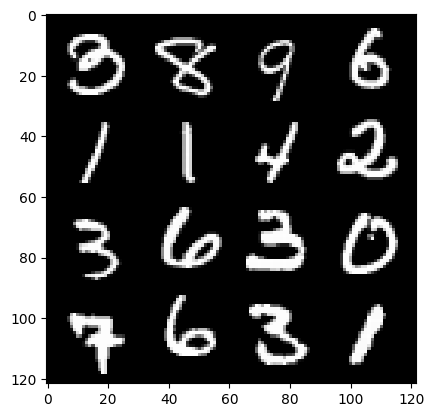

126: step 59400 / Gen loss: 3.1804254396756493 / disc_loss: 0.17361649123330894


  0%|          | 0/469 [00:00<?, ?it/s]

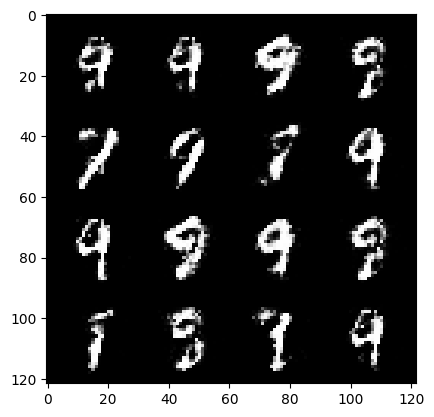

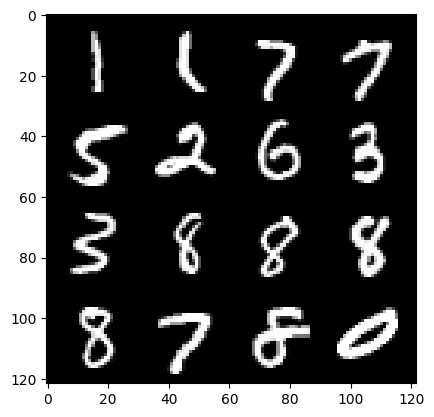

127: step 59700 / Gen loss: 3.087779618899027 / disc_loss: 0.16168614024917274


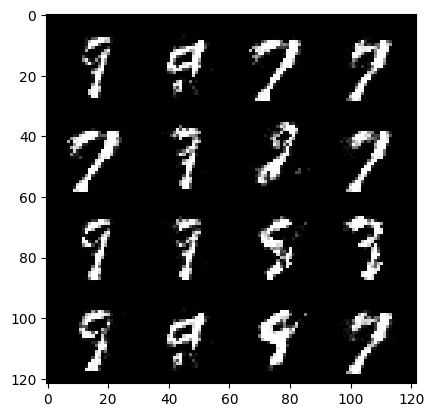

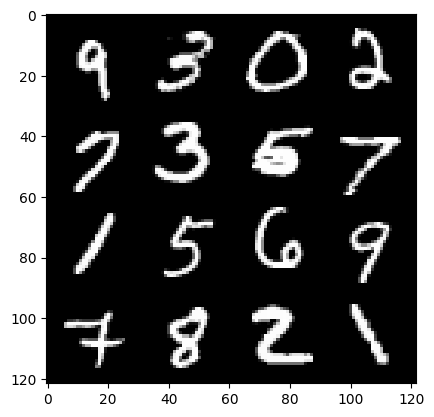

127: step 60000 / Gen loss: 3.257453345457711 / disc_loss: 0.12712607322881608


  0%|          | 0/469 [00:00<?, ?it/s]

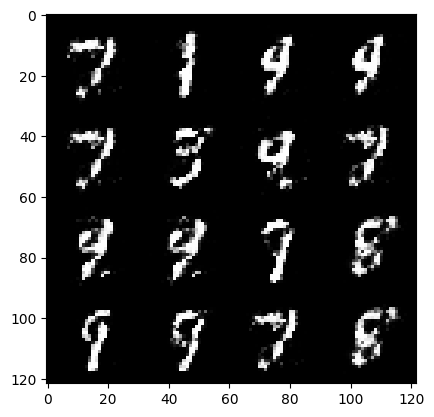

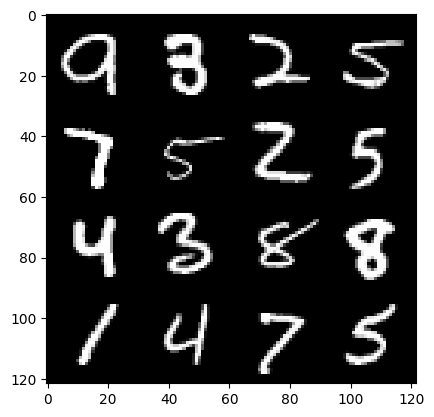

128: step 60300 / Gen loss: 3.7269070068995163 / disc_loss: 0.12038361062606179


  0%|          | 0/469 [00:00<?, ?it/s]

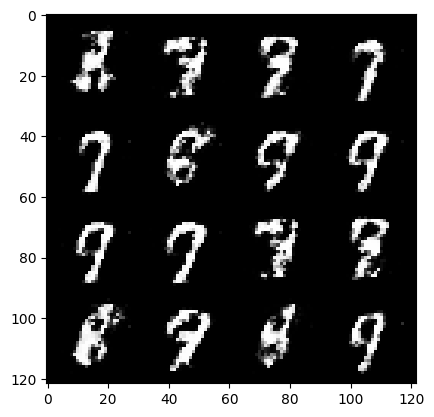

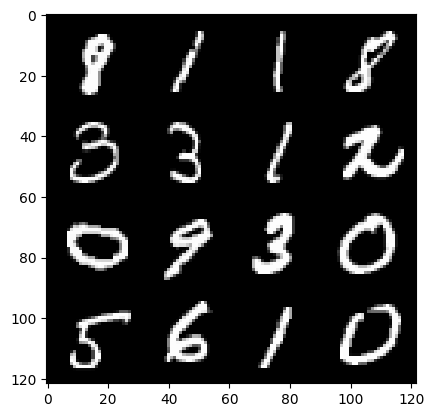

129: step 60600 / Gen loss: 3.2503057877222683 / disc_loss: 0.16408990785479544


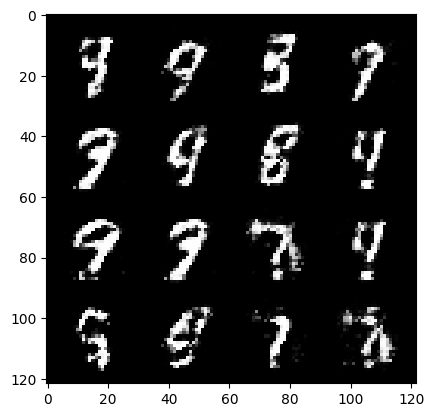

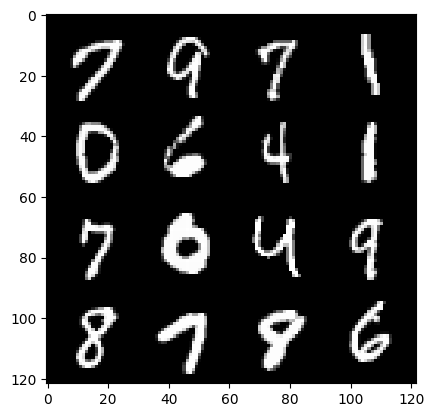

129: step 60900 / Gen loss: 3.181079397201541 / disc_loss: 0.1581700446456671


  0%|          | 0/469 [00:00<?, ?it/s]

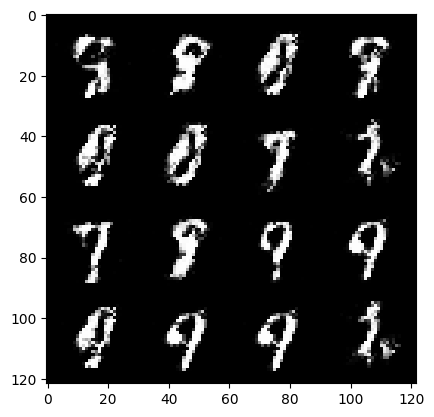

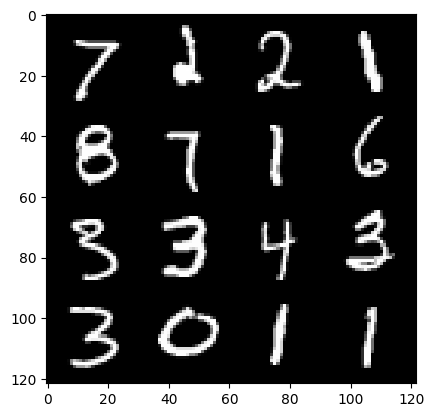

130: step 61200 / Gen loss: 3.2222626034418753 / disc_loss: 0.15185165092349057


  0%|          | 0/469 [00:00<?, ?it/s]

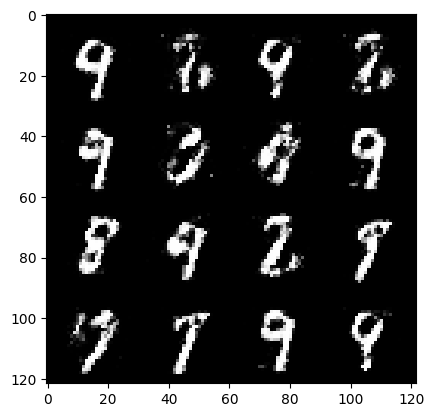

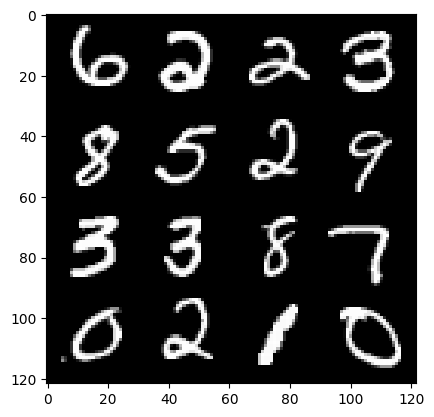

131: step 61500 / Gen loss: 3.0770746191342666 / disc_loss: 0.17285323495666177


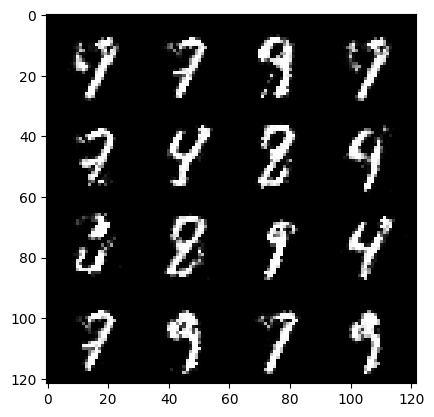

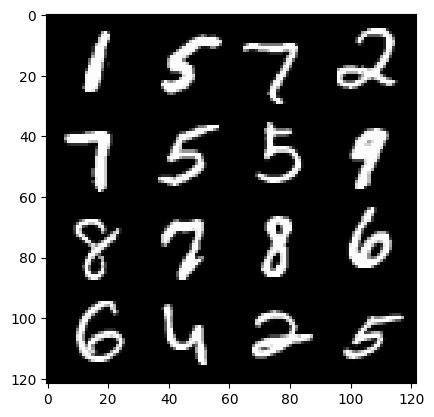

131: step 61800 / Gen loss: 2.9922747341791824 / disc_loss: 0.17645479458073787


  0%|          | 0/469 [00:00<?, ?it/s]

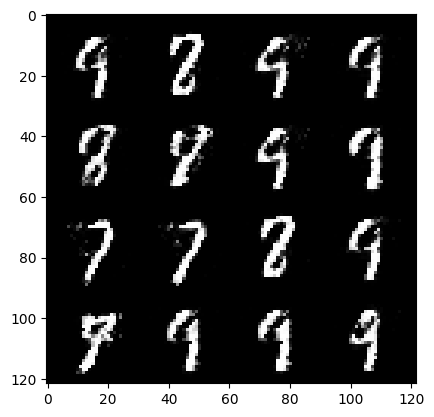

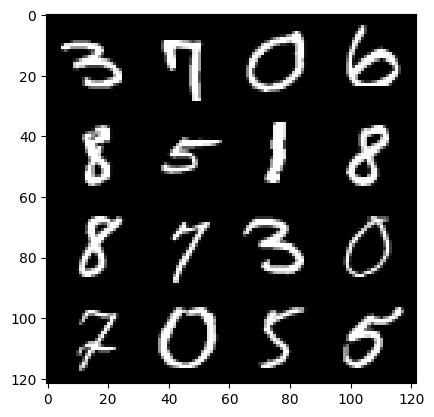

132: step 62100 / Gen loss: 3.1355562297503163 / disc_loss: 0.15069637534519037


  0%|          | 0/469 [00:00<?, ?it/s]

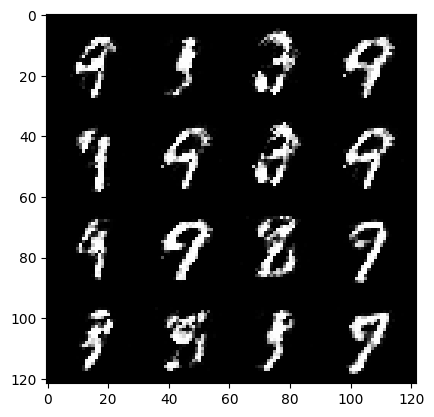

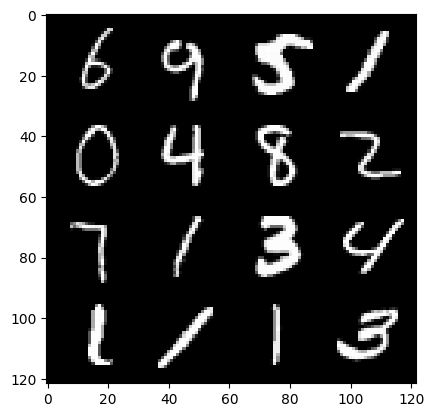

133: step 62400 / Gen loss: 3.138186796506245 / disc_loss: 0.14748818171521033


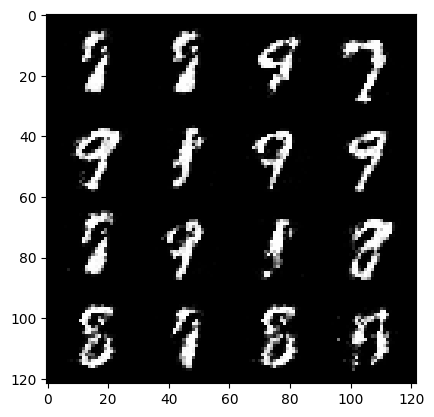

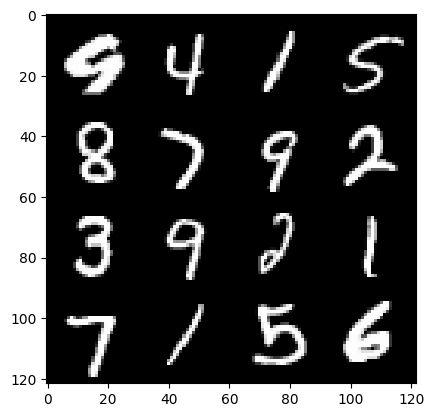

133: step 62700 / Gen loss: 3.3694240069389334 / disc_loss: 0.13807810790836814


  0%|          | 0/469 [00:00<?, ?it/s]

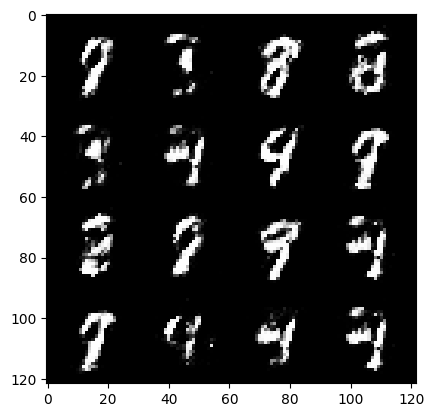

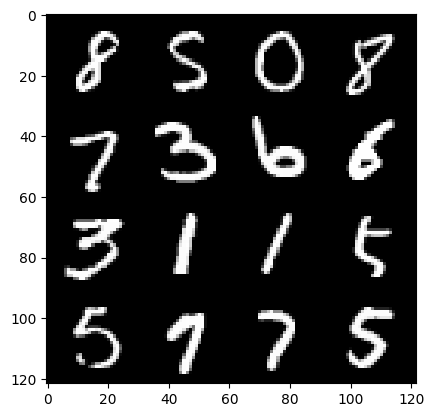

134: step 63000 / Gen loss: 3.172401554584503 / disc_loss: 0.166179492585361


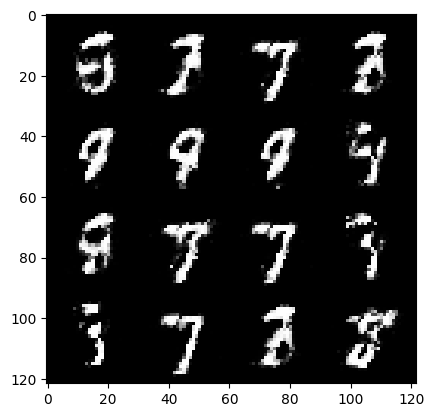

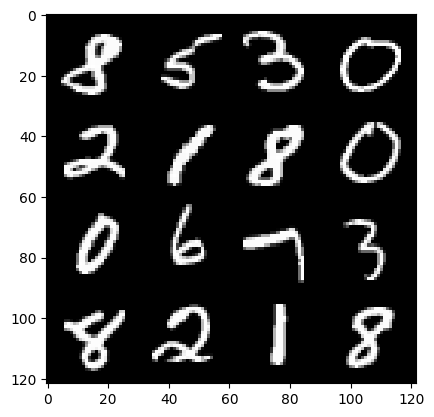

134: step 63300 / Gen loss: 2.921075978279113 / disc_loss: 0.17495755610366664


  0%|          | 0/469 [00:00<?, ?it/s]

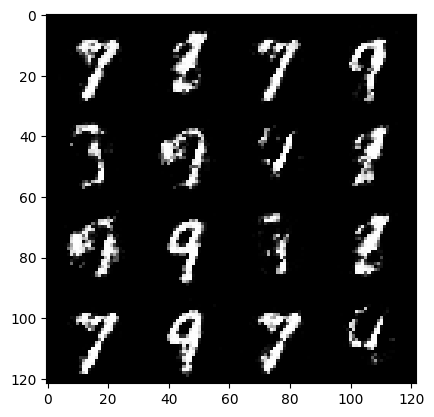

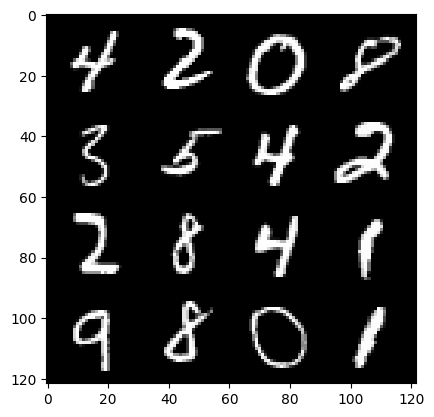

135: step 63600 / Gen loss: 3.229719285170236 / disc_loss: 0.157207566127181


  0%|          | 0/469 [00:00<?, ?it/s]

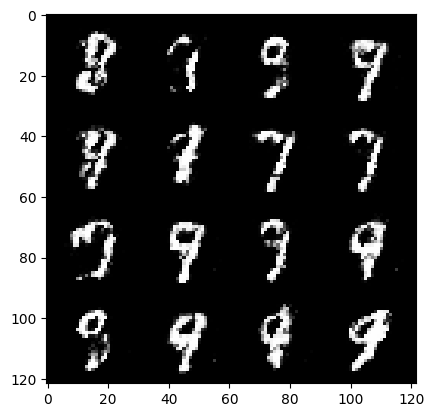

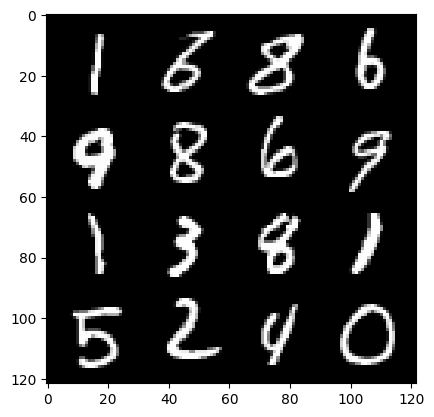

136: step 63900 / Gen loss: 2.9685880223909997 / disc_loss: 0.1700117997576793


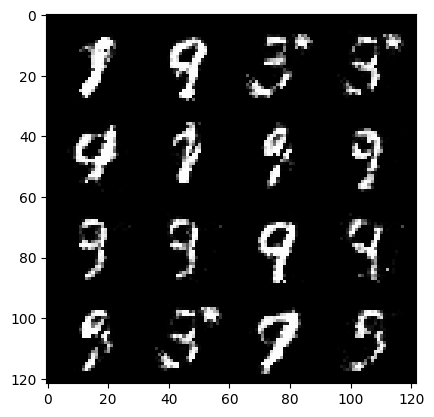

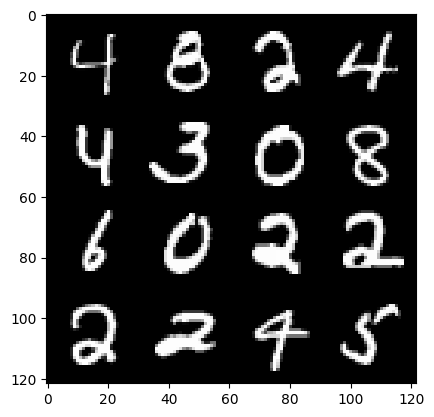

136: step 64200 / Gen loss: 3.1673429989814728 / disc_loss: 0.16178487360477461


  0%|          | 0/469 [00:00<?, ?it/s]

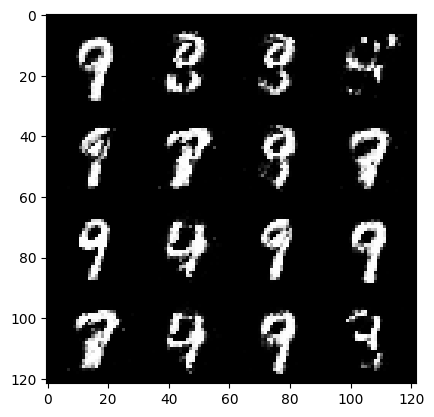

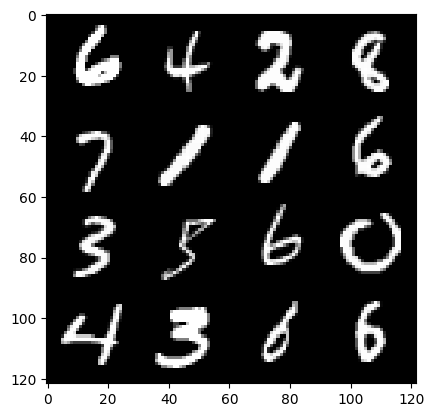

137: step 64500 / Gen loss: 2.9641354417800923 / disc_loss: 0.17610590169827153


  0%|          | 0/469 [00:00<?, ?it/s]

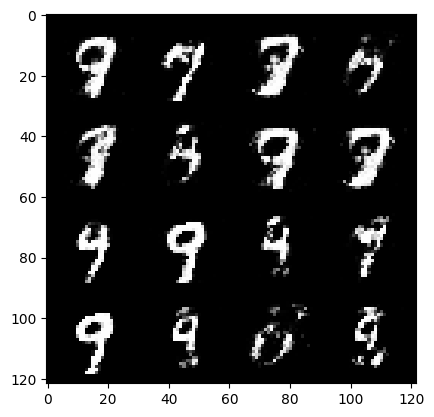

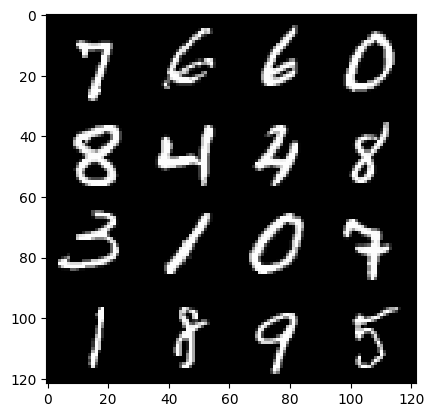

138: step 64800 / Gen loss: 2.9627653169631953 / disc_loss: 0.18390183197955282


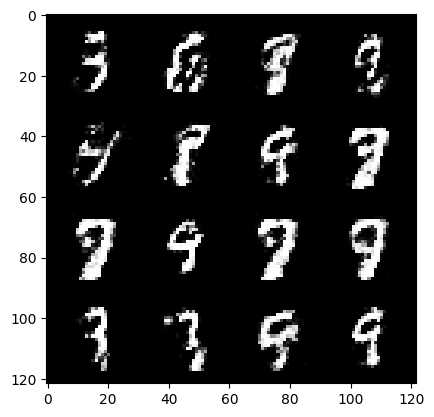

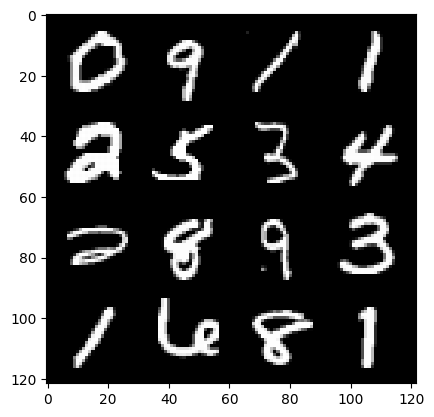

138: step 65100 / Gen loss: 3.0580558307965586 / disc_loss: 0.16126854727665582


  0%|          | 0/469 [00:00<?, ?it/s]

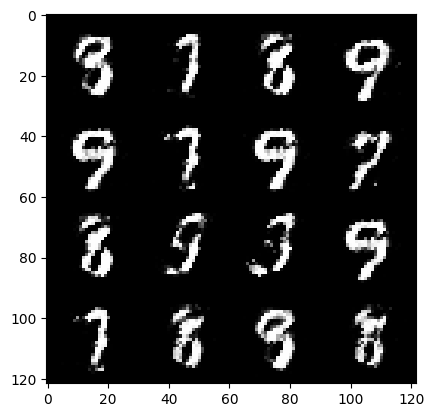

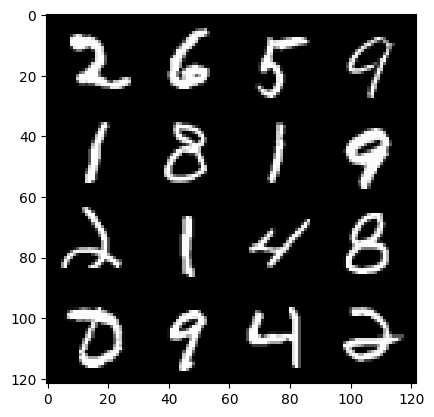

139: step 65400 / Gen loss: 3.055410718123119 / disc_loss: 0.1711519518742959


  0%|          | 0/469 [00:00<?, ?it/s]

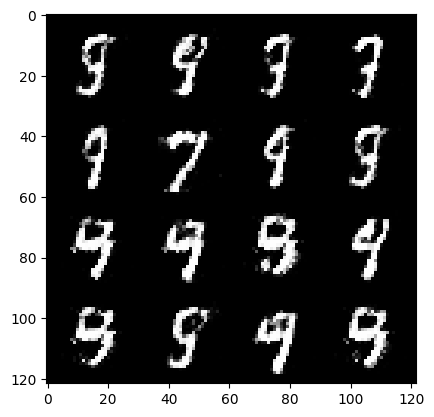

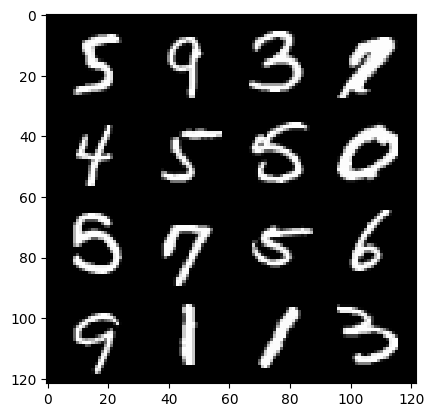

140: step 65700 / Gen loss: 2.9790506068865494 / disc_loss: 0.18127003463606048


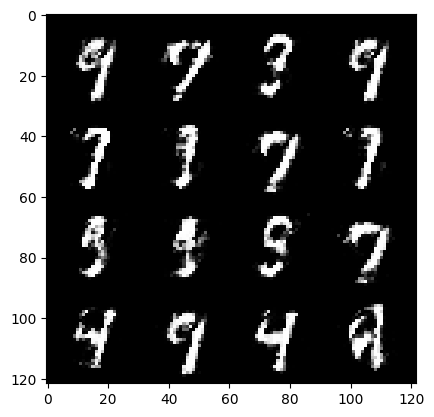

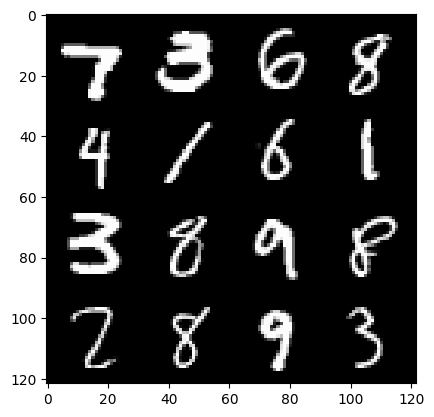

140: step 66000 / Gen loss: 3.1251068917910247 / disc_loss: 0.15028343170881267


  0%|          | 0/469 [00:00<?, ?it/s]

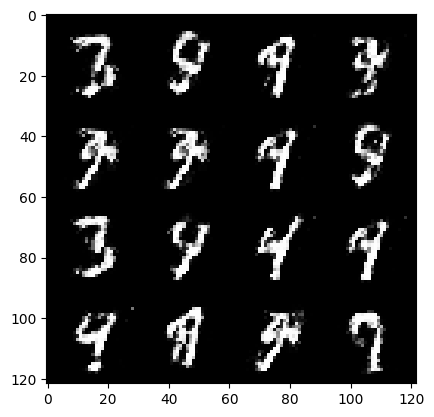

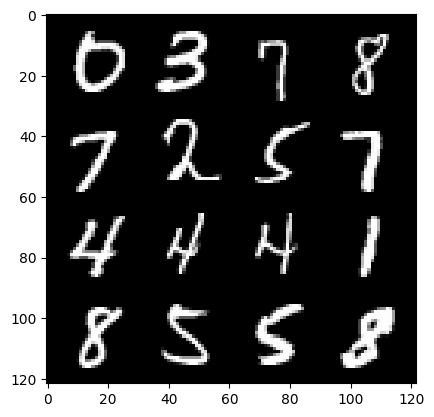

141: step 66300 / Gen loss: 3.058315852483114 / disc_loss: 0.17077113501727575


  0%|          | 0/469 [00:00<?, ?it/s]

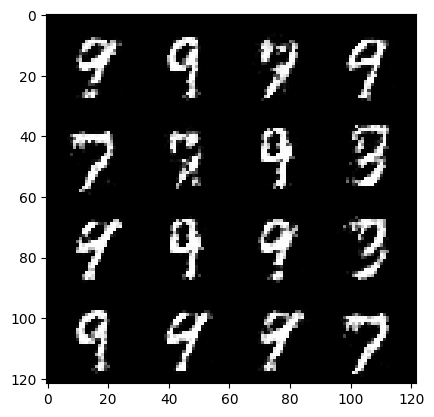

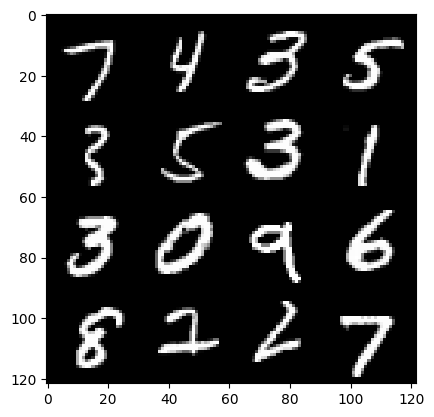

142: step 66600 / Gen loss: 2.87296464443207 / disc_loss: 0.17455697422226274


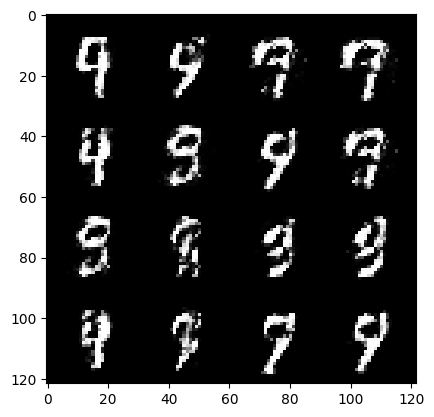

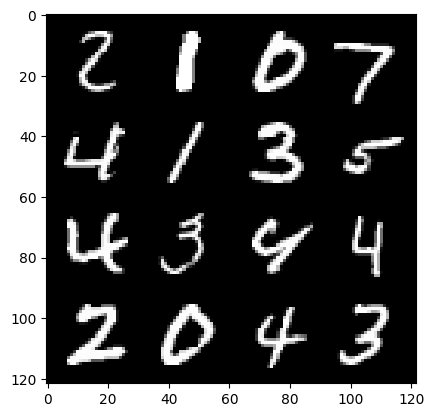

142: step 66900 / Gen loss: 3.0499767820040407 / disc_loss: 0.1619116848458847


  0%|          | 0/469 [00:00<?, ?it/s]

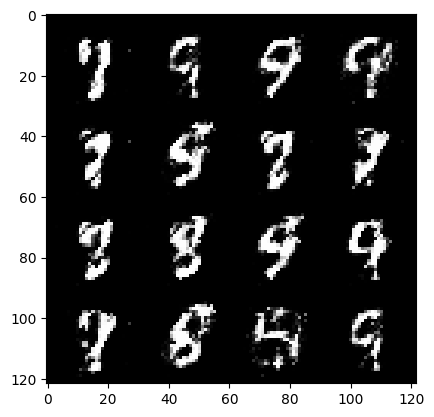

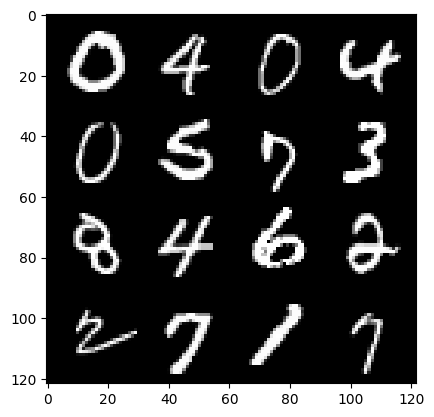

143: step 67200 / Gen loss: 3.0175233403841655 / disc_loss: 0.16067371216913048


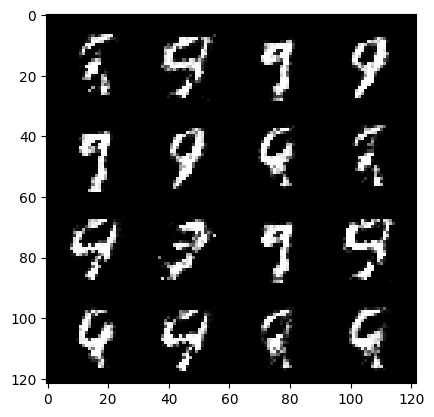

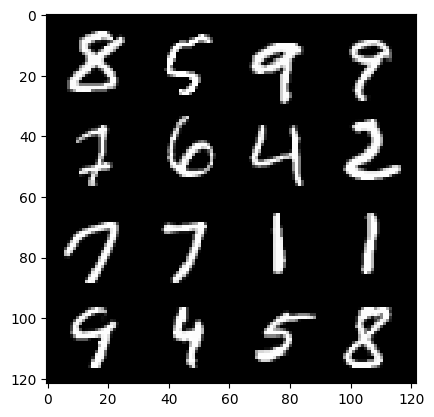

143: step 67500 / Gen loss: 3.0619807211558028 / disc_loss: 0.15714596219360813


  0%|          | 0/469 [00:00<?, ?it/s]

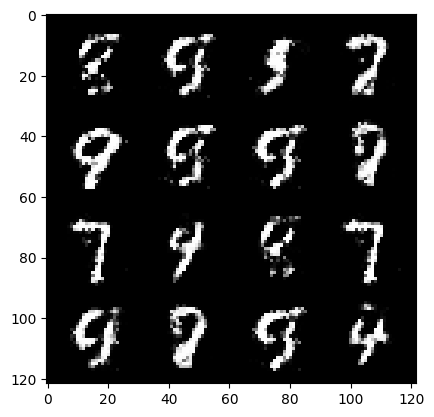

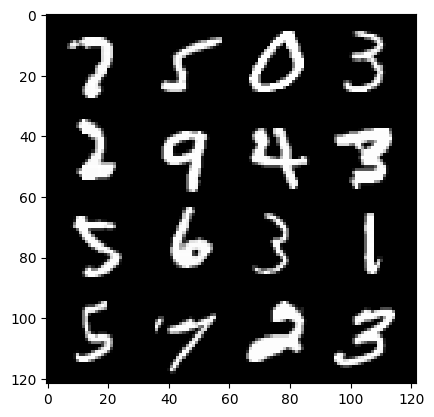

144: step 67800 / Gen loss: 3.0084375301996853 / disc_loss: 0.16968852174778776


  0%|          | 0/469 [00:00<?, ?it/s]

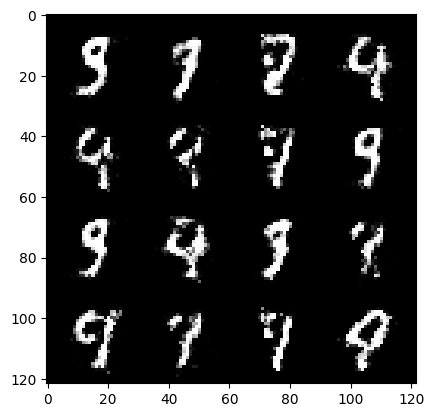

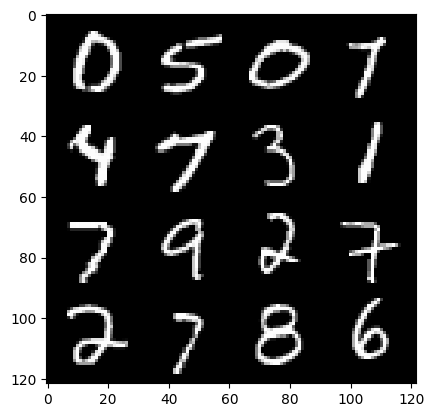

145: step 68100 / Gen loss: 3.098945969740549 / disc_loss: 0.14214341551065449


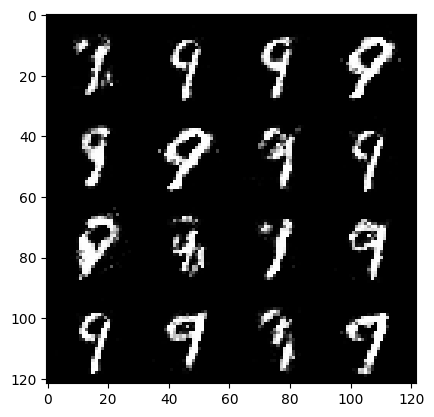

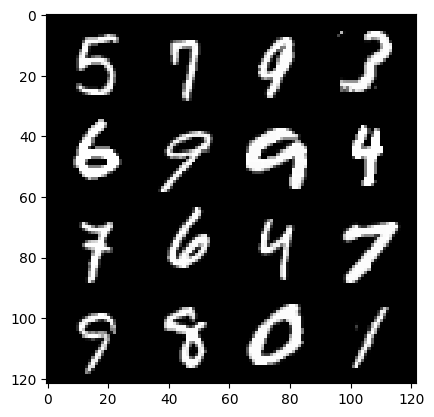

145: step 68400 / Gen loss: 3.2794199045499166 / disc_loss: 0.14222060458113756


  0%|          | 0/469 [00:00<?, ?it/s]

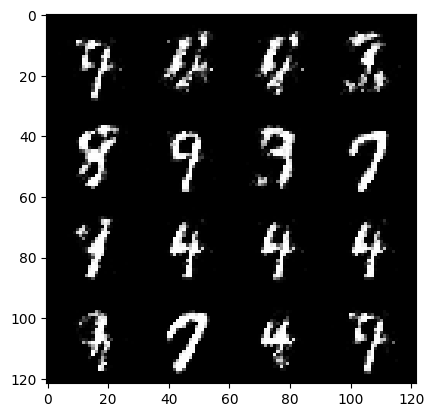

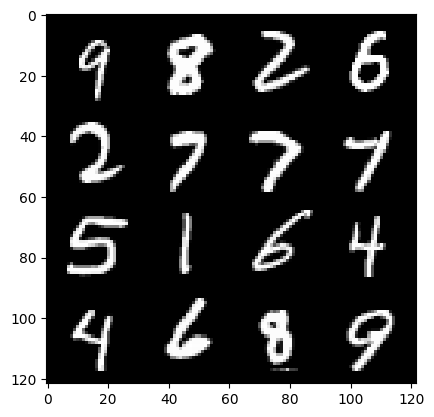

146: step 68700 / Gen loss: 3.0235617828369152 / disc_loss: 0.15065037245551738


  0%|          | 0/469 [00:00<?, ?it/s]

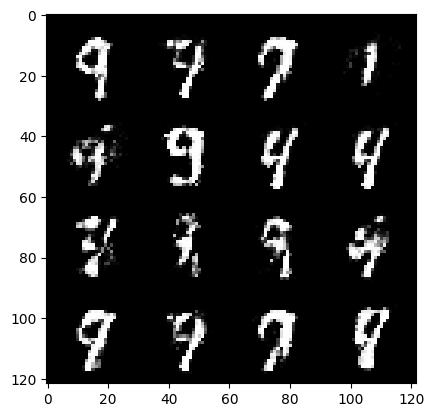

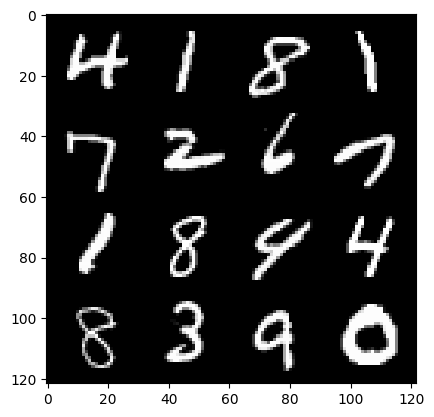

147: step 69000 / Gen loss: 3.006748229662576 / disc_loss: 0.1725878241906563


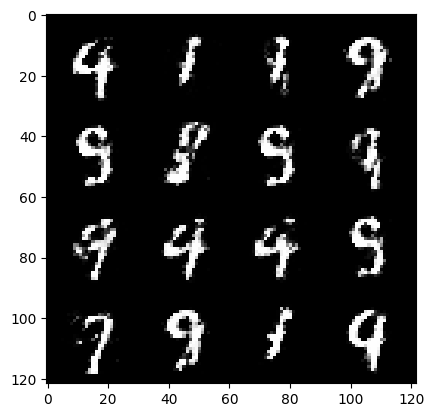

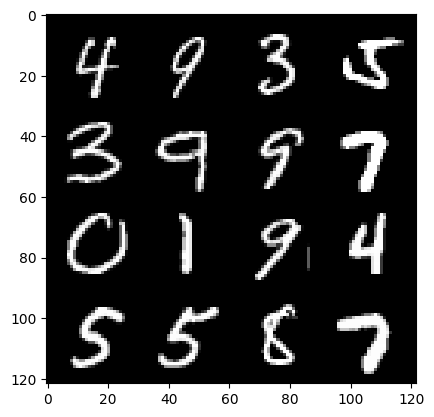

147: step 69300 / Gen loss: 2.9516173179944376 / disc_loss: 0.168373411645492


  0%|          | 0/469 [00:00<?, ?it/s]

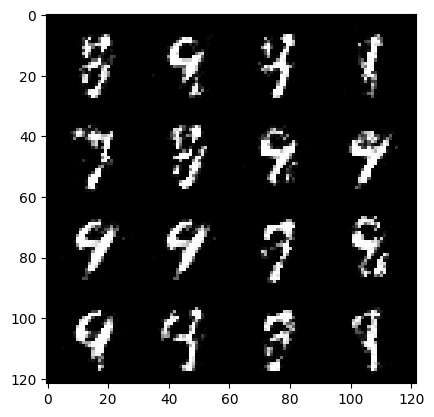

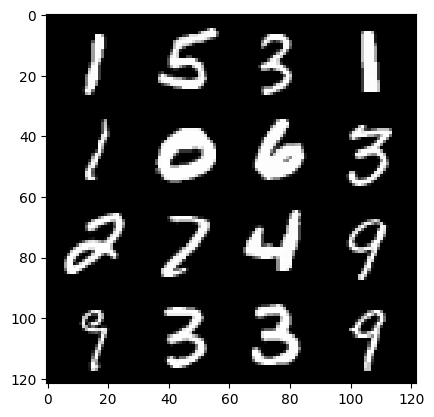

148: step 69600 / Gen loss: 3.0051535272598264 / disc_loss: 0.16242028310894954


  0%|          | 0/469 [00:00<?, ?it/s]

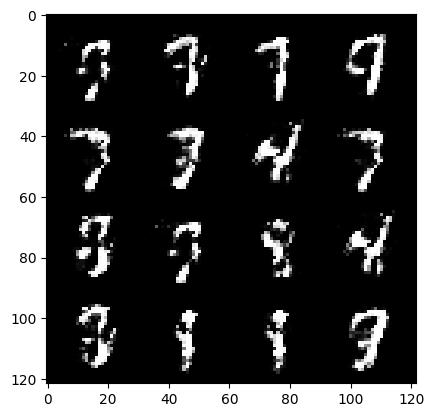

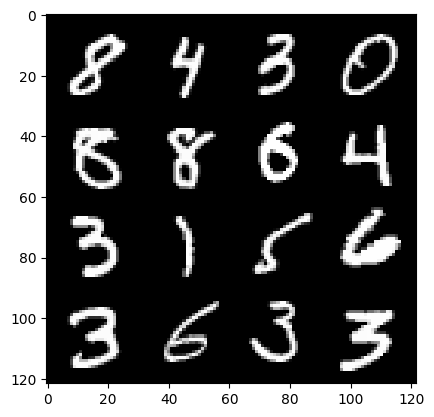

149: step 69900 / Gen loss: 2.861624697844188 / disc_loss: 0.17662721909582618


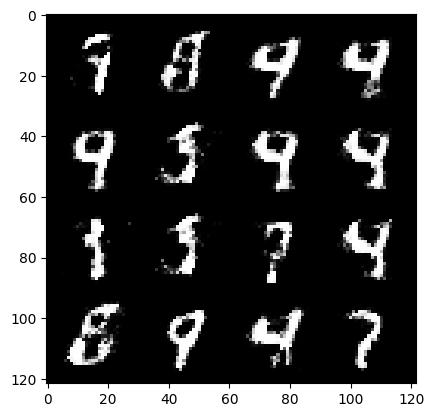

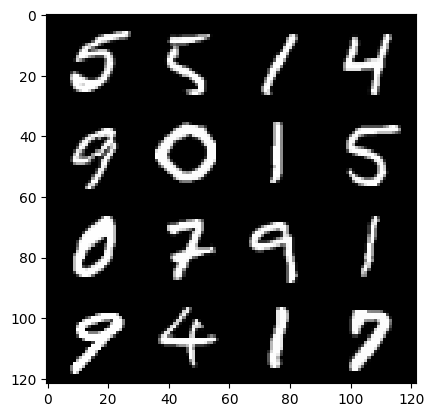

149: step 70200 / Gen loss: 2.94263241847356 / disc_loss: 0.17724658851822223


  0%|          | 0/469 [00:00<?, ?it/s]

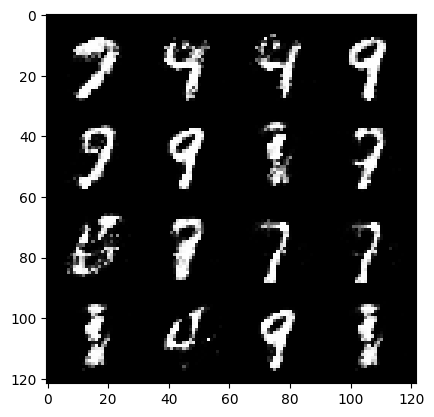

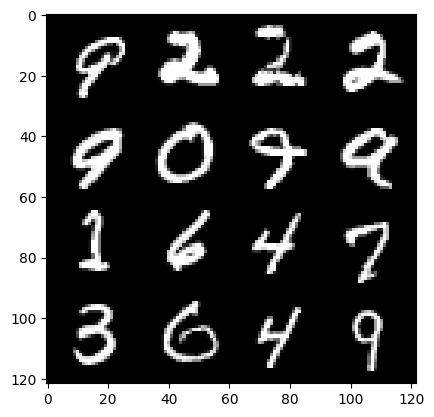

150: step 70500 / Gen loss: 2.976374127864835 / disc_loss: 0.1685097499688466


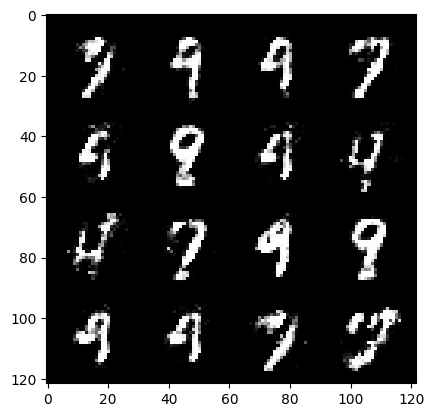

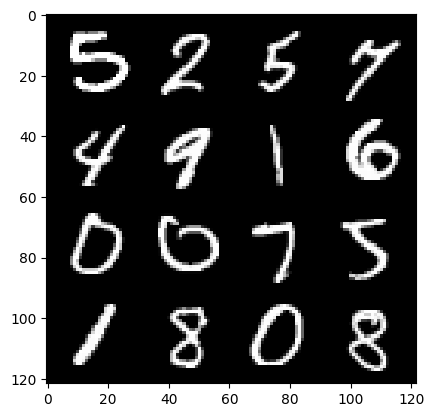

150: step 70800 / Gen loss: 2.8453715825080854 / disc_loss: 0.17850227492551007


  0%|          | 0/469 [00:00<?, ?it/s]

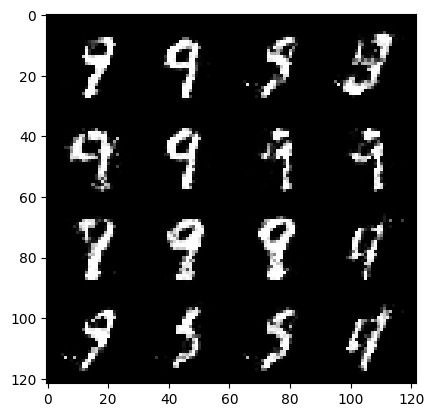

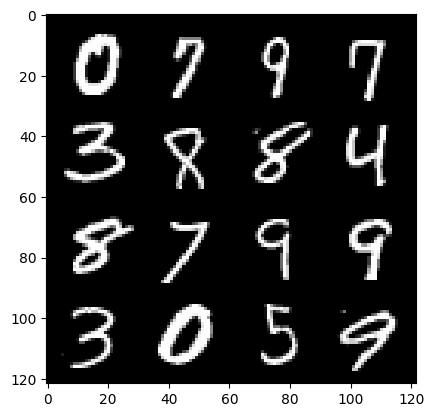

151: step 71100 / Gen loss: 3.137194461027781 / disc_loss: 0.1522361571093403


  0%|          | 0/469 [00:00<?, ?it/s]

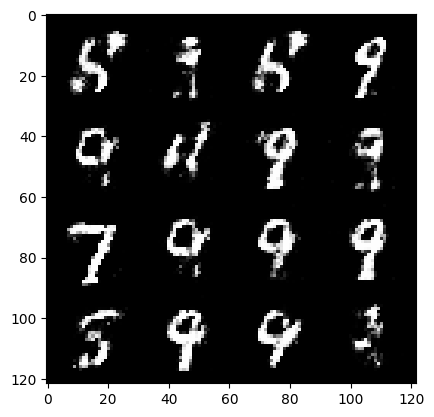

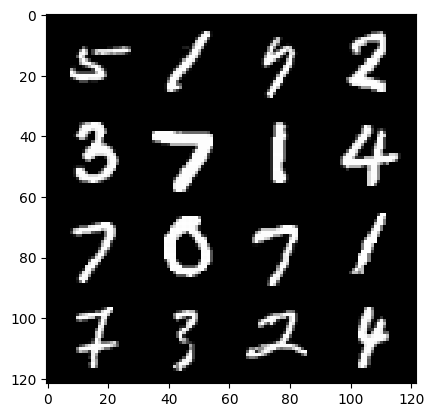

152: step 71400 / Gen loss: 2.777260076999664 / disc_loss: 0.195875039274494


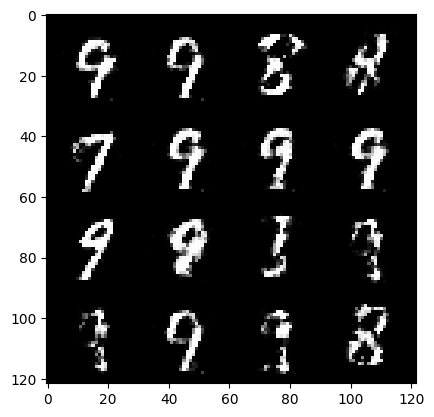

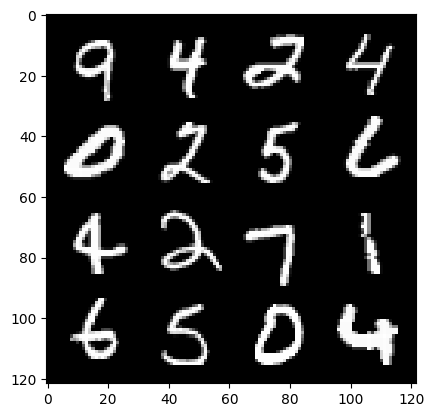

152: step 71700 / Gen loss: 2.8027417890230812 / disc_loss: 0.18067517797152208


  0%|          | 0/469 [00:00<?, ?it/s]

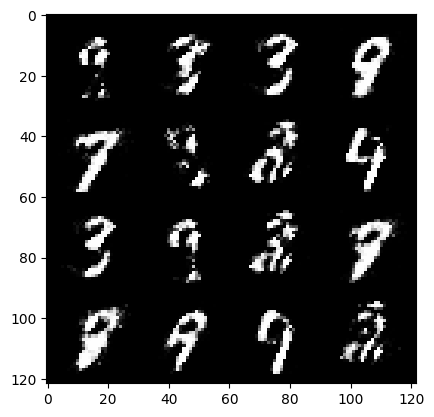

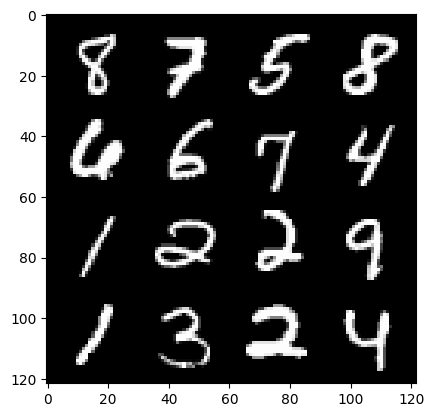

153: step 72000 / Gen loss: 3.0359229365984586 / disc_loss: 0.17579809630910553


  0%|          | 0/469 [00:00<?, ?it/s]

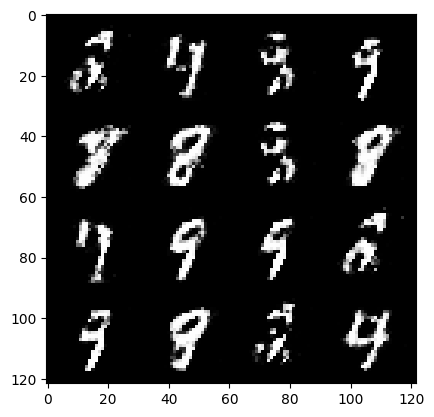

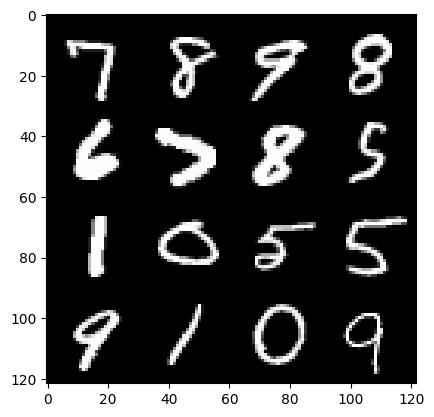

154: step 72300 / Gen loss: 2.7902166517575604 / disc_loss: 0.19293942883610724


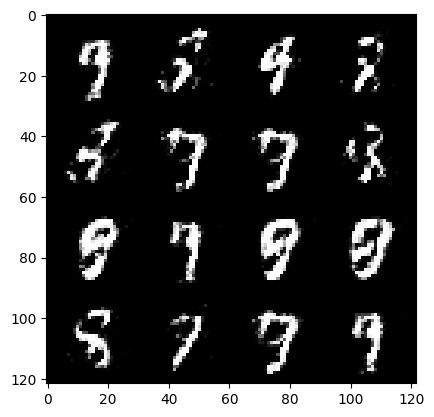

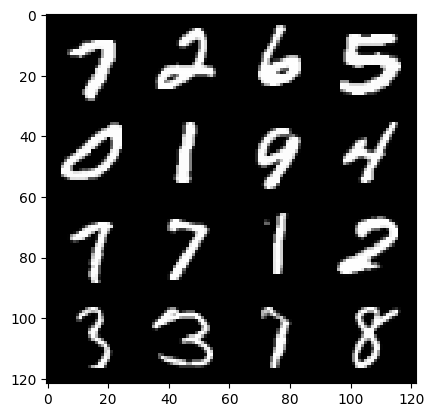

154: step 72600 / Gen loss: 2.8066146596272796 / disc_loss: 0.18704352214932432


  0%|          | 0/469 [00:00<?, ?it/s]

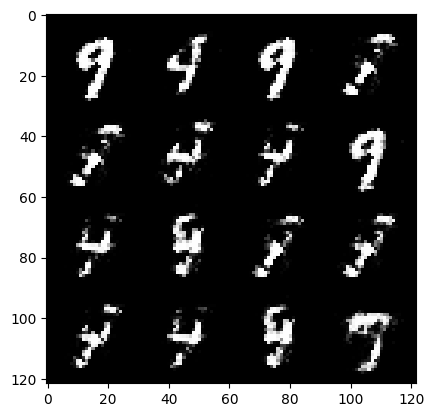

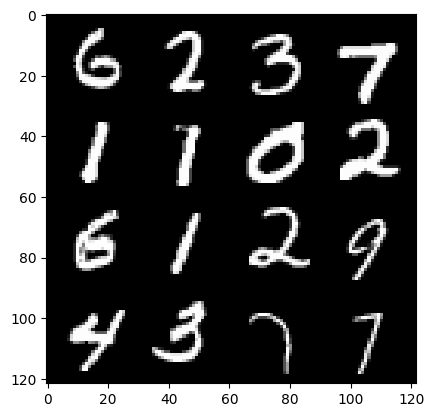

155: step 72900 / Gen loss: 2.764530956745146 / disc_loss: 0.17562149800360202


  0%|          | 0/469 [00:00<?, ?it/s]

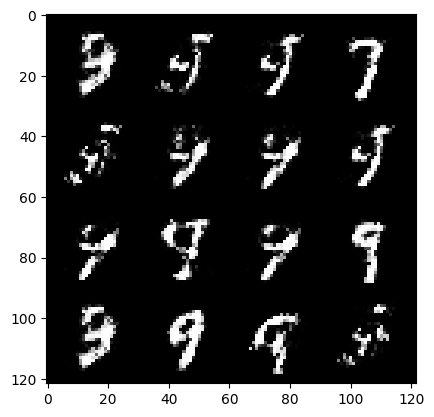

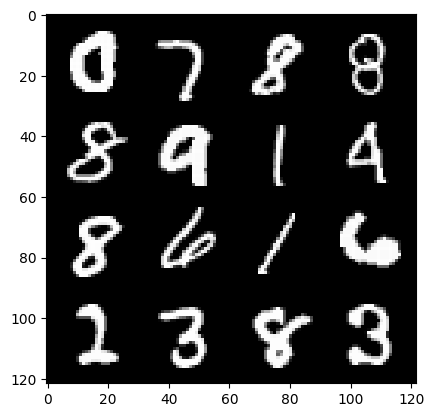

156: step 73200 / Gen loss: 2.871710344155632 / disc_loss: 0.17806871774295968


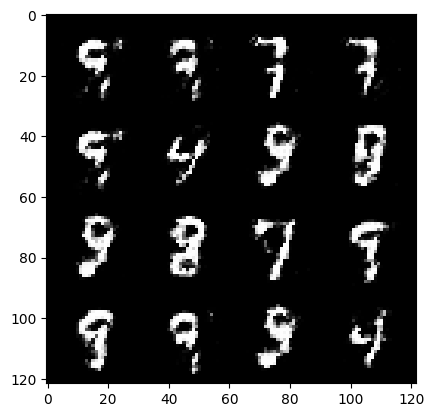

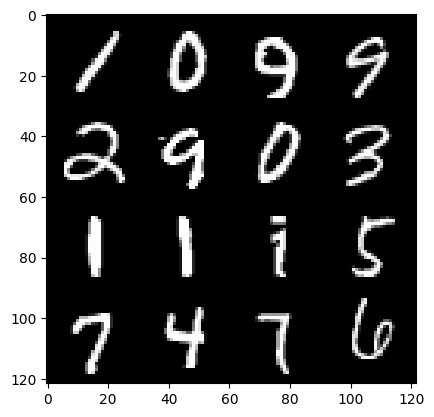

156: step 73500 / Gen loss: 2.8091117835044854 / disc_loss: 0.1799476312349241


  0%|          | 0/469 [00:00<?, ?it/s]

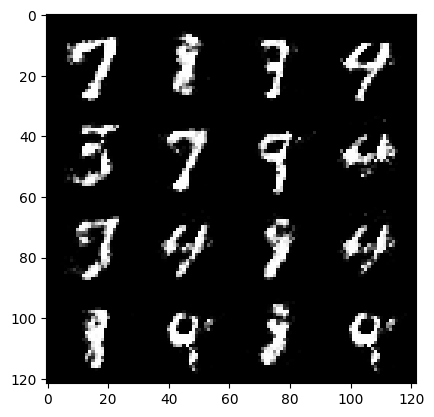

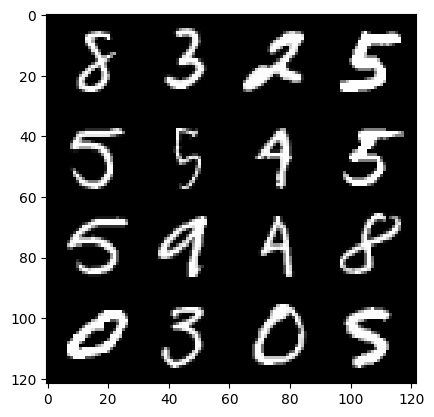

157: step 73800 / Gen loss: 3.1710027972857167 / disc_loss: 0.16030718820790454


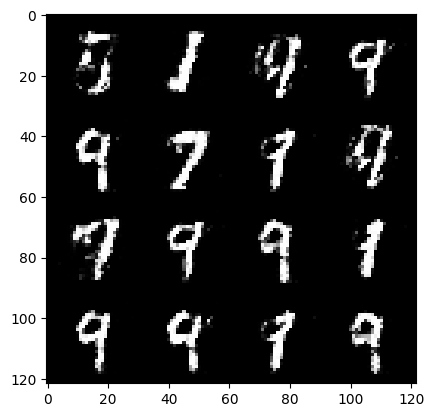

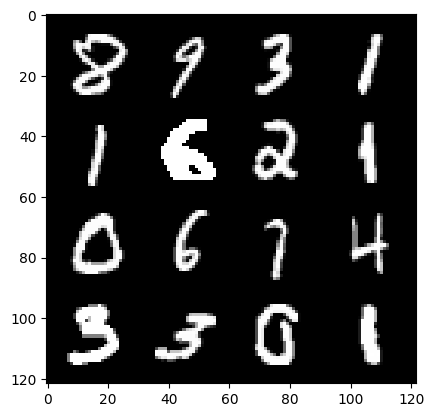

157: step 74100 / Gen loss: 2.9576294843355826 / disc_loss: 0.17189763411879525


  0%|          | 0/469 [00:00<?, ?it/s]

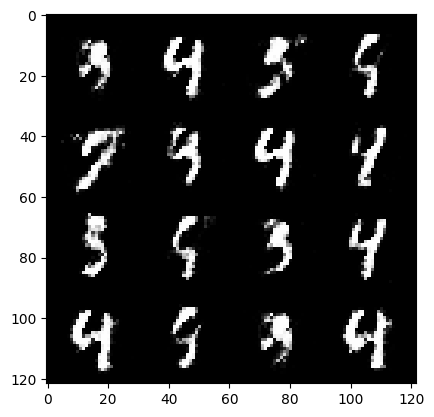

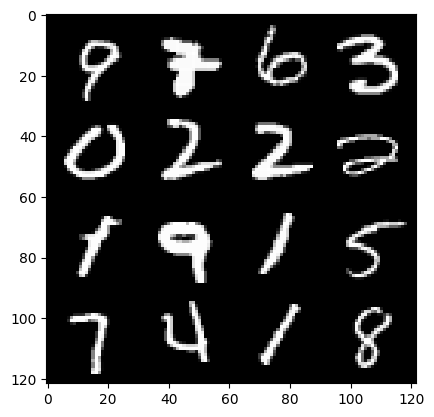

158: step 74400 / Gen loss: 2.8977115639050792 / disc_loss: 0.17883860478798547


  0%|          | 0/469 [00:00<?, ?it/s]

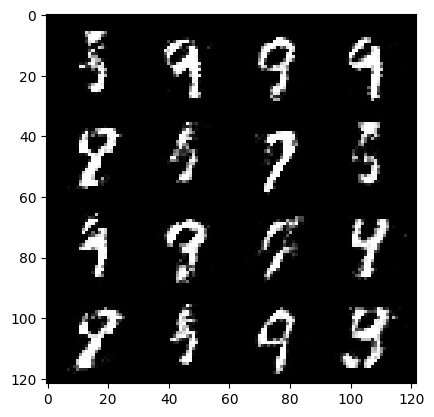

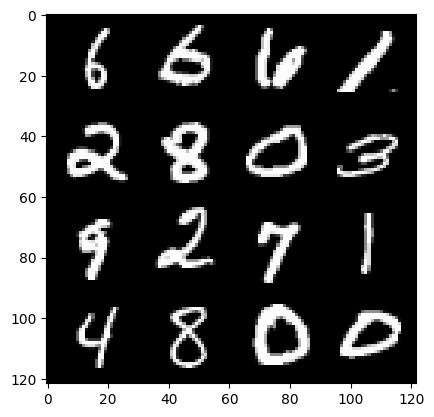

159: step 74700 / Gen loss: 2.8231818620363858 / disc_loss: 0.18681841256717835


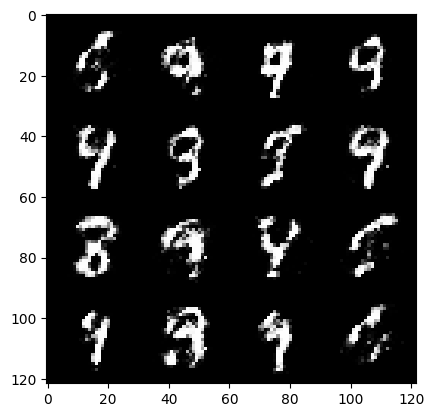

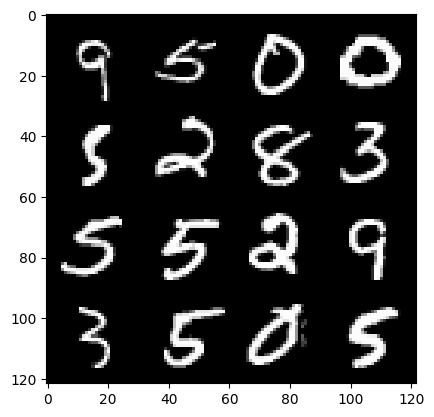

159: step 75000 / Gen loss: 2.66425179560979 / disc_loss: 0.19671316082278892


  0%|          | 0/469 [00:00<?, ?it/s]

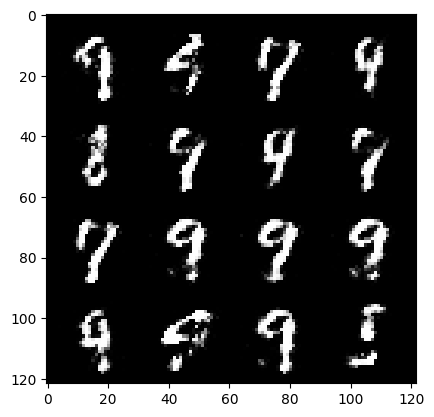

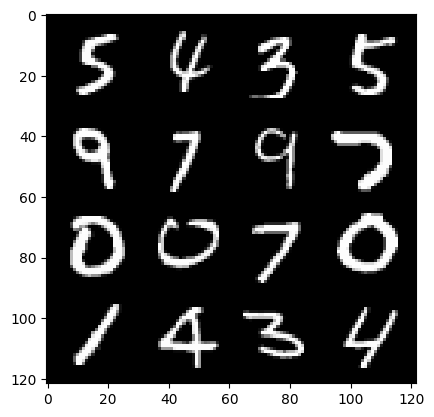

160: step 75300 / Gen loss: 2.8216308148702014 / disc_loss: 0.19749712596337016


  0%|          | 0/469 [00:00<?, ?it/s]

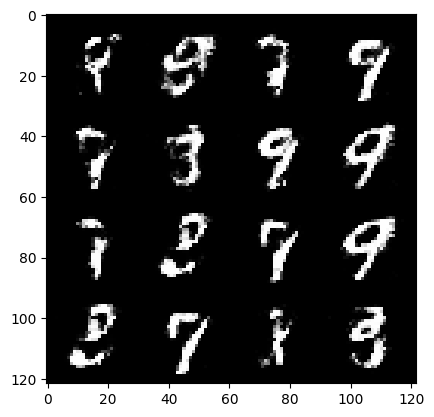

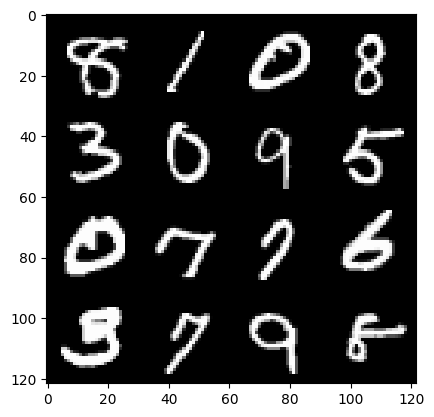

161: step 75600 / Gen loss: 2.7229155174891155 / disc_loss: 0.19200169409314796


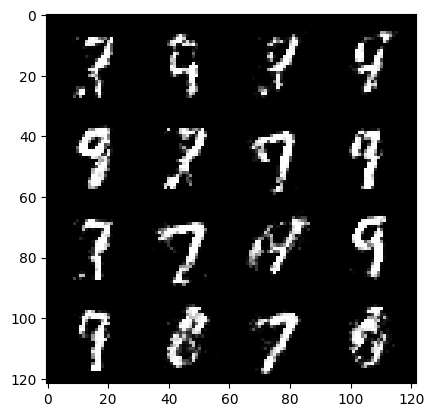

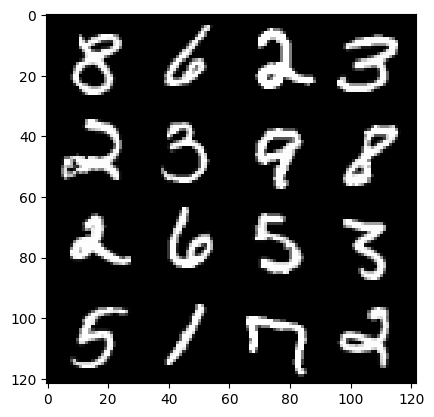

161: step 75900 / Gen loss: 2.7685372106234256 / disc_loss: 0.1921211615204811


  0%|          | 0/469 [00:00<?, ?it/s]

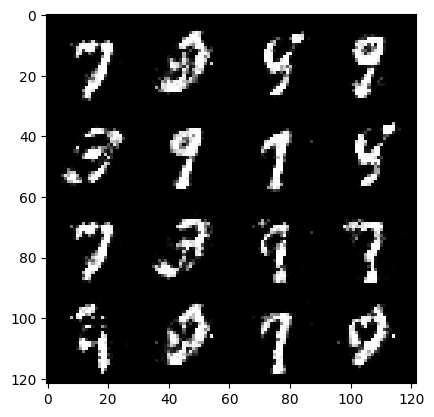

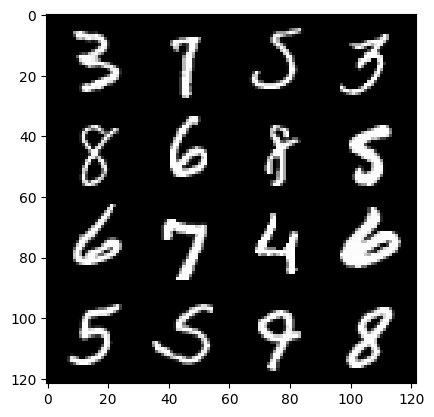

162: step 76200 / Gen loss: 2.7028471557299283 / disc_loss: 0.20261871084570895


  0%|          | 0/469 [00:00<?, ?it/s]

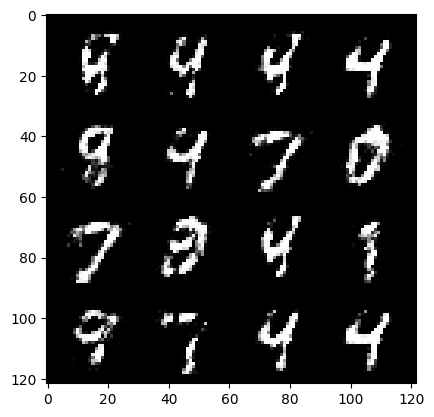

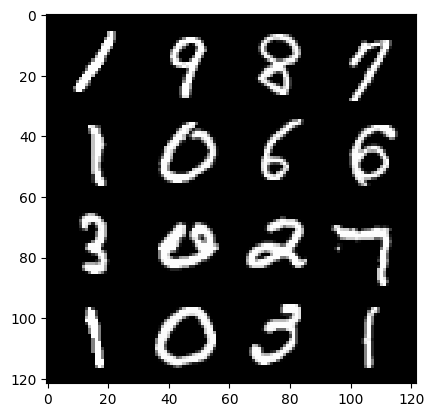

163: step 76500 / Gen loss: 2.744452320734659 / disc_loss: 0.1842906414469082


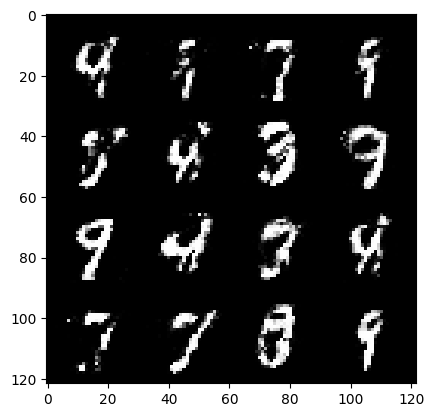

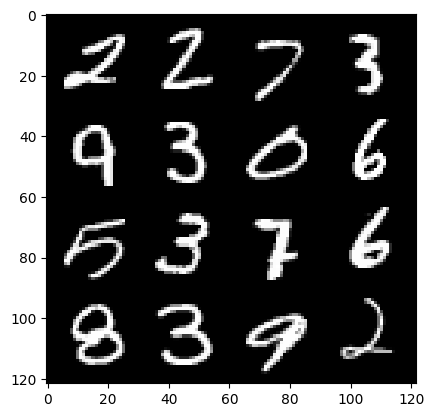

163: step 76800 / Gen loss: 2.8828999876976 / disc_loss: 0.16670599011083448


  0%|          | 0/469 [00:00<?, ?it/s]

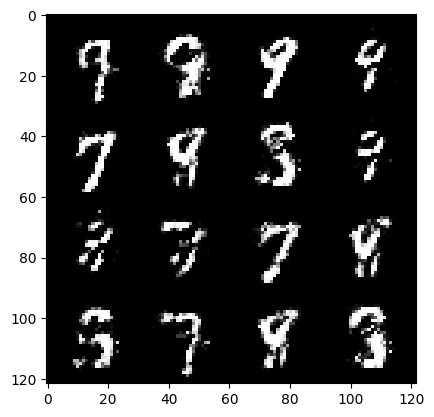

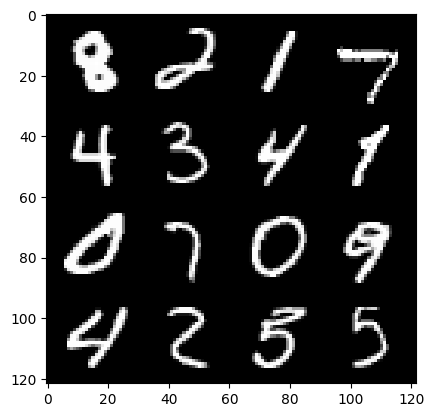

164: step 77100 / Gen loss: 2.745092973709109 / disc_loss: 0.1922602880746128


  0%|          | 0/469 [00:00<?, ?it/s]

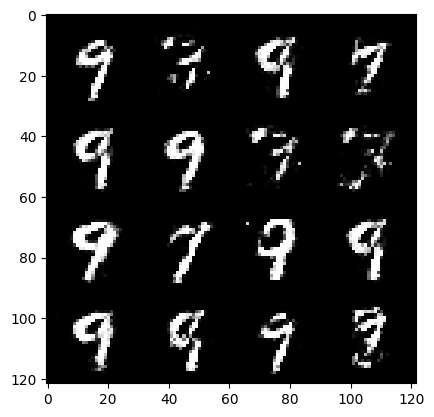

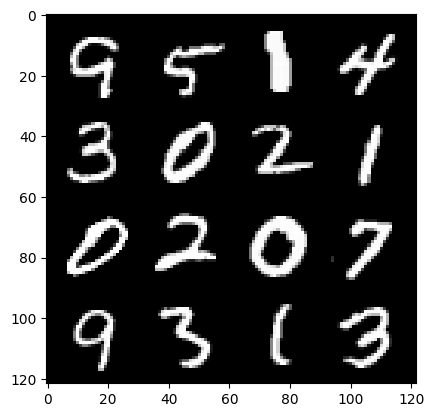

165: step 77400 / Gen loss: 2.715989162127178 / disc_loss: 0.1957647660374642


In [ ]:
### 60000 / 128 = 468.75  = 469 steps in each epoch
### Each step is going to process 128 images = size of the batch (except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ### discriminator
    disc_opt.zero_grad()

    cur_bs=len(real) # real: 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)
    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    ### generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    ### visualization & stats
    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0,0
    cur_step+=1
